In [1]:
import json
import os
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

In [2]:
import matplotlib.pyplot as plt
import numpy as np

def denormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """Денормализует изображение для визуализации с обработкой разных форматов"""
    if isinstance(tensor, np.ndarray):
        tensor = torch.from_numpy(tensor)
    elif not isinstance(tensor, torch.Tensor):
        raise ValueError("Input must be torch.Tensor or numpy.ndarray")
    
    tensor = tensor.clone()
    if tensor.dim() == 3:
        # Одиночное изображение [C, H, W]
        for t, m, s in zip(tensor, mean, std):
            t.mul_(s).add_(m)
    elif tensor.dim() == 4:
        # Батч изображений [B, C, H, W]
        for c in range(tensor.size(1)):
            tensor[:, c].mul_(std[c]).add_(mean[c])
    tensor = torch.clamp(tensor, 0, 1)
    return tensor

def visualize_batch(dataloader, n_images=16, figsize=(20, 10), save_path=None):
    """Визуализирует батч изображений с таргетами"""
    # Получаем первый батч
    try:
        batch = next(iter(dataloader))
        if batch is None:
            print("Error: Received empty batch")
            return
            
        images = batch['images']
        targets = batch['targets']
        recipe_ids = batch.get('recipe_ids', ['N/A']*len(images))
        local_found = batch.get('local_found', [True]*len(images))
    except Exception as e:
        print(f"Error loading batch: {e}")
        return
    
    # Проверяем размер батча
    n_images = min(n_images, len(images))
    n_cols = min(8, n_images)  # Максимум 8 колонок
    n_rows = int(np.ceil(n_images / n_cols))
    
    # Создаем сетку для отображения
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    if n_rows == 1 and n_cols == 1:
        axes = np.array([axes])
    axes = axes.ravel()
    
    for i in range(n_images):
        ax = axes[i]
        try:
            # Денормализуем и преобразуем изображение
            img = denormalize(images[i])
            img_np = img.permute(1, 2, 0).numpy()
            
            # Получаем информацию о рецепте
            energy_kcal = targets[i].item() if torch.is_tensor(targets[i]) else targets[i]
            recipe_id = recipe_ids[i]
            local = local_found[i]
            
            # Отображаем изображение
            ax.imshow(img_np)
            title = f"{recipe_id[:8]}...\n{energy_kcal:.0f} kcal"
            if not local:
                title += "\n(downloaded)"
            ax.set_title(title, fontsize=9)
            ax.axis('off')
            
            # Добавляем рамку для скачанных изображений
            if not local:
                for spine in ax.spines.values():
                    spine.set_edgecolor('red')
                    spine.set_linewidth(2)
        except Exception as e:
            print(f"Error processing image {i}: {e}")
            ax.imshow(np.zeros((224, 224, 3)))
            ax.set_title("Error", color='red')
            ax.axis('off')
    
    # Скрываем пустые оси
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    
    # Сохраняем если нужно
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=150)
        print(f"Saved visualization to {save_path}")
    
    plt.show()
    
    # Выводим статистику
    print("\nBatch statistics:")
    print(f"Images shape: {images.shape}")
    print(f"Targets shape: {targets.shape}")
    
    if len(targets) > 0:
        targets_np = targets.numpy() if torch.is_tensor(targets) else np.array(targets)
        print(f"\nTargets summary:")
        print(f"Min: {np.min(targets_np):.1f} kcal")
        print(f"Max: {np.max(targets_np):.1f} kcal")
        print(f"Mean: {np.mean(targets_np):.1f} kcal")
        print(f"Std: {np.std(targets_np):.1f} kcal")

# Пример использования
visualize_batch(
    dataloader,
    n_images=16,
    figsize=(20, 12),
    save_path='batch_visualization.png'
)

NameError: name 'dataloader' is not defined

In [ ]:
import json
import os
from PIL import Image
import torch
from torch.utils.data import Dataset
from torchvision import transforms

class ValidRecipeDataset(Dataset):
    def __init__(self, valid_json_path, transform=None):
        """
        Улучшенный датасет для работы с композитным лоссом
        
        Args:
            valid_json_path (str): Путь к JSON с валидными рецептами
            transform (callable, optional): Трансформации изображений
        """
        with open(valid_json_path, 'r') as f:
            self.recipes = json.load(f)
        
        self.transform = transform or self.default_transform()
        print(f"Loaded {len(self.recipes)} recipes with valid images")

    def default_transform(self):
        """Трансформации по умолчанию"""
        return transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                               std=[0.229, 0.224, 0.225])
        ])

    def __len__(self):
        return len(self.recipes)

    def __getitem__(self, idx):
        recipe = self.recipes[idx]
        img_info = recipe['images'][0]
        image_path = img_info['valid_path']
        
        # Загрузка изображения
        try:
            image = Image.open(image_path).convert('RGB')
            if self.transform:
                image = self.transform(image)
        except Exception as e:
            print(f"Error loading image {image_path}: {e}")
            
        # Подготовка всех таргетов для композитного лосса
        nutr_per100g = recipe['nutr_per100g']
        nutr_per_portion = recipe['nutr_per_portion']
        
        # Расчет пропорций БЖУ (правильный способ)
        total_bzu = (nutr_per100g['protein_g'] + 
                    nutr_per100g['fat_g'] + 
                    nutr_per100g['carbs_g']+1e-8)
        targets = {
            'weight': torch.tensor([recipe['total_weight_g']], dtype=torch.float32),
            'bzu_100g': torch.tensor([
                nutr_per100g['protein_g'],
                nutr_per100g['fat_g'],
                nutr_per100g['carbs_g']
            ], dtype=torch.float32),
            'calories_100g': torch.tensor([nutr_per100g['energy_kcal']], dtype=torch.float32),
            'bzu_proportions': torch.tensor([
                nutr_per100g['protein_g'] / total_bzu,
                nutr_per100g['fat_g'] / total_bzu,
                nutr_per100g['carbs_g'] / total_bzu
            ], dtype=torch.float32),
            # 'micro': torch.tensor([
            #     nutr_per_portion['sugars_g'],
            #     nutr_per_portion['salt_g'],
            #     nutr_per_portion['saturated_fat_g']
            # ], dtype=torch.float32)
        }
        
        return {
            'image': image,
            'targets': targets,
            'recipe_id': recipe['id'],
            'image_path': image_path
        }

def food_collate_fn(batch):
    """Кастомная функция для объединения в батчи"""
    images = torch.stack([item['image'] for item in batch])
    
    # Собираем все таргеты
    targets = {
        # 'weight': torch.stack([item['targets']['weight'] for item in batch]),
        'bzu': torch.stack([item['targets']['bzu_100g'] for item in batch]),
        'calories': torch.stack([item['targets']['calories_100g'] for item in batch]),
        'bzu_proportions': torch.stack([item['targets']['bzu_proportions'] for item in batch]),
        # 'micro': torch.stack([item['targets']['micro'] for item in batch])
    }
    
    return {
        'images': images,
        'targets': targets,
        'recipe_ids': [item['recipe_id'] for item in batch],
        'image_paths': [item['image_path'] for item in batch]
    }

# Пример использования:
dataset = ValidRecipeDataset(
    valid_json_path='./processed_recipes/train_fix.json',
    transform=None  # Можно указать кастомные трансформации
)

dataloader = torch.utils.data.DataLoader(
    dataset,
    batch_size=32,
    shuffle=True,
    # num_workers=4,
    collate_fn=food_collate_fn,
    # pin_memory=True
)

Loaded 33698 recipes with valid images


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from typing import Union, Optional

def denormalize(
    tensor: Union[torch.Tensor, np.ndarray], 
    mean: list = [0.485, 0.456, 0.406], 
    std: list = [0.229, 0.224, 0.225]
) -> torch.Tensor:
    """Денормализует тензор изображения для визуализации
    
    Args:
        tensor: Входной тензор (3D или 4D)
        mean: Средние значения для каналов
        std: Стандартные отклонения для каналов
    
    Returns:
        Денормализованный тензор в диапазоне [0, 1]
    """
    if isinstance(tensor, np.ndarray):
        tensor = torch.from_numpy(tensor)
    elif not isinstance(tensor, torch.Tensor):
        raise ValueError("Input must be torch.Tensor or numpy.ndarray")
    
    tensor = tensor.clone()
    if tensor.dim() == 3:
        # Одиночное изображение [C, H, W]
        for t, m, s in zip(tensor, mean, std):
            t.mul_(s).add_(m)
    elif tensor.dim() == 4:
        # Батч изображений [B, C, H, W]
        for c in range(tensor.size(1)):
            tensor[:, c].mul_(std[c]).add_(mean[c])
    
    return torch.clamp(tensor, 0, 1)

def visualize_batch(
    dataloader: torch.utils.data.DataLoader,
    model: Optional[torch.nn.Module] = None,
    n_images: int = 16,
    figsize: tuple = (20, 10),
    save_path: Optional[str] = None,
    device: str = "cpu"
) -> None:
    """Визуализирует батч изображений с предсказаниями и таргетами
    
    Args:
        dataloader: DataLoader с данными
        model: Модель для предсказаний (опционально)
        n_images: Количество изображений для отображения
        figsize: Размер фигуры
        save_path: Путь для сохранения (опционально)
        device: Устройство для модели
    """
    try:
        batch = next(iter(dataloader))
        images = batch['images']
        targets = batch['targets']
        recipe_ids = batch.get('recipe_ids', ['N/A']*len(images))
    except Exception as e:
        print(f"Error loading batch: {e}")
        return
    
    # Получаем предсказания если есть модель
    preds = None
    if model is not None:
        model.eval()
        with torch.no_grad():
            preds = model(images.to(device))
    
    # Настройка отображения
    n_images = min(n_images, len(images))
    n_cols = min(8, n_images)
    n_rows = int(np.ceil(n_images / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    if n_rows == 1 and n_cols == 1:
        axes = np.array([axes])
    axes = axes.ravel()
    
    for i in range(n_images):
        ax = axes[i]
        try:
            # Денормализация и подготовка изображения
            img = denormalize(images[i]).permute(1, 2, 0).cpu().numpy()
            ax.imshow(img)
            
            # Формируем заголовок
            title_parts = []
            
            # ID рецепта
            if recipe_ids[i] != 'N/A':
                title_parts.append(f"ID: {recipe_ids[i][:8]}...")
            
            # Таргеты и предсказания
            if isinstance(targets, dict):
                target_kcal = targets['calories'][i].item()
                if preds:
                    pred_kcal = preds['calories'][i].item()
                    title_parts.append(f"Target: {target_kcal:.0f} kcal\nPred: {pred_kcal:.0f} kcal")
                else:
                    title_parts.append(f"{target_kcal:.0f} kcal")
            else:
                target_kcal = targets[i].item()
                title_parts.append(f"{target_kcal:.0f} kcal")
            
            ax.set_title("\n".join(title_parts), fontsize=9)
            ax.axis('off')
            
            # Подсветка ошибок
            if preds and isinstance(targets, dict):
                error = abs(pred_kcal - target_kcal)
                if error > 50:  # Порог для выделения
                    for spine in ax.spines.values():
                        spine.set_edgecolor('red')
                        spine.set_linewidth(2)
                        
        except Exception as e:
            print(f"Error processing image {i}: {e}")
            ax.imshow(np.zeros((224, 224, 3)))
            ax.set_title("Error", color='red')
            ax.axis('off')
    
    # Скрываем пустые оси
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=150)
        print(f"Saved to {save_path}")
    
    plt.show()
    
    # Вывод статистики
    print("\nBatch Statistics:")
    print(f"Images shape: {images.shape}")
    
    if isinstance(targets, dict):
        print("\nTargets Summary:")
        for k, v in targets.items():
            if torch.is_tensor(v):
                v = v.numpy()
                print(f"{k}: min={v.min():.1f}, max={v.max():.1f}, mean={v.mean():.1f}")
    elif torch.is_tensor(targets):
        targets_np = targets.numpy()
        print(f"\nTargets: min={targets_np.min():.1f}, max={targets_np.max():.1f}, mean={targets_np.mean():.1f}")


visualize_batch(
    dataloader,
    n_images=4,
    figsize=(16, 8),
    device='cuda'
)

NameError: name 'dataloader' is not defined

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import json
import os
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

In [4]:
class CompositeFoodLoss(nn.Module):
    """
    Комбинированная функция потерь:
    - MSE для веса
    - MSE для абсолютных значений БЖУ
    - MSE для калорий
    - KL-дивергенция для пропорций БЖУ
    - Физическая согласованность калорий
    """
    def __init__(self, weights={'weight':0.1, 'bzu':0.4, 'cal':0.6, 'kl':1.}):
        super().__init__()
        self.weights = weights
        self.mse = nn.MSELoss()
        self.kl = nn.KLDivLoss(reduction='batchmean')
        self.huber = nn.SmoothL1Loss(beta=0.5)
        
    def forward(self, outputs, targets):
        # Основные потери
        # loss_weight = self.mse(outputs['weight'], targets['weight'])
        loss_bzu = self.huber(outputs['bzu'], targets['bzu'])
        loss_cal = self.mse(torch.log1p(outputs['calories']), torch.log1p(targets['calories']))
        
        # KL-дивергенция для пропорций
        true_proportions = targets['bzu_proportions'] 
        loss_kl = self.kl(torch.log(outputs['bzu_proportions'] + 1e-8), true_proportions)
        
        # Физическая согласованность
        loss_phys = self.mse(
            torch.log1p(outputs['calculated_cal']), torch.log1p(targets['calories'])
        )

        # Комбинированная потеря
        total_loss = (
            self.weights['bzu'] * loss_bzu +
            self.weights['cal'] * (loss_cal + 0.5*loss_phys) +
            self.weights['kl'] * loss_kl
        )
        
        return {
            'total': total_loss,
            # 'weight': loss_weight,
            'bzu': loss_bzu,
            'cal': loss_cal,
            'kl': loss_kl,
            'phys': loss_phys
        }


In [5]:
import torchvision.transforms as T
from PIL import ImageFilter
import random
class GaussianBlur:
    def __init__(self, radius=[0.1, 2.0]):
        self.radius = radius
    
    def __call__(self, img):
        radius = random.uniform(self.radius[0], self.radius[1])
        return img.filter(ImageFilter.GaussianBlur(radius))

In [6]:
import torchvision.transforms as T
from PIL import ImageFilter
import random

class ValidRecipeDataset(Dataset):
    def __init__(self, valid_json_path, transform=None, mode='train'):
        """
        Args:
            valid_json_path: путь к JSON с валидными рецептами
            transform: кастомные трансформации (если None, будут использованы дефолтные)
            mode: 'train' или 'val' для разных аугментаций
        """
        with open(valid_json_path, 'r') as f:
            self.recipes = json.load(f)
        self.mode = mode
        self.transform = transform or self.get_default_transforms()
        print(f"Loaded {len(self.recipes)} recipes with valid images")
        
    def get_default_transforms(self):
        """Возвращает трансформации в зависимости от режима"""
        if self.mode == 'train':
            return T.Compose([
                T.RandomResizedCrop(224, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
                T.RandomHorizontalFlip(p=0.5),
                T.RandomApply([T.ColorJitter(0.4, 0.4, 0.2, 0.1)], p=0.8),
                T.RandomGrayscale(p=0.1),
                T.RandomApply([GaussianBlur()], p=0.2),
                T.ToTensor(),
                T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
                T.RandomErasing(p=0.2, scale=(0.02, 0.1)), 
            ])
        else:  # val/test
            return T.Compose([
                T.Resize(256),
                T.CenterCrop(224),
                T.ToTensor(),
                T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ])

    def __len__(self):
        return len(self.recipes)

    def __getitem__(self, idx):
        recipe = self.recipes[idx]
        img_info = recipe['images'][0]
        image_path = img_info['valid_path']
        
        # Загрузка изображения
       
        image = Image.open(image_path).convert('RGB')

        
        if self.transform:
            image = self.transform(image)
        
        nutr_per100g = recipe['nutr_per100g']
        
        # Основные таргеты
        targets = {
            'calories': torch.tensor([nutr_per100g['energy_kcal']], dtype=torch.float32),
            'bzu': torch.tensor([
                nutr_per100g['protein_g'],
                nutr_per100g['fat_g'],
                nutr_per100g['carbs_g']
            ], dtype=torch.float32),
            
        }
        
        # Рассчитываем пропорции БЖУ
        total_bzu = targets['bzu'].sum()
        targets['bzu_proportions'] = targets['bzu'] / (total_bzu + 1e-8)
        
        return {
            'image': image,
            'targets': targets,
            'recipe_id': recipe['id'],
            'image_path': image_path
        }



In [7]:

def food_collate_fn(batch):
    """Кастомная функция для объединения в батчи"""
    images = torch.stack([item['image'] for item in batch])
    
    # Собираем все таргеты
    targets = {
        # 'weight': torch.stack([item['targets']['weight'] for item in batch]),
        'bzu': torch.stack([item['targets']['bzu'] for item in batch]),
        'calories': torch.stack([item['targets']['calories'] for item in batch]),
        'bzu_proportions': torch.stack([item['targets']['bzu_proportions'] for item in batch]),
        # 'micro': torch.stack([item['targets']['micro'] for item in batch])
    }
    
    return {
        'images': images,
        'targets': targets,
        'recipe_ids': [item['recipe_id'] for item in batch],
        'image_paths': [item['image_path'] for item in batch]
    }


In [ ]:
train_dataset = ValidRecipeDataset(
    valid_json_path='./processed_recipes/train_fix.json',
    transform=None  # Можно указать кастомные трансформации
)

train_dataloader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=96,
    shuffle=True,
    collate_fn=food_collate_fn,
    pin_memory=True
)

Loaded 33698 recipes with valid images


In [ ]:

val_dataset = ValidRecipeDataset(
    valid_json_path='./processed_recipes/val_fix.json',
    transform=None  # Можно указать кастомные трансформации
)

val_dataloader = torch.utils.data.DataLoader(
    val_dataset,
    batch_size=96,
    shuffle=False,
    # num_workers=4,
    collate_fn=food_collate_fn,
    pin_memory=True
)

Loaded 2568 recipes with valid images


In [52]:
# Пример использования:
test_dataset = ValidRecipeDataset(
    valid_json_path='./processed_recipes/test_fix.json',
    transform=None  # Можно указать кастомные трансформации
)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=96,
    shuffle=False,
    collate_fn=food_collate_fn,
    pin_memory=True
)

Loaded 2721 recipes with valid images


In [69]:
import torch
import os

# Создать папку, если её нет
os.makedirs('models', exist_ok=True)

# Сохранить только веса модели
torch.save(predictor.model.state_dict(), 'models/b1_bzu_call.pth')

In [8]:
class CompositeFoodLoss(nn.Module):
    """
    Комбинированная функция потерь:
    - MSE для веса
    - MSE для абсолютных значений БЖУ
    - MSE для калорий
    - KL-дивергенция для пропорций БЖУ
    - Физическая согласованность калорий
    """
    def __init__(self, weights={'bzu':1.4, 'cal':1.6, 'kl':10.}):
        super().__init__()
        self.weights = weights
        self.mse = nn.MSELoss()
        self.kl = nn.KLDivLoss(reduction='batchmean')
        self.huber = nn.SmoothL1Loss(beta=0.5)
        
    def forward(self, outputs, targets):
        # Основные потери

        loss_b = self.huber(outputs['bzu'][:, 0], targets['bzu'][:, 0])
        loss_zh = self.huber(outputs['bzu'][:, 1], targets['bzu'][:, 1])
        loss_u = self.huber(outputs['bzu'][:, 2], targets['bzu'][:, 2])
        
        # KL-дивергенция для пропорций
        true_proportions = targets['bzu_proportions'] 
        loss_kl = self.kl(torch.log(outputs['bzu_proportions'] + 1e-8), true_proportions)
        
        # Физическая согласованность
        loss_phys = self.mse(
            torch.log1p(outputs['calculated_cal']), torch.log1p(targets['calories'])
        )

        total_loss = (
            self.weights['b'] * loss_b +
            self.weights['zh'] * loss_zh +
            self.weights['u'] * loss_u +
            self.weights['cal'] * loss_phys +
            self.weights['kl'] * loss_kl
        )
        
        return {
            'total': total_loss,
            'b': loss_b,
            'zh': loss_zh, 
            'u': loss_u,
            'kl': loss_kl,
            'phys': loss_phys
        }

In [9]:

class AdaptiveFoodLoss(nn.Module):
    def __init__(self, initial_weights=None, adaptation_rate=0.01):
        super().__init__()
        
        if initial_weights is None:
            self.weights = {
                'b': 1.0,
                'zh': 1.2,
                'u': 1.5,      # Начинаем с высокого веса для углеводов
                'cal': 0.5,
                'kl': 0.1
            }
        else:
            self.weights = initial_weights
            
        self.adaptation_rate = adaptation_rate
        self.loss_history = {'b': [], 'zh': [], 'u': [], 'cal': [], 'kl': []}
        self.mse = nn.MSELoss()
        self.huber = nn.SmoothL1Loss()
        
    def update_weights(self):
        """Адаптация весов на основе истории лоссов"""
        if len(self.loss_history['u']) > 10:  # Достаточно истории
            # Если углеводы все еще плохо предсказываются, увеличиваем вес
            recent_u_loss = sum(self.loss_history['u'][-5:]) / 5
            recent_b_loss = sum(self.loss_history['b'][-5:]) / 5
            recent_zh_loss = sum(self.loss_history['zh'][-5:]) / 5
            
            # Нормализуем по среднему
            avg_loss = (recent_u_loss + recent_b_loss + recent_zh_loss) / 3
            
            if recent_u_loss > avg_loss * 1.5:  # Углеводы значительно хуже
                self.weights['u'] = min(self.weights['u'] * 1.1, 5.0)  # Увеличиваем, но ограничиваем
                print(f"Увеличен вес углеводов до {self.weights['u']:.2f}")
            elif recent_u_loss < avg_loss * 0.8:  # Углеводы стали лучше
                self.weights['u'] = max(self.weights['u'] * 0.95, 1.0)  # Уменьшаем
                
    def forward(self, outputs,targets):
        loss_b = self.huber(outputs['bzu'][:, 0], targets['bzu'][:, 0])
        loss_zh = self.huber(outputs['bzu'][:, 1], targets['bzu'][:, 1])
        loss_u = self.huber(outputs['bzu'][:, 2], targets['bzu'][:, 2])
        loss_phys = self.mse(
            torch.log1p(outputs['calculated_cal']), torch.log1p(targets['calories'])
        )
 
        target_proportions = targets['bzu'] / (targets['bzu'].sum(dim=1, keepdim=True) + 1e-8)
        loss_kl = F.kl_div(
            F.log_softmax(outputs['bzu'], dim=1),
            target_proportions,
            reduction='batchmean'
        )

        
        # Сохраняем историю
        self.loss_history['b'].append(loss_b.item())
        self.loss_history['zh'].append(loss_zh.item())
        self.loss_history['u'].append(loss_u.item())
        self.loss_history['cal'].append(loss_phys.item())
        self.loss_history['kl'].append(loss_kl.item())
        
   
        for key in self.loss_history:
            if len(self.loss_history[key]) > 200:
                self.loss_history[key] = self.loss_history[key][-200:]
        
        total_loss = (
            self.weights['b'] * loss_b +
            self.weights['zh'] * loss_zh +
            self.weights['u'] * loss_u +
            self.weights['cal'] * loss_phys +
            self.weights['kl'] * loss_kl
        )
        
        return {
            'total': total_loss,
            'b': loss_b,
            'zh': loss_zh, 
            'u': loss_u,
            'kl': loss_kl,
            'phys': loss_phys
        }



In [10]:
import torch
import torch.nn as nn
import torchvision
import pickle
import io
import struct
import tarfile
import zipfile

# 1. Определение архитектуры модели
class ResNet50Visual(nn.Module):
    def __init__(self, embDim=1024):
        super(ResNet50Visual, self).__init__()
        resnet = torchvision.models.resnet50(pretrained=False)
        # modules = list(resnet.children())[:-1]
        # self.visionMLP = nn.Sequential(*modules)
        # self.visual_embedding = nn.Sequential(
        #     nn.Linear(2048, embDim),
        #     nn.Tanh()
        # )
    
    def forward(self, x):
        visual_emb = self.visionMLP(x)
        visual_emb = visual_emb.view(visual_emb.size(0), -1)
        visual_emb = self.visual_embedding(visual_emb)
        return visual_emb

# 2. Функция для загрузки весов
def load_resnet_weights(checkpoint_path):
    model = ResNet50Visual(embDim=1024)


In [11]:
import numpy as np
from tqdm import tqdm

def calculate_calorie_discrepancy(dataset):
    """Вычисляет расхождения между true calories и 4-4-9 расчетом по всему датасету"""
    true_cals = []
    calculated_cals = []
    differences = []
    
    for i in tqdm(range(len(dataset))):
        sample = dataset[i]
        # Истинная калорийность на 100г
        true_cal = sample['targets']['calories'].item()
        
        # Расчет по 4-4-9
        protein, fat, carbs = sample['targets']['bzu']
        calculated_cal = protein*4 + fat*9 + carbs*4
        
        # Сохраняем результаты
        true_cals.append(true_cal)
        calculated_cals.append(calculated_cal)
        differences.append(true_cal - calculated_cal)
    
    # Конвертируем в numpy arrays для вычислений
    true_cals = np.array(true_cals)
    calculated_cals = np.array(calculated_cals)
    differences = np.array(differences)
    
    # Вычисляем метрики
    mae = np.mean(np.abs(differences))
    mse = np.mean(differences**2)
    std = np.std(differences)
    
    # Собираем статистику
    stats = {
        'mean_true_cal': np.mean(true_cals),
        'mean_calculated_cal': np.mean(calculated_cals),
        'mean_difference': np.mean(differences),
        'mae': mae,
        'mse': mse,
        'std_difference': std,
        'max_diff': np.max(np.abs(differences)),
        'min_diff': np.min(differences),
        'num_samples': len(differences)
    }
    
    return stats, differences

# Использование:
# dataset = ValidRecipeDataset(valid_json_path, mode='val')  # Лучше использовать валидационный режим без аугментаций
stats, diffs = calculate_calorie_discrepancy(train_dataset)
print("Статистика расхождений:", stats)

NameError: name 'train_dataset' is not defined

In [12]:
stats

NameError: name 'stats' is not defined

In [13]:
import clip

In [14]:

import json
import re
from collections import Counter, defaultdict

def load_dataset(json_file_path):
    """Загружает датасет из JSON файла"""
    with open(json_file_path, 'r', encoding='utf-8') as f:
        dataset = json.load(f)
    return dataset

def analyze_ingredients(dataset):
    """Анализ всех ингредиентов в датасете"""
    
    # Собираем все ингредиенты
    all_ingredients = []
    ingredient_frequency = Counter()
    
    for sample in dataset:
        for ingredient in sample['ingredients']:
            text = ingredient['text'].lower().strip()
            all_ingredients.append(text)
            ingredient_frequency[text] += 1
    
    print(f"Общее количество упоминаний ингредиентов: {len(all_ingredients)}")
    print(f"Уникальных ингредиентов: {len(ingredient_frequency)}")
    print(f"Топ-20 самых частых ингредиентов:")
    
    for ingredient, count in ingredient_frequency.most_common(20):
        print(f"  {ingredient}: {count}")
    
    return ingredient_frequency

def extract_base_ingredients(ingredient_text):
    """Извлечение базового ингредиента из описания"""
    
    # Паттерны для очистки
    patterns_to_remove = [
        r', raw$', r', fresh$', r', dried$', r', frozen$',
        r', canned.*$', r', bottled.*$', r', organic.*$',
        r', unsalted$', r', salted$', r', without salt$',
        r', ground$', r', whole$', r', chopped$', r', sliced$',
        r', cooked.*$', r', uncooked$', r', prepared.*$',
        r', low fat.*$', r', fat free.*$', r', reduced.*$',
        r', generic$', r', commercial.*$', r', homemade$',
        r', unenriched$', r', enriched.*$', r', fortified.*$',
        r', plain$', r', nonfat$', r', ready-to-eat.*$'
    ]
    
    cleaned = ingredient_text.lower().strip()
    
    # Применяем паттерны очистки
    for pattern in patterns_to_remove:
        cleaned = re.sub(pattern, '', cleaned)
    
    # Дополнительная очистка
    cleaned = re.sub(r'\s+', ' ', cleaned).strip()
    
    return cleaned

def create_ingredient_hierarchy():
    """Создание иерархии ингредиентов"""
    
    hierarchy = {
        'proteins': {
            'meat_beef': ['beef', 'ground beef', 'steak', 'roast beef'],
            'meat_pork': ['pork', 'ham', 'bacon', 'sausage', 'pepperoni'],
            'meat_lamb': ['lamb', 'mutton'],
            'poultry': ['chicken', 'turkey', 'duck', 'goose'],
            'fish': ['salmon', 'tuna', 'cod', 'fish', 'trout', 'halibut'],
            'shellfish': ['shrimp', 'crab', 'lobster', 'scallop', 'mussel', 'clams'],
            'eggs': ['egg', 'eggs'],
            'legumes': ['beans', 'lentils', 'chickpeas', 'peas', 'tofu', 'tempeh', 'soybeans']
        },
        
        'dairy': {
            'milk': ['milk', 'buttermilk', 'skim milk', 'whole milk'],
            'cheese': ['cheese', 'cheddar', 'mozzarella', 'parmesan', 'feta', 'swiss', 'cream cheese'],
            'yogurt': ['yogurt', 'greek yogurt'],
            'butter': ['butter'],
            'cream': ['cream', 'sour cream', 'heavy cream', 'whipping cream']
        },
        
        'grains': {
            'wheat_flour': ['flour', 'wheat flour', 'bread flour', 'all-purpose flour', 'whole wheat flour'],
            'rice': ['rice', 'brown rice', 'white rice', 'wild rice', 'jasmine rice'],
            'oats': ['oats', 'oatmeal', 'rolled oats'],
            'pasta': ['pasta', 'spaghetti', 'noodles', 'macaroni'],
            'bread': ['bread', 'breadcrumbs', 'baguette', 'rolls'],
            'cereals': ['cereals', 'granola', 'cornflakes'],
            'other_grains': ['quinoa', 'barley', 'bulgur', 'cornmeal', 'couscous']
        },
        
        'vegetables': {
            'onion_family': ['onion', 'garlic', 'shallot', 'leek', 'chive'],
            'root_vegetables': ['potato', 'carrot', 'beet', 'turnip', 'radish', 'sweet potato'],
            'leafy_greens': ['spinach', 'lettuce', 'kale', 'cabbage', 'arugula'],
            'cruciferous':['broccoli', 'cauliflower', 'brussels sprouts'],
            'nightshades': ['tomato', 'pepper', 'eggplant', 'bell pepper'],
            'squash': ['zucchini', 'squash', 'pumpkin', 'butternut squash'],
            'mushrooms': ['mushroom', 'shiitake', 'portobello'],
            'herbs_fresh': ['parsley', 'cilantro', 'basil', 'oregano', 'thyme', 'rosemary', 'sage', 'dill'],
            'celery_cucumber': ['celery', 'cucumber'],
            'corn': ['corn', 'sweet corn']
        },
        
        'fruits': {
            'citrus': ['lemon', 'lime', 'orange', 'grapefruit'],
            'berries': ['strawberry', 'strawberries', 'blueberry', 'raspberry', 'blackberry', 'cranberry'],
            'stone_fruits': ['peach', 'plum', 'cherry', 'apricot'],
            'tropical': ['banana', 'pineapple', 'mango', 'coconut', 'papaya'],
            'apples_pears': ['apple', 'pear'],
            'grapes': ['grape', 'raisin'],
            'melons': ['watermelon', 'cantaloupe', 'honeydew']
        },
        
        'fats_oils': {
            'cooking_oils': ['oil', 'olive oil', 'vegetable oil', 'canola oil', 'coconut oil', 'sesame oil'],
            'nuts': ['almonds', 'walnuts', 'pecans', 'cashews', 'pistachios', 'pine nuts'],
            'seeds': ['sesame seeds', 'sunflower seeds', 'pumpkin seeds'],
            'avocado': ['avocado']
        },
        
        'seasonings': {
            'salt': ['salt', 'sea salt', 'kosher salt', 'table salt'],
            'sugar': ['sugar', 'brown sugar', 'granulated sugar', 'powdered sugar', 'confectioners sugar'],
            'sweeteners': ['honey', 'maple syrup', 'molasses', 'corn syrup'],
            'spices_warm': ['cinnamon', 'nutmeg', 'cloves', 'allspice', 'ginger'],
            'spices_savory': ['pepper', 'paprika', 'cumin', 'turmeric', 'chili powder', 'cayenne'],
            'baking': ['baking powder', 'baking soda', 'yeast', 'vanilla', 'vanilla extract'],
            'vinegar': ['vinegar', 'balsamic vinegar', 'apple cider vinegar', 'white vinegar'],
            'sauces': ['soy sauce', 'worcestershire', 'hot sauce', 'tomato sauce', 'ketchup', 'mustard']
        },
        
        'liquids': {
            'water': ['water'],
            'broths': ['broth', 'stock', 'bouillon', 'chicken broth', 'beef broth', 'vegetable broth'],
            'wines_alcohol': ['wine', 'beer', 'sherry', 'rum', 'whiskey'],
            'juices': ['juice', 'lemon juice', 'orange juice', 'apple juice'],
            'coffee_tea': ['coffee', 'tea', 'espresso']
        }
    }
    
    return hierarchy

def classify_ingredients(ingredient_frequency, hierarchy):
    """Классификация ингредиентов по категориям"""
    
    # Создаем обратный индекс: ключевое слово -> категория
    keyword_to_category = {}
    
    for main_cat, subcategories in hierarchy.items():
        for subcat, keywords in subcategories.items():
            for keyword in keywords:
                keyword_to_category[keyword] = {
                    'main_category': main_cat,
                    'subcategory': subcat
                }
    
    # Классифицируем ингредиенты
    classified = defaultdict(lambda: defaultdict(list))
    unclassified = []
    
    for ingredient, count in ingredient_frequency.items():
        base_ingredient = extract_base_ingredients(ingredient)
        
        # Ищем совпадение
        found_category = None
        best_match_length = 0
        
        for keyword, category in keyword_to_category.items():
            # Ищем точное совпадение или вхождение
            if keyword == base_ingredient or keyword == ingredient:
                found_category = category
                break
            elif keyword in base_ingredient or base_ingredient in keyword:
                if len(keyword) > best_match_length:
                    found_category = category
                    best_match_length = len(keyword)
        
        if found_category:
            main_cat = found_category['main_category']
            subcat= found_category['subcategory']
            classified[main_cat][subcat].append((ingredient, count))
        else:
            unclassified.append((ingredient, count))
    
    return classified, unclassified

def create_final_classification(dataset, min_frequency=5):
    """Создание финальной классификации ингредиентов"""
    
    # Анализируем датасет
    ingredient_frequency = analyze_ingredients(dataset)
    hierarchy = create_ingredient_hierarchy()
    classified, unclassified = classify_ingredients(ingredient_frequency, hierarchy)
    
    print(f"\n=== РЕЗУЛЬТАТЫ КЛАССИФИКАЦИИ ===")
    
    # Создаем финальные классы
    final_classes = {}
    class_id = 0
    
    # Основные категории
    total_classified = 0
    for main_cat, subcategories in classified.items():
        print(f"\n{main_cat.upper()}:")
        for subcat, ingredients in subcategories.items():
            total_count = sum(ing[1] for ing in ingredients)
            if total_count >= min_frequency:  # Только если достаточно примеров
                class_name = f"{main_cat}_{subcat}"
                final_classes[class_name] = {
                    'class_id': class_id,
                    'ingredients': [ing[0] for ing in ingredients],
                    'total_count': total_count
                }
                total_classified += total_count
                print(f"  {subcat}: {len(ingredients)} ингредиентов, {total_count} упоминаний")
                # Показываем несколько примеров
                examples = sorted(ingredients, key=lambda x: x[1], reverse=True)[:3]
                for ing, count in examples:
                    print(f"    - {ing} ({count})")
                class_id += 1
    
    # Обрабатываем неклассифицированные частые ингредиенты
    frequent_unclassified = [ing for ing in unclassified if ing[1] >= 20]
    if frequent_unclassified:
        print(f"\nЧАСТЫЕ НЕКЛАССИФИЦИРОВАННЫЕ:")
        final_classes['other_frequent'] = {
            'class_id': class_id,
            'ingredients': [ing[0] for ing in frequent_unclassified],
            'total_count': sum(ing[1] for ing in frequent_unclassified)
        }
        for ing, count in sorted(frequent_unclassified, key=lambda x: x[1], reverse=True)[:10]:
            print(f"  - {ing} ({count})")
        class_id += 1
        total_classified += sum(ing[1] for ing in frequent_unclassified)
    
    # Остальные редкие ингредиенты
    rare_unclassified = [ing for ing in unclassified if ing[1] < 20]
    if rare_unclassified:
        final_classes['other_rare'] = {
            'class_id': class_id,
            'ingredients': [ing[0] for ing in rare_unclassified],
            'total_count': sum(ing[1] for ing in rare_unclassified)
        }
        total_classified += sum(ing[1] for ing in rare_unclassified)
    
    total_ingredients = sum(ingredient_frequency.values())
    coverage = (total_classified / total_ingredients) * 100
    
    print(f"\n=== СТАТИСТИКА ===")
    print(f"Общее количество классов: {len(final_classes)}")
    print(f"Покрытие датасета: {coverage:.1f}% ({total_classified}/{total_ingredients})")
    print(f"Неклассифицированных (редких): {len(rare_unclassified)}")
    
    return final_classes, ingredient_frequency

def create_ingredient_mappings(final_classes):
    """Создание маппингов ингредиент -> класс"""
    
    ingredient_to_class = {}
    class_to_ingredients = {}
    
    for class_name, class_info in final_classes.items():
        class_id = class_info['class_id']
        class_to_ingredients[class_id] = {
            'name': class_name,
            'ingredients': class_info['ingredients'],
            'count': class_info['total_count']
        }
        
        for ingredient in class_info['ingredients']:
            ingredient_to_class[ingredient] = class_id
    
    return ingredient_to_class, class_to_ingredients

# Основная функция для запуска анализа
def main(json_file_path):
    """Главная функция для анализа датасета"""


    print("Загружаем датасет...")
    dataset = load_dataset(json_file_path)
    print(f"Загружено {len(dataset)} рецептов")
    
    print("\nАнализируем ингредиенты...")
    final_classes, ingredient_frequency = create_final_classification(dataset)
    
    print("\nСоздаем маппинги...")
    ingredient_to_class, class_to_ingredients = create_ingredient_mappings(final_classes)
    
    # Сохраняем результаты
    import pickle
    
    with open('ingredient_mappings.pkl', 'wb') as f:
        pickle.dump({
            'ingredient_to_class': ingredient_to_class,
            'class_to_ingredients': class_to_ingredients,
            'final_classes': final_classes
        }, f)
    
    print(f"\nМаппинги сохранены в 'ingredient_mappings.pkl'")
    print(f"Создано {len(final_classes)} классов ингредиентов")
    
    return final_classes, ingredient_to_class, class_to_ingredients


json_file_path = "recipes_with_nutritional_info.json"
final_classes, ingredient_to_class, class_to_ingredients = main(json_file_path)



Загружаем датасет...
Загружено 51235 рецептов

Анализируем ингредиенты...
Общее количество упоминаний ингредиентов: 311435
Уникальных ингредиентов: 357
Топ-20 самых частых ингредиентов:
  salt, table: 22023
  sugars, granulated: 17661
  butter, without salt: 15140
  water, bottled, generic: 13908
  wheat flour, white, all-purpose, unenriched: 13689
  oil, olive, salad or cooking: 8570
  milk, fluid, 1% fat, without added vitamin a and vitamin d: 8479
  spices, pepper, black: 7539
  sugars, brown: 6643
  spices, garlic powder: 5378
  vanilla extract: 5311
  spices, cinnamon, ground: 5025
  honey: 4922
  lemon juice, raw: 4453
  spartan, real semi-sweet chocolate baking chips, upc: 011213162966: 3642
  leavening agents, baking powder, double-acting, sodium aluminum sulfate: 3588
  mustard, prepared, yellow: 3422
  oats: 3322
  onions, raw: 3292
  leavening agents, baking soda: 3285

=== РЕЗУЛЬТАТЫ КЛАССИФИКАЦИИ ===

DAIRY:
  yogurt: 1 ингредиентов, 2028 упоминаний
    - yogurt, greek, pl

In [15]:
final_classes

{'dairy_yogurt': {'class_id': 0,
  'ingredients': ['yogurt, greek, plain, nonfat'],
  'total_count': 2028},
 'dairy_butter': {'class_id': 1,
  'ingredients': ['butter, without salt',
   'peanut butter, smooth style, without salt',
   'squash, winter, butternut, raw',
   'butter, salted',
   'seeds, sesame butter, tahini, from roasted and toasted kernels (most common type)',
   'margarine-like, margarine-butter blend, soybean oil and butter'],
  'total_count': 17699},
 'dairy_cheese': {'class_id': 2,
  'ingredients': ['cheese, pasteurized process, american, without added vitamin d',
   'cheese, parmesan, hard',
   'cheese, cheddar',
   'cheese, feta',
   'cheese, cottage, creamed, large or small curd',
   'cheese, mozzarella, low sodium',
   'cheese, brie',
   'cheese, blue',
   'cheese, gouda',
   'cheese, roquefort',
   'cheese, provolone',
   'cheese, goat, soft type',
   'cheese, fontina',
   'cheese, gruyere',
   'cheese, neufchatel',
   'il villaggio, mascarpone cheese, upc: 03798

In [16]:

import json
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import clip
import os
import random

In [17]:

import json
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import clip
import os
import random

class CompositeFoodLossWithCLIP(nn.Module):
    """
    Комбинированная функция потерь для JSON датасета
    """
    def __init__(self, weights={
            'b': 1.0,
            'zh': 1.2,
            'u': 1.5,
            'cal': 1.0,
            'kl': 0.1,
            'clip': 0.5
            }):
        super().__init__()
        self.weights = weights
        
        self.mse = nn.MSELoss()
        self.kl = nn.KLDivLoss(reduction='batchmean')
        self.huber = nn.SmoothL1Loss(beta=0.5)
        self.cross_entropy = nn.CrossEntropyLoss()
        
    def clip_loss(self, logits_per_image, logits_per_text):
        """CLIP contrastive loss"""
        batch_size = logits_per_image.shape[0]
        labels = torch.arange(batch_size, device=logits_per_image.device)
        
        loss_i = self.cross_entropy(logits_per_image, labels)
        loss_t = self.cross_entropy(logits_per_text, labels)
        
        return (loss_i + loss_t) / 2
        
    def forward(self, outputs, targets, use_clip_loss=True):
        # Основные потери для БЖУ
        loss_b = self.huber(outputs['bzu'][:, 0], targets['bzu'][:, 0])
        loss_zh = self.huber(outputs['bzu'][:, 1], targets['bzu'][:, 1])
        loss_u = self.huber(outputs['bzu'][:, 2], targets['bzu'][:, 2])
        
        # KL-дивергенция для пропорций
        true_proportions = targets['bzu_proportions'] 
        loss_kl = self.kl(torch.log(outputs['bzu_proportions'] + 1e-8), true_proportions)
        
        # Физическая согласованность
        loss_phys = self.mse(
            torch.log1p(outputs['calculated_cal']), torch.log1p(targets['calories'])
        )

        # Базовый loss
        total_loss = (
            self.weights['b'] * loss_b +
            self.weights['zh'] * loss_zh +
            self.weights['u'] * loss_u +
            self.weights['cal'] * loss_phys +
            self.weights['kl'] * loss_kl
        )
        
        loss_dict = {
            'total': total_loss,
            'b': loss_b,
            'zh': loss_zh, 
            'u': loss_u,
            'kl': loss_kl,
            'phys': loss_phys
        }
        
        # CLIP loss (если есть текстовые данные)
        if use_clip_loss and 'clip_logits_per_image' in outputs:
            clip_loss_val = self.clip_loss(
                outputs['clip_logits_per_image'], 
                outputs['clip_logits_per_text']
            )
            total_loss = total_loss + self.weights['clip'] * clip_loss_val
            loss_dict['clip'] = clip_loss_val
            loss_dict['total'] = total_loss
        
        return loss_dict


In [18]:
import numpy.random as random
def load_json_dataset(json_path):
    """Загружает датасет из JSON файла"""
    with open(json_path, 'r', encoding='utf-8') as f:
        data = json.load(f)
    return data


def create_text_descriptions_from_title(title):
    """Создает различные текстовые описания на основе названия блюда"""
    if not title:
        return ["food dish"]
    
    title = title.lower().strip()
    
    # Базовые описания
    descriptions = [title]
    
    # Убираем слова "recipe", "how to make" и т.д.
    clean_title = title.replace(" recipe", "").replace("recipe ", "")
    clean_title = clean_title.replace("how to make ", "").replace("homemade ", "")
    
    if clean_title != title:
        descriptions.append(clean_title)
    
    # Добавляем вариации
    food_variations = [
        f"delicious {clean_title}",
        f"homemade {clean_title}",
        f"fresh {clean_title}",
        f"tasty {clean_title}",
        f"healthy {clean_title}",
        f"cooked {clean_title}",
        f"prepared {clean_title}",
        f"natural {clean_title}"
    ]
    
    descriptions.extend(food_variations)
    
    keywords_descriptions = {
        'cake': ['sweet cake', 'dessert cake', 'baked cake'],
        'bread': ['fresh bread', 'baked bread', 'soft bread'],
        'soup': ['hot soup', 'warm soup', 'liquid soup'],
        'salad': ['fresh salad', 'green salad', 'mixed salad'],
        'chicken': ['cooked chicken', 'grilled chicken', 'roasted chicken'],
        'beef': ['grilled beef', 'cooked beef', 'roasted beef'],
        'fish': ['cooked fish', 'grilled fish', 'fresh fish'],
        'pasta': ['cooked pasta', 'italian pasta', 'boiled pasta'],
        'rice': ['cooked rice', 'steamed rice', 'white rice'],
        'pizza': ['baked pizza', 'italian pizza', 'cheese pizza'],
        'sandwich': ['fresh sandwich', 'toasted sandwich', 'filled sandwich'],
        'smoothie': ['fruit smoothie', 'healthy smoothie', 'blended smoothie'],
        'juice': ['fresh juice', 'fruit juice', 'natural juice'],
        'tea': ['hot tea', 'herbal tea', 'brewed tea'],
        'coffee': ['hot coffee', 'brewed coffee', 'fresh coffee'],
        'ice cream': ['frozen ice cream', 'cold ice cream', 'creamy ice cream']
    }
    
    for keyword, desc_list in keywords_descriptions.items():
        if keyword in clean_title:
            descriptions.extend(desc_list)
    
    return descriptions


def process_json_to_dataframe(data, base_image_path=""):
    """Преобразует JSON данные в DataFrame с кластерной информацией"""
    processed_data = []
    
    for item in data:
        # Проверка обязательных полей
        required_fields = ['images', 'cluster_presence', 'cluster_weights', 'cluster_nutrition']
        if not all(field in item for field in required_fields):
            continue
            
        # Базовые проверки данных
        if len(item['images']) == 0:
            continue
            
        # Получаем питательные вещества на 100г
        nutr_per100g = item.get('nutr_per100g', {})
        target_bzu = [
            nutr_per100g.get('protein_g', 0.0),
            nutr_per100g.get('fat_g', 0.0),
            nutr_per100g.get('carbs_g', 0.0)
        ]
        
        # Проверка валидности кластеров
        n_clusters = len(item['cluster_presence'])
        if (len(item['cluster_weights']) != n_clusters or 
            len(item['cluster_nutrition']) != n_clusters):
            continue
            
        # Обработка изображения
        image_info = item['images'][0]
        image_path = os.path.join(base_image_path, image_info.get('valid_path', ''))
        
        # Создаем текстовые описания (опционально)
        text_descriptions = create_text_descriptions_from_title(item.get('title', ''))
        
        processed_item = {
            'id': item['id'],
            'image_path': image_path,
            'cluster_presence': item['cluster_presence'],
            'cluster_weights': item['cluster_weights'],
            'cluster_nutrition': item['cluster_nutrition'],
            'target_bzu': target_bzu,
            'target_energy': nutr_per100g.get('energy_kcal', 0.0),
            'dominant_clusters': item.get('dominant_clusters', []),
            'text_description': random.choice(text_descriptions) if text_descriptions else '',
            'partition': item.get('partition', 'train')
        }
        
        processed_data.append(processed_item)
    
    return pd.DataFrame(processed_data)


class ClusterNutritionDataset(Dataset):
    def __init__(self, dataframe, transform=None, cluster_analyzer=None, mode='train',use_text=True):
        self.df = dataframe
        self.transform = transform or self._default_transforms(mode)
        self.cluster_analyzer = cluster_analyzer
        self.n_clusters = len(self.df.iloc[0]['cluster_presence']) if not self.df.empty else 0
        self.use_text = use_text
        
    def _default_transforms(self, mode):
        # Оптимизированные трансформации для CLIP
        normalize = T.Normalize(
            mean=(0.48145466, 0.4578275, 0.40821073), 
            std=(0.26862954, 0.26130258, 0.27577711)
        )
        
        if mode == 'train':
            return T.Compose([
                T.RandomResizedCrop(224, scale=(0.8, 1.0)),
                T.RandomHorizontalFlip(),
                T.ColorJitter(0.2, 0.2, 0.2),
                T.ToTensor(),
                normalize
            ])
        else:
            return T.Compose([
                T.Resize(256),
                T.CenterCrop(224),
                T.ToTensor(),
                normalize
            ])
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        
        # Загрузка изображения
        image = Image.open(row['image_path']).convert('RGB')
        if self.transform:
            image = self.transform(image)
            
        # Подготовка кластерных данных
        cluster_presence = torch.tensor(row['cluster_presence'], dtype=torch.float32)
        cluster_weights = torch.tensor(row['cluster_weights'], dtype=torch.float32)
        cluster_nutrition = torch.tensor(row['cluster_nutrition'], dtype=torch.float32)
        
        # Целевые значения
        targets = {
            'bzu': torch.tensor(row['target_bzu'], dtype=torch.float32),
            'energy': torch.tensor(row['target_energy'], dtype=torch.float32),
            'cluster_presence': cluster_presence,
            'cluster_weights': cluster_weights,
            'cluster_nutrition': cluster_nutrition
        }
        
        # Дополнительные данные
        sample = {
            'image': image,
            'targets': targets,
            'item_id': row['id'],
            'dominant_clusters': torch.tensor(row['dominant_clusters'], dtype=torch.long),

        }
        if self.use_text:
            sample['text'] = row['text_description']

        return sample


def create_cluster_dataloader(json_path, batch_size=32, shuffle=True, 
                             transform=None, partition=None, use_text=True):
    """Создает DataLoader для кластерной модели"""
    data = load_json_dataset(json_path)
    df = process_json_to_dataframe(data)
    
    if partition:
        df = df[df['partition'] == partition]
        
    dataset = ClusterNutritionDataset(df, transform=transform, mode=partition)

    def cluster_collate_fn(batch):
        """Обработка батча для кластерной модели"""
        images = torch.stack([item['image'] for item in batch])
        
        # Собираем все цели
        targets = {
            'bzu': torch.stack([item['targets']['bzu'] for item in batch]),
            'energy': torch.stack([item['targets']['energy'] for item in batch]),
            'cluster_presence': torch.stack([item['targets']['cluster_presence'] for item in batch]),
            'cluster_weights': torch.stack([item['targets']['cluster_weights'] for item in batch]),
            'cluster_nutrition': torch.stack([item['targets']['cluster_nutrition'] for item in batch])
        }
        
        # Дополнительные данные
        batch_data = {
            'images': images,
            'targets': targets,
            'item_ids': [item['item_id'] for item in batch],
            'dominant_clusters': torch.nn.utils.rnn.pad_sequence(
                [item['dominant_clusters'] for item in batch], 
                batch_first=True,
                padding_value=-1
            ),
        }

        # Tokenize текстовые описания если есть
        if use_text and 'text' in batch[0]:
            text_descriptions = [item['text'] for item in batch]
            text_tokens = clip.tokenize(text_descriptions, truncate=True)
            batch_data['texts_token'] = text_tokens
            batch_data['texts'] = text_descriptions
        return batch_data
    
    return DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        collate_fn=cluster_collate_fn,
        pin_memory=True,
        # num_workers=4
    )

# Функция для анализа датасета
def analyze_json_dataset(json_path):
    """Анализирует JSON датасет"""
    data = load_json_dataset(json_path)
    df = process_json_to_dataframe(data)
    
    print("=== Dataset Analysis ===")
    print(f"Total items: {len(df)}")
    print(f"Partitions: {df['partition'].value_counts().to_dict()}")
    print(f"\nNutrition stats:")
    print(f"Protein: mean={df['protein'].mean():.2f}, std={df['protein'].std():.2f}")
    print(f"Fat: mean={df['fat'].mean():.2f}, std={df['fat'].std():.2f}")
    print(f"Carbs: mean={df['carbs'].mean():.2f}, std={df['carbs'].std():.2f}")
    print(f"Calories: mean={df['calories'].mean():.2f}, std={df['calories'].std():.2f}")
    
    print(f"\nSample titles:")
    for title in df['title'].head(10):
        print(f"- {title}")
    
    print(f"\nSample text descriptions:")
    for desc in df['text_description'].head(10):
        print(f"- {desc}")
    
    return df


In [20]:
def merge_json(recipe_data, additional_data):
    additional_dict = {item['recipe_id']: item for item in additional_data}
    
    merged_list = []
    for recipe in recipe_data:
        recipe_id = recipe.get('id')
        additional_info = additional_dict.get(recipe_id, {})
        
        merged = recipe.copy()
        
        for key in additional_info:
            if key not in merged:
                merged[key] = additional_info[key]
                
        merged_list.append(merged)
    
    return merged_list


with open('ingredient_cluster_training_dataset.json', 'r') as f:
    additional_json =json.load(f)
    
with open('processed_recipes/train_fix.json', 'r') as f:
    recipe_json =json.load(f)

train = merge_json(recipe_json, additional_json)
with open('processed_recipes/val_fix.json', 'r') as f:
    recipe_json =json.load(f)
val = merge_json(recipe_json, additional_json)


with open('processed_recipes/test_fix.json', 'r') as f:
    recipe_json =json.load(f)
test = merge_json(recipe_json, additional_json)

In [10]:
import json
import os

# Create the directory if it doesn't exist
os.makedirs('ingr', exist_ok=True)
with open('ingr/train.json', 'w') as f:
    json.dump(train, f, indent=2)

with open('ingr/val.json', 'w') as f:
    json.dump(val, f, indent=2)

with open('ingr/test.json', 'w') as f:
    json.dump(test, f, indent=2)

In [21]:
import pandas as pd

In [22]:
# Инициализация даталоадера
train_loader = create_cluster_dataloader(
    'ingr/train.json',
    batch_size=32,
    partition='train',
    # transform=
)

# Пример батча
batch = next(iter(train_loader))

print(f"Image shape: {batch['images'].shape}")  # [32, 3, 224, 224]
print(f"Cluster presence: {batch['targets']['cluster_presence'].shape}")  # [32, n_clusters]
print(f"Cluster nutrition: {batch['targets']['cluster_nutrition'].shape}")  # [32, n_clusters, 4]
print(f"BZU targets: {batch['targets']['bzu'].shape}")  # [32, 3]

Image shape: torch.Size([32, 3, 224, 224])
Cluster presence: torch.Size([32, 16])
Cluster nutrition: torch.Size([32, 16, 4])
BZU targets: torch.Size([32, 3])


In [23]:
batch

{'images': tensor([[[[ 0.3537,  0.3391,  0.3099,  ...,  1.9303,  1.9303,  1.9303],
           [ 0.3099,  0.3099,  0.2953,  ...,  1.9303,  1.9303,  1.9303],
           [ 0.3099,  0.3245,  0.3245,  ...,  1.9303,  1.9303,  1.9303],
           ...,
           [-0.0988, -0.1134,  0.0325,  ...,  1.9303,  1.9303,  1.9303],
           [-0.3470, -0.2740, -0.1280,  ...,  1.9303,  1.9303,  1.9303],
           [-0.3470, -0.4054, -0.3032,  ...,  1.9303,  1.9303,  1.9303]],
 
          [[ 0.3340,  0.3490,  0.3640,  ...,  2.0749,  2.0749,  2.0749],
           [ 0.3340,  0.3340,  0.3340,  ...,  2.0749,  2.0749,  2.0749],
           [ 0.3190,  0.3190,  0.3340,  ...,  2.0749,  2.0749,  2.0749],
           ...,
           [-0.3114, -0.2813, -0.1613,  ...,  2.0749,  2.0749,  2.0749],
           [-0.4314, -0.3414, -0.2813,  ...,  2.0749,  2.0749,  2.0749],
           [-0.4614, -0.5065, -0.4314,  ...,  2.0749,  2.0749,  2.0749]],
 
          [[ 0.1693,  0.2120,  0.2404,  ...,  2.1459,  2.1459,  2.1459],
   

In [24]:

import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torchvision
import clip
import math

class CLIPWithCustomVision(nn.Module):
    def __init__(self, clip_model_name='RN50', freeze_text_encoder=False, text_lr_multiplier=0.1):
        super().__init__()
        
        # Загружаем оригинальный CLIP
        self.clip_model, self.preprocess = clip.load(clip_model_name, device='cpu')
        
        # Настройки для fine-tuning текстового энкодера
        self.freeze_text_encoder = freeze_text_encoder
        self.text_lr_multiplier = text_lr_multiplier
        
        if not freeze_text_encoder:
            # Делаем текстовый энкодер обучаемым
            self._setup_text_encoder_training()
        else:
            # Замораживаем текстовый энкодер
            self._freeze_text_encoder()
        
        # Загружаем кастомную визуальную модель
        self.custom_vision_encoder = self._load_custom_vision()
        
        # Получаем размерности эмбеддингов
        self.vision_embed_dim = 2048  # ResNet50 output
        self.text_embed_dim = self.clip_model.text_projection.shape[1]
        
        # Проекционные слои для приведения к одинаковой размерности
        self.vision_projection = nn.Linear(self.vision_embed_dim, 512)
        self.text_projection_adapter = nn.Linear(self.text_embed_dim, 512)
        
        # Логит масштаб (как в оригинальном CLIP)
        self.logit_scale = nn.Parameter(torch.ones([]) * torch.log(torch.tensor(1/0.07)))
        
        # Дополнительные адаптерные слои для fine-tuning
        self.vision_adapter = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, 512),
            nn.Dropout(0.1)
        )
        
        self.text_adapter = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, 512),
            nn.Dropout(0.1)
        )
        
    def _setup_text_encoder_training(self):
        """Настройка текстового энкодера для обучения"""
        # Размораживаем последние слои transformer
        num_layers_to_unfreeze = 5
        total_layers = len(self.clip_model.transformer.resblocks)
        
        for i in range(max(0, total_layers - num_layers_to_unfreeze), total_layers):
            for param in self.clip_model.transformer.resblocks[i].parameters():
                param.requires_grad = True
        
        # Размораживаем финальную нормализацию
        for param in self.clip_model.ln_final.parameters():
            param.requires_grad = True
        
        # Исправление: text_projection - это Parameter, не модуль
        if hasattr(self.clip_model, 'text_projection') and self.clip_model.text_projection is not None:
            self.clip_model.text_projection.requires_grad = True
        
        # Устанавливаем пониженный learning rate для текстового энкодера
        self._set_text_encoder_lr()

    def _freeze_text_encoder(self):
        """Замораживание текстового энкодера"""
        for param in self.clip_model.transformer.parameters():
            param.requires_grad = False
        for param in self.clip_model.ln_final.parameters():
            param.requires_grad = False
        
        # Исправление: text_projection - это Parameter
        if hasattr(self.clip_model, 'text_projection') and self.clip_model.text_projection is not None:
            self.clip_model.text_projection.requires_grad = False

    def _set_text_encoder_lr(self):
        """Устанавливает пониженный learning rate для текстового энкодера"""
        # Помечаем параметры текстового энкодера для разных learning rates
        for name, param in self.clip_model.named_parameters():
            if 'transformer' in name or 'ln_final' in name or 'text_projection' in name:
                param._is_text_encoder = True
            else:
                param._is_text_encoder = False

        
    def _load_custom_vision(self):
        model_path = 'model_e500_v-8.950.pth'
        checkpoint = torch.load(model_path, map_location='cpu', encoding='latin1')
        backbone = torchvision.models.resnet50(pretrained=False)
        
        if isinstance(checkpoint, dict):
            # Извлекаем только веса для ResNet
            resnet_weights = {}
            state_dict = checkpoint.get('state_dict', checkpoint)
            
            for key in state_dict:
                if 'visionMLP' in key or 'visual_embedding' in key:
                    new_key = key.replace('visionMLP.', '').replace('visual_embedding.', '')
                    resnet_weights[new_key] = state_dict[key]
            
            # Загружаем веса в модель
            backbone.load_state_dict(resnet_weights, strict=False)
        
        # Убираем последний слой классификации
        backbone.fc = nn.Identity()
        return backbone

    def get_parameter_groups(self, base_lr):
        """Возвращает группы параметров с разными learning rates"""
        param_groups = []
        
        # Визуальный энкодер (всегда обучаемый)
        visual_params = list(self.custom_vision_encoder.parameters())
        param_groups.append({
            'params': visual_params,
            'lr': base_lr,
            'name': 'visual_encoder'
        })
        
        # Текстовый энкодер (если не заморожен)
        if not self.freeze_text_encoder:
            text_params = []
            
            # Добавляем обучаемые слои transformer
            num_layers_to_unfreeze = 4
            total_layers = len(self.clip_model.transformer.resblocks)
            for i in range(max(0, total_layers - num_layers_to_unfreeze), total_layers):
                text_params.extend(list(self.clip_model.transformer.resblocks[i].parameters()))
            
            # Добавляем другие текстовые параметры
            if hasattr(self.clip_model, 'token_embedding'):
                text_params.extend(list(self.clip_model.token_embedding.parameters()))
            
            if hasattr(self.clip_model, 'positional_embedding') and self.clip_model.positional_embedding.requires_grad:
                text_params.append(self.clip_model.positional_embedding)
                
            text_params.extend(list(self.clip_model.ln_final.parameters()))
            
            # ИСПРАВЛЕНИЕ: text_projection - это Parameter, а не модуль
            if hasattr(self.clip_model, 'text_projection') and self.clip_model.text_projection is not None:
                if self.clip_model.text_projection.requires_grad:
                    text_params.append(self.clip_model.text_projection)
            
            if text_params:  # Добавляем только если есть обучаемые параметры
                param_groups.append({
                    'params': text_params,
                    'lr': base_lr * self.text_lr_multiplier,
                    'name': 'text_encoder'
                })
        
        return param_groups
    
    def encode_image(self, image):
        return self.custom_vision_encoder(image)
    
    def encode_text(self, text):
        """Кодирование текста с проверкой устройства"""
        # Переносим уже токенизированный текст на нужное устройство
        text = text.to(next(self.clip_model.parameters()).device)
        
        # Используем текстовый энкодер CLIP
        x = self.clip_model.token_embedding(text)
        
        x = x + self.clip_model.positional_embedding
        x = x.permute(1, 0, 2)  # NLD -> LND
        
        x = self.clip_model.transformer(x)
        x = x.permute(1, 0, 2)  # LND -> NLD
        x = self.clip_model.ln_final(x)
        
        # Берем токен [CLS] (обычно в позиции text.argmax(dim=-1))
        x = x[torch.arange(x.shape[0]), text.argmax(dim=-1)]
        
        # Применяем проекцию (если есть)
        if hasattr(self.clip_model, 'text_projection') and self.clip_model.text_projection is not None:
            x = x @ self.clip_model.text_projection
        
        return x

    
    def forward(self, image, text=None):
        # Кодируем изображение через кастомную модель
        image_features = self.encode_image(image)
        image_features = self.vision_projection(image_features)
        
        # Применяем адаптер для изображений
        image_features_adapted = image_features + self.vision_adapter(image_features)
        
        if text is not None:
            # Кодируем текст через CLIP
            text_features = self.encode_text(text)
            text_features = self.text_projection_adapter(text_features)
            
            # Применяем адаптер для текста
            text_features_adapted = text_features + self.text_adapter(text_features)
            
            # Нормализуем эмбеддинги
            image_features_norm = image_features_adapted / image_features_adapted.norm(dim=1, keepdim=True)
            text_features_norm = text_features_adapted / text_features_adapted.norm(dim=1, keepdim=True)
            
            # Вычисляем логиты
            logit_scale = self.logit_scale.exp()
            logits_per_image = logit_scale * image_features_norm @ text_features_norm.t()
            logits_per_text = logits_per_image.t()
            
            return {
                'image_features': image_features_adapted,
                'text_features': text_features_adapted,
                'image_features_norm': image_features_norm,
                'text_features_norm': text_features_norm,
                'logits_per_image': logits_per_image,
                'logits_per_text': logits_per_text,
                'logit_scale': logit_scale
            }
        else:

            image_features_norm = image_features_adapted / image_features_adapted.norm(dim=1, keepdim=True)
            return {
                'image_features': image_features_adapted,
                'image_features_norm': image_features_norm
            }


In [25]:

class CrossModalAttention(nn.Module):
    def __init__(self, visual_dim, text_dim, attention_dim=256):
        super().__init__()
        self.attention_dim = attention_dim
        
        # Проекции для visual и text признаков
        self.visual_proj = nn.Linear(visual_dim, attention_dim)
        self.text_proj = nn.Linear(text_dim, attention_dim)
        
        # Cross-attention layers
        self.visual_to_text_attn = nn.MultiheadAttention(
            embed_dim=attention_dim, 
            num_heads=8, 
            dropout=0.1,
            batch_first=True
        )
        self.text_to_visual_attn = nn.MultiheadAttention(
            embed_dim=attention_dim, 
            num_heads=8, 
            dropout=0.1,
            batch_first=True
        )
        
        # Output projections
        self.visual_out = nn.Linear(attention_dim, visual_dim)
        self.text_out = nn.Linear(attention_dim, text_dim)
        
        # Layer norms
        self.visual_ln = nn.LayerNorm(visual_dim)
        self.text_ln = nn.LayerNorm(text_dim)
        
    def forward(self, visual_features, text_features):
        batch_size = visual_features.shape[0]
        
        # Проецируем в общее пространство
        visual_proj = self.visual_proj(visual_features).unsqueeze(1)  # (B, 1, attention_dim)
        text_proj = self.text_proj(text_features).unsqueeze(1)        # (B, 1, attention_dim)
        
        # Cross-attention: visual attends to text
        visual_attended, _ = self.visual_to_text_attn(
            visual_proj, text_proj, text_proj
        )
        visual_attended = visual_attended.squeeze(1)  # (B, attention_dim)
        
        # Cross-attention: text attends to visual
        text_attended, _ = self.text_to_visual_attn(
            text_proj, visual_proj, visual_proj
        )
        text_attended = text_attended.squeeze(1)  # (B, attention_dim)
        
        # Проецируем обратно и добавляем residual connections
        visual_out = self.visual_ln(visual_features + self.visual_out(visual_attended))
        text_out = self.text_ln(text_features + self.text_out(text_attended))
        
        return visual_out, text_out


In [160]:
class SimpleNutritionHead(nn.Module):
    def __init__(self, in_features, out_features, dropout=0.3, use_attention=True):
        super().__init__()
        
        self.use_attention = use_attention
        
        # Простой attention через стандартный модуль
        if use_attention:
            self.attention = nn.MultiheadAttention(
                embed_dim=in_features,
                num_heads=8,
                dropout=0.1,
                batch_first=True
            )
            self.attention_norm = nn.LayerNorm(in_features)
        
        # Основная сеть
        self.net = nn.Sequential(
            nn.Linear(in_features, in_features // 2),
            # nn.BatchNorm1d(in_features // 2),
            nn.SiLU(),
            nn.Dropout(dropout),
            
            nn.Linear(in_features // 2, in_features // 4),
            # nn.BatchNorm1d(in_features // 4),
            nn.SiLU(),
            nn.Dropout(dropout * 0.5),
            
            nn.Linear(in_features // 4, out_features),
            nn.ReLU()
        )
    
    def forward(self, x):
        if self.use_attention:
            # Self-attention
            x_seq = x.unsqueeze(1)  # (batch, 1, features)
            attended, _ = self.attention(x_seq, x_seq, x_seq)
            x = self.attention_norm(x + attended.squeeze(1))
        
        return self.net(x)

In [162]:
class EnhancedClusterNutritionNet(nn.Module):
    def __init__(self, 
                 n_clusters=16,
                 clip_model_name='RN50',
                 use_text_features=True,
                 use_cross_modal_attention=True,
                 freeze_text_encoder=False,
                 use_nutrition_attention=True, 
                 text_lr_multiplier=0.1,
                 dropout=0.2):
        super().__init__()
        
        # CLIP модель с кастомным визуальным энкодером
        self.clip_model = CLIPWithCustomVision(
            clip_model_name,
            freeze_text_encoder=freeze_text_encoder,
            text_lr_multiplier=text_lr_multiplier
        )
        
        self.n_clusters = n_clusters
        self.use_text_features = use_text_features
        self.use_cross_modal_attention = use_cross_modal_attention
        
        feature_dim = 512
        
        
        if use_cross_modal_attention and use_text_features:
            self.cross_attn = CrossModalAttention(
                visual_dim=feature_dim, 
                text_dim=feature_dim, 
                attention_dim=256
            )
        
        # Feature fusion
        if use_text_features:
            fusion_features = feature_dim * 2
            self.feature_fusion = nn.Sequential(
                nn.Linear(fusion_features, feature_dim),
                nn.BatchNorm1d(feature_dim),
                nn.SiLU(),
                nn.Dropout(dropout * 0.5)
            )

        self.shared_fc = nn.Sequential(
            nn.Linear(feature_dim, 1024),
            # nn.BatchNorm1d(1024),
            nn.SiLU(),
            nn.Dropout(dropout),
            
            nn.Linear(1024, 512),
            # nn.BatchNorm1d(512),
            nn.SiLU(),
        )
        
        # Кластерные компоненты
        self.cluster_presence_head = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, n_clusters),
            nn.Sigmoid()
        )
        
        self.cluster_weights_head = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, n_clusters),
            nn.Softmax(dim=1)
        )
        
        self.nutrition_adapter = nn.Sequential(
            nn.Linear(512 + n_clusters, 256),
            nn.ReLU(),
            nn.Dropout(0.3)
        )
        
        # Головы для предсказания БЖУ кластеров
        self.cluster_nutrition_heads = nn.ModuleDict({
            'protein': SimpleNutritionHead(256,  self.n_clusters, dropout, use_nutrition_attention),
            'fat': SimpleNutritionHead(256,  self.n_clusters, dropout, use_nutrition_attention),
            'carbs': SimpleNutritionHead(256,  self.n_clusters, dropout, use_nutrition_attention),
        })
        
        # Финальная коррекция БЖУ
        self.final_bzu_head = SimpleNutritionHead(512 + 4*n_clusters,  3, dropout, use_nutrition_attention)
        
        # Инициализация весов
        self._init_weights()



    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)

    def forward(self, image, text=None):
        # Извлекаем базовые признаки
        clip_output = self.clip_model(image, text)
        visual_features = clip_output['image_features']
        text_features = clip_output.get('text_features', None)
        
        # Мультимодальное взаимодействие
        if self.use_text_features and text_features is not None:
            if self.use_cross_modal_attention:
                visual_features, text_features = self.cross_attn(visual_features, text_features)
            
            fused_features = torch.cat([visual_features, text_features], dim=1)
            visual_features = self.feature_fusion(fused_features)
        
        visual_features = self.shared_fc(visual_features)

        cluster_presence = self.cluster_presence_head(visual_features)
        cluster_weights = self.cluster_weights_head(visual_features)
        
        nutrition_features = self.nutrition_adapter(
            torch.cat([visual_features, cluster_presence], dim=1)
        )
        # Предсказание БЖУ для кластеров
        cluster_nutrition = {
            nutrient: head(nutrition_features)
            for nutrient, head in self.cluster_nutrition_heads.items()
        }
        # Взвешенное суммирование по кластерам
        intermediate_bzu = torch.stack([
            (cluster_nutrition['protein'] * cluster_weights).sum(dim=1),
            (cluster_nutrition['fat'] * cluster_weights).sum(dim=1),
            (cluster_nutrition['carbs'] * cluster_weights).sum(dim=1)
        ], dim=1)
        
        # Финальная коррекция
        all_features = torch.cat([
            visual_features,
            cluster_presence,
            cluster_nutrition['protein'],
            cluster_nutrition['fat'],
            cluster_nutrition['carbs']
        ], dim=1)
        
        final_correction = self.final_bzu_head(all_features)
        final_bzu = intermediate_bzu + final_correction
        
        # Расчет калорий
        calories = 4 * final_bzu[:,0] + 9 * final_bzu[:,1] + 4 * final_bzu[:,2]
        
        result =  {
            'bzu': final_bzu,
            'calories': calories,
            'cluster_presence': cluster_presence,
            'cluster_weights': cluster_weights,
            'cluster_nutrition': cluster_nutrition,
            'intermediate_bzu': intermediate_bzu,
            'visual_features': visual_features
        }
            # Добавляем CLIP-специфичные выходы
        if text is not None and 'logits_per_image' in clip_output:
            result.update({
                'clip_logits_per_image': clip_output['logits_per_image'],
                'clip_logits_per_text': clip_output['logits_per_text'],
                'clip_image_features': clip_output['image_features'],
                'clip_text_features': clip_output['text_features'],
            })
        
        return result

    def get_parameter_groups(self, base_lr=1e-4):
        groups = []
        
        # CLIP параметры
        clip_groups = self.clip_model.get_parameter_groups(base_lr)
        groups.extend(clip_groups)
        
        # Кластерные компоненты
        cluster_params = list(self.cluster_presence_head.parameters()) + \
                        list(self.cluster_weights_head.parameters()) + \
                        list(self.nutrition_adapter.parameters())
        groups.append({
            'params': cluster_params,
            'lr': base_lr,
            'name': 'cluster_components'
        })
       
        nutrition_heads_params = list(self.cluster_nutrition_heads.parameters()) + \
                                list(self.final_bzu_head.parameters())
        groups.append({
            'params': nutrition_heads_params,
            'lr': base_lr * 1.2,
            'name': 'nutrition_heads'
        })
        
        return groups

In [28]:
model.get_parameter_groups()

NameError: name 'model' is not defined

In [29]:
model = EnhancedClusterNutritionNet(n_clusters=16)
optimizer = torch.optim.AdamW(model.get_parameter_groups())

# Пример прямого прохода
batch = next(iter(train_loader))
output = model(batch['images'], text=batch['texts_token'])

c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [30]:
batch

{'images': tensor([[[[ 0.1931,  0.1201,  0.0471,  ...,  0.0325,  0.0471,  0.1201],
           [ 0.2077,  0.1201,  0.0471,  ..., -0.0988, -0.0696, -0.0405],
           [ 0.1639,  0.1201,  0.0471,  ..., -0.1426, -0.1280, -0.1134],
           ...,
           [-0.2886, -0.3178, -0.3762,  ..., -0.5514, -0.5806, -0.6098],
           [-0.3178, -0.3470, -0.4054,  ..., -0.5514, -0.6098, -0.6244],
           [-0.3178, -0.3616, -0.3908,  ..., -0.5076, -0.5076, -0.5952]],
 
          [[ 0.2740,  0.1989,  0.1089,  ..., -0.2663, -0.2363, -0.1763],
           [ 0.2439,  0.1839,  0.0939,  ..., -0.3264, -0.3114, -0.2663],
           [ 0.1989,  0.1389,  0.0789,  ..., -0.3564, -0.3264, -0.3114],
           ...,
           [-0.4614, -0.4764, -0.5065,  ..., -0.8967, -0.8666, -0.8666],
           [-0.4914, -0.4914, -0.5065,  ..., -0.9117, -0.9267, -0.8666],
           [-0.5065, -0.5065, -0.5065,  ..., -0.8816, -0.8216, -0.8516]],
 
          [[ 0.2546,  0.1693,  0.1266,  ..., -0.2004, -0.1862, -0.1151],
   

In [31]:
EnhancedClusterLoss()(output,batch['targets'])

NameError: name 'EnhancedClusterLoss' is not defined

In [32]:
batch['targets']

{'bzu': tensor([[1.9822e+00, 5.5861e-01, 5.3523e+01],
         [3.1537e+00, 1.5877e+00, 1.0162e+01],
         [4.7165e+00, 1.9946e+01, 5.1196e+01],
         [2.6667e-01, 1.6667e-01, 5.1942e+01],
         [2.8743e-01, 1.0283e+00, 8.0776e+01],
         [1.0818e+00, 1.1857e+00, 9.1839e+00],
         [1.6592e+01, 1.3025e+01, 4.9723e+00],
         [7.0563e+00, 3.3179e+01, 3.9877e+01],
         [1.8531e+00, 4.7613e+00, 6.1764e+01],
         [2.3853e-01, 1.1009e-01, 2.2661e+00],
         [1.4976e+00, 3.0751e-01, 5.0022e+00],
         [1.9910e+00, 1.7797e+01, 6.9672e+01],
         [3.2154e-01, 8.4161e-02, 8.6644e+01],
         [1.6604e+00, 8.5374e+00, 1.6403e+01],
         [3.6948e+00, 8.0791e-01, 1.5257e+00],
         [2.4917e+00, 9.1105e+00, 4.4473e+01],
         [2.9094e+00, 8.3497e+01, 0.0000e+00],
         [1.9336e-01, 7.1003e-02, 3.7136e+01],
         [1.5553e+01, 1.5215e+01, 2.3661e+00],
         [3.2567e+00, 9.3897e-01, 7.0556e+00],
         [2.8852e+00, 4.9399e+00, 1.6055e+01],
      

In [99]:
output['cluster_nutrition']['protein'].shape

torch.Size([32, 16])

In [34]:
batch['targets']

{'bzu': tensor([[1.9822e+00, 5.5861e-01, 5.3523e+01],
         [3.1537e+00, 1.5877e+00, 1.0162e+01],
         [4.7165e+00, 1.9946e+01, 5.1196e+01],
         [2.6667e-01, 1.6667e-01, 5.1942e+01],
         [2.8743e-01, 1.0283e+00, 8.0776e+01],
         [1.0818e+00, 1.1857e+00, 9.1839e+00],
         [1.6592e+01, 1.3025e+01, 4.9723e+00],
         [7.0563e+00, 3.3179e+01, 3.9877e+01],
         [1.8531e+00, 4.7613e+00, 6.1764e+01],
         [2.3853e-01, 1.1009e-01, 2.2661e+00],
         [1.4976e+00, 3.0751e-01, 5.0022e+00],
         [1.9910e+00, 1.7797e+01, 6.9672e+01],
         [3.2154e-01, 8.4161e-02, 8.6644e+01],
         [1.6604e+00, 8.5374e+00, 1.6403e+01],
         [3.6948e+00, 8.0791e-01, 1.5257e+00],
         [2.4917e+00, 9.1105e+00, 4.4473e+01],
         [2.9094e+00, 8.3497e+01, 0.0000e+00],
         [1.9336e-01, 7.1003e-02, 3.7136e+01],
         [1.5553e+01, 1.5215e+01, 2.3661e+00],
         [3.2567e+00, 9.3897e-01, 7.0556e+00],
         [2.8852e+00, 4.9399e+00, 1.6055e+01],
      

In [163]:
class EnhancedClusterLoss(nn.Module):
    def __init__(self, 
                 alpha=1.0, beta=0.7, gamma=0.5, delta=0.3,
                 epsilon=0.2, zeta=0.1):
        super().__init__()
        self.weights = {
            'phys':alpha,
            'bzu': alpha,
            'presence': beta,
            'weights': gamma,
            'consistency': delta,
            'sparsity': epsilon,
            'hierarchy': zeta,
            'clip' :alpha
        }
        
        self.nutrient_weights = torch.tensor([1.5, 1.0, 3.0])  # P, F, C
        self.calorie_coeffs = torch.tensor([4.0, 9.0, 4.0])    # БЖУ калорийность
        self.cross_entropy = nn.CrossEntropyLoss()

    def forward(self, pred, target, use_clip_loss=True):
        losses = {}
        device = pred['bzu'].device
        
        # 1. Основная БЖУ loss с энергетической согласованностью
        bzu_loss = self._weighted_bzu_loss(pred['bzu'], target['bzu'])
        losses['bzu_loss'] = bzu_loss * self.weights['bzu']
        
        # 2. Кластерное присутствие (Focal Loss для несбалансированных данных)
        presence_loss = self._focal_presence_loss(
            pred['cluster_presence'], 
            target['cluster_presence']
        )
        losses['presence_loss'] = presence_loss * self.weights['presence']
        
        # 3. Веса кластеров (KL-дивергенция вместо MSE)
        weights_loss = self._kl_divergence_loss(
            pred['cluster_weights'],
            target['cluster_weights'],
            target['cluster_presence']
        )
        losses['weights_loss'] = weights_loss * self.weights['weights']
        
        # 4. Консистентность кластерного питания (переносим на GPU)
        cluster_loss = self._cluster_consistency_loss(pred, target)
        losses['cluster_loss'] = cluster_loss * self.weights['consistency']
        
        # 5. Спарсити регуляризация для весов кластеров
        sparsity_loss = torch.mean(pred['cluster_weights']**2)
        losses['sparsity_loss'] = sparsity_loss * self.weights['sparsity']
        
        # 6. Иерархическая согласованность
        hierarchy_loss = F.mse_loss(pred['intermediate_bzu'], pred['bzu'].detach())
        losses['hierarchy_loss'] = hierarchy_loss * self.weights['hierarchy']
        


        loss_phys =  F.mse_loss(
            torch.log1p(pred['calories']), torch.log1p(target['energy'])
        )
        losses['loss_phys'] = loss_phys * self.weights['phys']
        
        if use_clip_loss and 'clip_logits_per_image' in pred:
            clip_loss_val = self._clip_loss(
                pred['clip_logits_per_image'], 
                pred['clip_logits_per_text']
            )
            losses['clip'] =self.weights['clip'] * clip_loss_val
              # 7. Автоматическая балансировка весов
        total_loss = sum(losses.values())
        losses['total_loss'] = total_loss
        
        return losses
    
    def _clip_loss(self, logits_per_image, logits_per_text):
        """CLIP contrastive loss"""
        batch_size = logits_per_image.shape[0]
        labels = torch.arange(batch_size, device=logits_per_image.device)
        
        loss_i = self.cross_entropy(logits_per_image, labels)
        loss_t = self.cross_entropy(logits_per_text, labels)
        
        return (loss_i + loss_t) / 2

    def _weighted_bzu_loss(self, pred, target):
        nutrient_weights = self.nutrient_weights.to(pred.device)
        calorie_diff = torch.abs(
            (pred * self.calorie_coeffs.to(pred.device)).sum(dim=1) -
            (target.to(pred.device) * self.calorie_coeffs.to(pred.device)).sum(dim=1)
        )
        return (nutrient_weights * (pred - target)**2).mean() + 0.3 * calorie_diff.mean()

    def _focal_presence_loss(self, pred, target):
        gamma = 2.0
        alpha = 0.25
        BCE_loss = F.binary_cross_entropy(pred, target, reduction='none')
        pt = torch.exp(-BCE_loss)
        return (alpha * (1-pt)**gamma * BCE_loss).mean()

    def _kl_divergence_loss(self, pred_weights, target_weights, presence_mask):
        eps = 1e-8
        present_mask = presence_mask > 0.5
        
        pred = (pred_weights * present_mask) + eps
        target = (target_weights * present_mask) + eps
        
        kl = target * (torch.log(target) - torch.log(pred))
        return kl.sum(dim=1).mean()
    
    # def _cluster_consistency_loss(self, pred, target):
    #     loss = 0.0
    #     cluster_nutrition = target['cluster_nutrition']
    #     device = pred['cluster_nutrition']['protein'].device
    #     for k, nutrient in enumerate(['protein', 'fat', 'carbs']):
    #         pred_values = pred['cluster_nutrition'][nutrient].to(device)
    #         target_values = torch.stack([
    #             cluster_nutrition[:,i,k] 
    #             for i in range(cluster_nutrition.shape[1])
    #         ]).permute(1,0).to(device)
   
    #         # Применяем маску активных кластеров
    #         active_clusters = (pred['cluster_weights'] > 0.01).float().to(device)
    #         loss += F.mse_loss(
    #             pred_values * active_clusters, 
    #             target_values * active_clusters
    #         )
        
    #     return loss / 3
    
    def _cluster_consistency_loss(self, pred, target, delta=1.0):
        """
        pred: {
            'protein': [batch, n_clusters],
            'fat': [batch, n_clusters],
            'carbs': [batch, n_clusters],
            'weights': [batch, n_clusters]  # Already normalized via softmax
        }
        target: Analogous structure with real values
        delta: Parameter for Huber loss determining the threshold to switch between MSE and MAE behaviors
        """
 
        device = pred['cluster_nutrition']['protein'].device
        total_loss = 0.0
        nutrient_losses = []  # To track individual nutrient losses if needed
        
        # Weighting factors for nutrients: protein, fat, carbs
        # nutrient_weights = torch.tensor([1.5, 1.0, 0.8], device=device)
        cluster_nutrition = target['cluster_nutrition']
        for i, nutrient in enumerate(['protein', 'fat', 'carbs']):
            # 1. Calculate Huber loss per cluster (batch, n_clusters)
            target_values = torch.stack([
                cluster_nutrition[:,k,i] 
                for k in range(cluster_nutrition.shape[1])
            ]).permute(1,0).to(device)

            huber_loss = F.huber_loss(
                pred['cluster_nutrition'][nutrient], 
                target_values, 
                reduction='none',
                delta=delta
            )
            
            # 2. Calculate KL divergence for distributions (batch)
            log_probs = F.log_softmax( pred['cluster_nutrition'][nutrient], dim=-1)
            target_probs = F.softmax(target_values, dim=-1)  # Verify if appropriate for your data
            kl_loss = F.kl_div(log_probs, target_probs, reduction='none').sum(dim=-1)
            
            # 3. Masking invalid clusters (batch, n_clusters)
            cluster_mask = (target['cluster_weights'] > 0.01).float()
            valid_clusters = cluster_mask.sum(dim=-1) + 1e-6
            
            # Apply mask to Huber loss and average over valid clusters (batch)
            masked_huber = (huber_loss * cluster_mask).sum(dim=-1) / valid_clusters
            
            # 4. Combine Huber and KL components with nutrient weighting
            combined_loss = (masked_huber + kl_loss)
            
            # Aggregate mean loss for the nutrient
            nutrient_loss = combined_loss.mean()
            
            nutrient_losses.append(nutrient_loss)
            total_loss += nutrient_loss
        
        # Return total loss (sum of weighted nutrient losses)
        return total_loss


In [139]:
batch['targets'].keys()

dict_keys(['bzu', 'energy', 'cluster_presence', 'cluster_weights', 'cluster_nutrition'])

In [140]:

import json
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import clip
import os
import random

class CompositeFoodLossWithCLIP(nn.Module):
    """
    Комбинированная функция потерь для JSON датасета
    """
    def __init__(self, weights={
            'b': 1.0,
            'zh': 1.2,
            'u': 1.5,
            'cal': 1.0,
            'kl': 0.1,
            'clip': 0.5
            }):
        super().__init__()
        self.weights = weights
        
        self.mse = nn.MSELoss()
        self.kl = nn.KLDivLoss(reduction='batchmean')
        self.huber = nn.SmoothL1Loss(beta=0.5)
        self.cross_entropy = nn.CrossEntropyLoss()
        
    def clip_loss(self, logits_per_image, logits_per_text):
        """CLIP contrastive loss"""
        batch_size = logits_per_image.shape[0]
        labels = torch.arange(batch_size, device=logits_per_image.device)
        
        loss_i = self.cross_entropy(logits_per_image, labels)
        loss_t = self.cross_entropy(logits_per_text, labels)
        
        return (loss_i + loss_t) / 2
        
    def forward(self, outputs, targets, use_clip_loss=True):
        # Основные потери для БЖУ
        loss_b = self.huber(outputs['bzu'][:, 0], targets['bzu'][:, 0])
        loss_zh = self.huber(outputs['bzu'][:, 1], targets['bzu'][:, 1])
        loss_u = self.huber(outputs['bzu'][:, 2], targets['bzu'][:, 2])
        
        # KL-дивергенция для пропорций
        true_proportions = targets['bzu_proportions'] 
        loss_kl = self.kl(torch.log(outputs['bzu_proportions'] + 1e-8), true_proportions)
        
        # Физическая согласованность
        loss_phys = self.mse(
            torch.log1p(outputs['calculated_cal']), torch.log1p(targets['calories'])
        )

        # Базовый loss
        total_loss = (
            self.weights['b'] * loss_b +
            self.weights['zh'] * loss_zh +
            self.weights['u'] * loss_u +
            self.weights['cal'] * loss_phys +
            self.weights['kl'] * loss_kl
        )
        
        loss_dict = {
            'total': total_loss,
            'b': loss_b,
            'zh': loss_zh, 
            'u': loss_u,
            'kl': loss_kl,
            'phys': loss_phys
        }
        
        # CLIP loss (если есть текстовые данные)
        if use_clip_loss and 'clip_logits_per_image' in outputs:
            clip_loss_val = self.clip_loss(
                outputs['clip_logits_per_image'], 
                outputs['clip_logits_per_text']
            )
            total_loss = total_loss + self.weights['clip'] * clip_loss_val
            loss_dict['clip'] = clip_loss_val
            loss_dict['total'] = total_loss
        
        return loss_dict


In [141]:
output.keys()

dict_keys(['bzu', 'calories', 'cluster_presence', 'cluster_weights', 'cluster_nutrition', 'intermediate_bzu', 'visual_features', 'clip_logits_per_image', 'clip_logits_per_text', 'clip_image_features', 'clip_text_features'])

In [164]:
class EnhancedCLIPNutritionPredictor:
    def __init__(self, model_config=None, device='cuda'):
        self.device = torch.device(device if torch.cuda.is_available() else 'cpu')
        
        # Конфигурация модели по умолчанию
        default_config = {
            'n_clusters': 16,
            'clip_model_name': 'RN50',
            'use_text_features': True,
            'use_cross_modal_attention': True,
            'freeze_text_encoder': False,
            'text_lr_multiplier': 0.1,

        }
        
        if model_config:
            default_config.update(model_config)
        
        # Создаем модель с кластерными компонентами
        self.model = EnhancedClusterNutritionNet(**default_config).to(self.device)
        
        # Инициализация функции потерь с кластерными компонентами
        self.criterion = EnhancedClusterLoss()
        
        # Оптимизатор с разными learning rate
        self.optimizer = self._setup_optimizer()
        
        # Планировщик learning rate
        self.scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            self.optimizer, 
            mode='min', 
            patience=5, 
            factor=0.7,
            min_lr=1e-7,
            verbose=True
        )
        self.save_every = 8 
        # Сохранение лучшей модели
        self.best_val_loss = float('inf')
        self.model_saver = ModelSaver(save_dir='modelss/clip_2_enhanced_clip_nutrition')

        self.train_history = {
            'total_loss': [], 'bzu_loss': [], 'presence_loss': [], 'weights_loss': [],
            'cluster_loss': [], 'sparsity_loss': [], 'hierarchy_loss': [], 'clip': [],
            'loss_phys':[]
        }
        self.val_history = {
             'total_loss': [], 'bzu_loss': [], 'presence_loss': [], 'weights_loss': [],
            'cluster_loss': [], 'sparsity_loss': [], 'hierarchy_loss': [], 'clip': [],
            'loss_phys':[],
            'mae_b': [], 'mae_zh': [], 'mae_u': [], 'mae_cal': [],
            'mape_b': [], 'mape_zh': [], 'mape_u': [], 'mape_cal': []
        }

    def _setup_optimizer(self):
        """Создание оптимизатора с разными learning rates"""
        return torch.optim.AdamW(self.model.get_parameter_groups(), lr=1e-4)

    def train_step(self, batch):
        """Обновленный шаг обучения с кластерными компонентами"""
        self.model.train()
        
        # Перенос данных на устройство
        images = batch['images'].to(self.device)
        targets = {k: v.to(self.device) for k, v in batch['targets'].items()}
        text_inputs = batch.get('texts_token', None)
        self.optimizer.zero_grad()
        
        # Forward pass с кластерными компонентами
        outputs = self.model(images, text_inputs)
        
        # Вычисление многокомпонентного лосса
        loss_dict = self.criterion(outputs, targets)
        
        # Backward pass и оптимизация
        loss_dict['total_loss'].backward()
        torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=50.0)
        self.optimizer.step()

 
        # Обновление истории обучения
        for key in self.train_history:
            if key in loss_dict:
                self.train_history[key].append(loss_dict[key].item())
        
        return loss_dict
    
    def fit(self, train_loader, val_loader, epochs, save_every=8):
        """Полный цикл обучения с кластерными компонентами"""
        print(f"🚀 Начало обучения на {epochs} эпох")
        print(f"🔧 Устройство: {self.device}")
        print(f"🧠 Архитектура: {self.model.__class__.__name__}")
        print("⚖️ Веса лосс-функции:")
        print(f"  - БЖУ: {self.criterion.weights['bzu']}")
        print(f"  - Присутствие кластеров: {self.criterion.weights['presence']}")
        print(f"  - Веса кластеров: {self.criterion.weights['weights']}")
        
        for epoch in range(epochs):
            print(f"\n🌈 Эпоха {epoch+1}/{epochs}")
            start_time = time.time()
            
            # Фаза обучения
            train_loss = self._train_epoch(train_loader, epoch)
            
            # Фаза валидации
            val_metrics = self.validate(val_loader)
            
            # Логирование
            self._log_epoch(epoch, train_loss, val_metrics, start_time)
            
            # Сохранение модели
            self._save_checkpoints(epoch, val_metrics)
            
            # Ранняя остановка
            if self._check_early_stopping():
                break




    def _train_epoch(self, train_loader, epoch):
        """Обработка одной эпохи обучения"""
        self.model.train()
        total_loss = 0.0
        progress_bar = tqdm(train_loader, desc=f"Эпоха {epoch+1}")
        
        for batch_idx, batch in enumerate(progress_bar):
            loss_dict = self.train_step(batch)
            total_loss += loss_dict['total_loss'].item()
            
            # Динамическое обновление прогресс-бара
            postfix = {
                'Loss': f"{loss_dict['total_loss'].item():.4f}",
'clip': f"{loss_dict['clip'].item():.4f}",
'hierarchy_loss': f"{loss_dict['hierarchy_loss'].item():.4f}",
'sparsity_loss': f"{loss_dict['sparsity_loss'].item():.4f}",
'cluster_loss': f"{loss_dict['cluster_loss'].item():.4f}",
                'Phys':f"{loss_dict['loss_phys'].item():.4f}",
                'БЖУ': f"{loss_dict['bzu_loss'].item():.4f}",
                'Кластеры': f"{loss_dict['presence_loss'].item():.4f}",
                'Веса': f"{loss_dict['weights_loss'].item():.4f}"
            }
            progress_bar.set_postfix(postfix)
        
        return total_loss / len(train_loader)

    def _log_epoch(self, epoch, train_loss, val_metrics, start_time):
        """Логирование результатов эпохи"""
        epoch_time = time.time() - start_time
        lr = self.optimizer.param_groups[0]['lr']

        print(f"\n⏱️ Время эпохи: {epoch_time:.1f} сек")
        print(f"📉 Train Loss: {train_loss:.4f}")
        print(f"📊 Val Loss: {val_metrics['total_loss']:.4f}")
        print(f"🔍 Детализация:")
        print(f"  - БЖУ: {val_metrics['bzu_loss']:.4f}")
        print(f"  - Присутствие: {val_metrics['presence_loss']:.4f}")
        print(f"  - Веса: {val_metrics['weights_loss']:.4f}")
        print(f"  - Консистентность: {val_metrics['hierarchy_loss']:.4f}"),
        print(f"clip {val_metrics['clip']:.4f}"),
        print(f"hierarchy_loss_{val_metrics['hierarchy_loss']:.4f}"),
        print(f"loss_phys_loss_{val_metrics['loss_phys']:.4f}"),
        print(f"cluster_loss_{val_metrics['cluster_loss']:.4f}"),

        print(f"mae_b{val_metrics['mae_b']:.4f}"),
        print(f"mae_zh{val_metrics['mae_zh']:.4f}"),
        print(f"mae_u{val_metrics['mae_u']:.4f}"),
        print(f"mae_cal{val_metrics['mae_cal']:.4f}"),

        print(f"🌡 LR: {lr:.2e}")

    def save_checkpoint(self, epoch, metrics, is_best=False):
        """Сохранение чекпоинта"""
        checkpoint = {
            'model_state_dict': self.model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict(),
            'scheduler_state_dict': self.scheduler.state_dict(),
            'epoch': epoch,
            'metrics': metrics,
            'train_history': self.train_history,
            'val_history': self.val_history,
            'loss_weights': self.criterion.weights,
            'model_config': {
                'clip_model_name': getattr(self.model, 'clip_model_name', 'RN50'),
                'use_text_features': getattr(self.model, 'use_text_features', True)
            }
        }
        
        os.makedirs('modelss/clip_2_enhanced_clip_nutrition', exist_ok=True)
        
        if is_best:
            torch.save(checkpoint, 'modelss/clip_2_enhanced_clip_nutrition/best_model.pth')
            print(f"💾 Сохранена лучшая модель! Loss: {metrics.get('total_loss', 0):.4f}")
        else:
            torch.save(checkpoint, f'modelss/clip_2_enhanced_clip_nutrition/checkpoint_epoch_{epoch}.pth')
            print(f"💾 Сохранен чекпоинт эпохи {epoch}")

    def _save_checkpoints(self, epoch, val_metrics):
        """Стратегия сохранения моделей"""
        is_best = val_metrics['total_loss'] < self.best_val_loss
        
        if is_best:
            self.best_val_loss = val_metrics['total_loss']
            self.save_checkpoint(epoch, val_metrics, is_best=True)
        
        if (epoch + 1) % self.save_every == 0:
            self.save_checkpoint(epoch, val_metrics, is_best=False)

    def _check_early_stopping(self):
        """Проверка условий ранней остановки"""
        current_lr = self.optimizer.param_groups[0]['lr']
        if current_lr < 1e-7:
            print("⛔️ Learning rate слишком низкий, остановка!")
            return True
        return False
    

    
    def validate(self, dataloader):
        """Обновленная валидация с кластерными метриками и расширенными метриками ошибок"""
        self.model.eval()
        # Инициализация метрик
        loss_metrics = {k: 0.0 for k in self.val_history if k not in ['mae', 'mape']}
        error_metrics = {
            'mae_b': 0.0, 'mae_zh': 0.0, 'mae_u': 0.0, 'mae_cal': 0.0,
            'mape_b': 0.0, 'mape_zh': 0.0, 'mape_u': 0.0, 'mape_cal': 0.0
        }
        all_predictions = {'bzu': [], 'calories': []}
        all_targets = {'bzu': [], 'calories': []}
        
        batch_count = 0
        with torch.no_grad():
            for batch in tqdm(dataloader, desc="Validation"):
                # Подготовка данных
                images = batch['images'].to(self.device)
                targets = {k: v.to(self.device) for k, v in batch['targets'].items()}
                
                text_inputs = batch.get('texts_token', None)
                # Forward pass
                outputs = self.model(images, text_inputs)
                
                # Вычисление лоссов
                loss_dict = self.criterion(outputs, targets)
                
                # Обновление метрик лоссов
                for key in loss_metrics:
                    if key in loss_dict:
                        loss_metrics[key] += loss_dict[key].item()
                
                # Сбор предсказаний и целей для BZHU
                if 'bzu' in outputs:
                    all_predictions['bzu'].append(outputs['bzu'].cpu())
                    all_targets['bzu'].append(targets['bzu'].cpu())
                
                # Сбор предсказаний и целей для калорий
                if 'calories' in outputs:
                    all_predictions['calories'].append(outputs['calories'].cpu())
                
                if 'energy' in targets:
                    all_targets['calories'].append(targets['energy'].cpu())
                
                batch_count += 1
        
        # Усреднение метрик лоссов
        for key in loss_metrics:
            loss_metrics[key] /= batch_count
        
        # Вычисление MAE/MAPE для BZHU
        if all_predictions['bzu']:
            pred_bzu = torch.cat(all_predictions['bzu'], dim=0)
            true_bzu = torch.cat(all_targets['bzu'], dim=0)
            
            error_metrics['mae_b'] = torch.abs(pred_bzu[:, 0] - true_bzu[:, 0]).mean().item()
            error_metrics['mae_zh'] = torch.abs(pred_bzu[:, 1] - true_bzu[:, 1]).mean().item()
            error_metrics['mae_u'] = torch.abs(pred_bzu[:, 2] - true_bzu[:, 2]).mean().item()
            
            # Добавляем epsilon для избежания деления на ноль
            epsilon = 1e-8
            error_metrics['mape_b'] = (torch.abs((pred_bzu[:, 0] - true_bzu[:, 0]) / (true_bzu[:, 0] + epsilon)) * 100).mean().item()
            error_metrics['mape_zh'] = (torch.abs((pred_bzu[:, 1] - true_bzu[:, 1]) / (true_bzu[:, 1] + epsilon)) * 100).mean().item()
            error_metrics['mape_u'] = (torch.abs((pred_bzu[:, 2] - true_bzu[:, 2]) / (true_bzu[:, 2] + epsilon)) * 100).mean().item()
        
        # Вычисление MAE/MAPE для калорий
        if all_predictions['calories'] and all_targets['calories']:
            pred_cal = torch.cat(all_predictions['calories'], dim=0)
            true_cal = torch.cat(all_targets['calories'], dim=0)
            
            error_metrics['mae_cal'] = torch.abs(pred_cal - true_cal).mean().item()
            error_metrics['mape_cal'] = (torch.abs((pred_cal - true_cal) / (true_cal + 1e-8)) * 100).mean().item()
        
        # Объединяем метрики
        metrics = {**loss_metrics, **error_metrics}
        
        # Обновляем историю валидации для всех метрик
        for k, v in metrics.items():
            if k in self.val_history:
                self.val_history[k].append(v)
            else:
                # Создаем запись если метрика новая
                self.val_history[k] = [v]
        
        self.scheduler.step(metrics['total_loss'])
        return metrics

    def plot_losses(self, save_path=None):
        """Обновленная визуализация с кластерными метриками"""
        plt.figure(figsize=(20, 12))
        
        # Графики для основных метрик
        plt.subplot(2, 3, 1)
        plt.plot(self.train_history['total'], label='Train Total Loss')
        plt.plot(self.val_history['total'], label='Val Total Loss')
        plt.title('Total Loss')
        plt.legend()
        
        # Графики для кластерных компонентов
        plt.subplot(2, 3, 2)
        plt.plot(self.val_history['presence'], label='Cluster Presence Loss')
        plt.plot(self.val_history['weights'], label='Cluster Weights Loss')
        plt.plot(self.val_history['consistency'], label='Consistency Loss')
        plt.title('Cluster Metrics')
        plt.legend()
        
        # Графики для БЖУ
        plt.subplot(2, 3, 3)
        plt.plot(self.val_history['mae_b'], label='Protein MAE')
        plt.plot(self.val_history['mae_zh'], label='Fat MAE')
        plt.plot(self.val_history['mae_u'], label='Carbs MAE')
        plt.title('Macronutrients MAE')
        plt.legend()
        
        # Графики для регуляризации
        plt.subplot(2, 3, 4)
        plt.plot(self.val_history['sparsity'], label='Sparsity Loss')
        plt.plot(self.val_history['hierarchy'], label='Hierarchy Loss')
        plt.title('Regularization Losses')
        plt.legend()
        
        # График для CLIP loss
        plt.subplot(2, 3, 5)
        if any(x > 0 for x in self.val_history['clip']):
            plt.plot(self.val_history['clip'], label='CLIP Loss')
            plt.title('CLIP Contrastive Loss')
            plt.legend()
        
        # График learning rate
        plt.subplot(2, 3, 6)
        lr_history = [group['lr'] for group in self.optimizer.param_groups]
        plt.plot(lr_history, label='Learning Rate')
        plt.yscale('log')
        plt.title('Learning Rate Schedule')
        plt.legend()
        
        if save_path:
            plt.savefig(save_path, bbox_inches='tight')
        plt.show()

    # Остальные методы остаются аналогичными, с учетом новых метрик



In [143]:

class ModelSaver:
    def __init__(self, save_dir='models', patience=5):
        self.save_dir = save_dir
        self.best_loss = float('inf')
        self.patience = patience
        self.wait = 0
        os.makedirs(save_dir, exist_ok=True)
        
    def save_if_best(self, model, optimizer, epoch, val_loss, metrics=None):
        if val_loss < self.best_loss:
            self.best_loss = val_loss
            self.wait = 0
            return True
        else:
            self.wait += 1
        return False


In [144]:
import time 
from tqdm import tqdm

In [165]:
# Инициализация даталоадера
train_loader = create_cluster_dataloader(
    'ingr/train.json',
    batch_size=64,
    partition='train',
    use_text=True,
       transform= T.Compose([
                T.RandomResizedCrop(224, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
                T.RandomHorizontalFlip(p=0.5),
                T.RandomApply([T.ColorJitter(0.4, 0.4, 0.2, 0.1)], p=0.8),
                T.RandomGrayscale(p=0.2),
                T.RandomApply([GaussianBlur()], p=0.3),
                T.ToTensor(),
                T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
                T.RandomErasing(p=0.2, scale=(0.02, 0.1)), 
            ])

)

# Инициализация даталоадера
val_loader = create_cluster_dataloader(
    'ingr/val.json',
    batch_size=64,
    partition='val',
    use_text=True,

)

In [166]:
predictor2 = EnhancedCLIPNutritionPredictor()
predictor2.fit(train_loader, val_loader, epochs=100)

c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


🚀 Начало обучения на 100 эпох
🔧 Устройство: cuda
🧠 Архитектура: EnhancedClusterNutritionNet
⚖️ Веса лосс-функции:
  - БЖУ: 1.0
  - Присутствие кластеров: 0.7
  - Веса кластеров: 0.5

🌈 Эпоха 1/100


Эпоха 1:   1%|          | 4/527 [00:03<08:38,  1.01it/s, Loss=1503.5051, clip=4.2012, hierarchy_loss=10.0372, sparsity_loss=0.0068, cluster_loss=64.4936, Phys=1.1295, БЖУ=1420.2471, Кластеры=0.2162, Веса=3.1734] c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\PIL\Image.py:981: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Validation: 100%|██████████| 41/41 [00:18<00:00,  2.24it/s]



⏱️ Время эпохи: 512.9 сек
📉 Train Loss: 812.6271
📊 Val Loss: 608.7424
🔍 Детализация:
  - БЖУ: 525.3003
  - Присутствие: 0.1136
  - Веса: 2.8953
  - Консистентность: 1.9441
clip 4.1333
hierarchy_loss_1.9441
loss_phys_loss_0.6915
cluster_loss_73.6579
mae_b3.9668
mae_zh13.6067
mae_u13.4490
mae_cal131.4250
🌡 LR: 1.00e-04
💾 Сохранена лучшая модель! Loss: 608.7424

🌈 Эпоха 2/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.28it/s]



⏱️ Время эпохи: 504.0 сек
📉 Train Loss: 653.7829
📊 Val Loss: 555.3790
🔍 Детализация:
  - БЖУ: 472.1260
  - Присутствие: 0.1970
  - Веса: 4.1568
  - Консистентность: 1.2895
clip 4.1427
hierarchy_loss_1.2895
loss_phys_loss_0.6883
cluster_loss_72.7690
mae_b3.9806
mae_zh13.8577
mae_u12.6515
mae_cal125.0988
🌡 LR: 1.00e-04
💾 Сохранена лучшая модель! Loss: 555.3790

🌈 Эпоха 3/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 504.6 сек
📉 Train Loss: 593.9275
📊 Val Loss: 557.7421
🔍 Детализация:
  - БЖУ: 472.9973
  - Присутствие: 0.1925
  - Веса: 3.8651
  - Консистентность: 1.8213
clip 4.1421
hierarchy_loss_1.8213
loss_phys_loss_0.5923
cluster_loss_74.1206
mae_b3.9425
mae_zh11.3834
mae_u12.4632
mae_cal113.1698
🌡 LR: 1.00e-04

🌈 Эпоха 4/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 505.1 сек
📉 Train Loss: 546.0408
📊 Val Loss: 531.1090
🔍 Детализация:
  - БЖУ: 448.1785
  - Присутствие: 0.2311
  - Веса: 3.5486
  - Консистентность: 2.2904
clip 4.1453
hierarchy_loss_2.2904
loss_phys_loss_0.5874
cluster_loss_72.1166
mae_b3.9094
mae_zh11.5835
mae_u12.5309
mae_cal110.1170
🌡 LR: 1.00e-04
💾 Сохранена лучшая модель! Loss: 531.1090

🌈 Эпоха 5/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]



⏱️ Время эпохи: 504.8 сек
📉 Train Loss: 507.2668
📊 Val Loss: 551.2609
🔍 Детализация:
  - БЖУ: 469.4059
  - Присутствие: 0.1743
  - Веса: 3.2565
  - Консистентность: 1.8968
clip 4.1481
hierarchy_loss_1.8968
loss_phys_loss_0.5694
cluster_loss_71.7993
mae_b3.9507
mae_zh11.6522
mae_u12.6622
mae_cal108.0955
🌡 LR: 1.00e-04

🌈 Эпоха 6/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 504.1 сек
📉 Train Loss: 474.6361
📊 Val Loss: 547.3550
🔍 Детализация:
  - БЖУ: 465.5997
  - Присутствие: 0.2076
  - Веса: 3.4918
  - Консистентность: 1.8920
clip 4.1842
hierarchy_loss_1.8920
loss_phys_loss_0.5752
cluster_loss_71.3937
mae_b3.8984
mae_zh11.2870
mae_u12.9099
mae_cal108.9228
🌡 LR: 1.00e-04

🌈 Эпоха 7/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.28it/s]



⏱️ Время эпохи: 504.0 сек
📉 Train Loss: 437.3850
📊 Val Loss: 561.3654
🔍 Детализация:
  - БЖУ: 479.9807
  - Присутствие: 0.1879
  - Веса: 3.0301
  - Консистентность: 1.6716
clip 4.1517
hierarchy_loss_1.6716
loss_phys_loss_0.5712
cluster_loss_71.7616
mae_b3.8527
mae_zh11.6663
mae_u13.0458
mae_cal109.0073
🌡 LR: 1.00e-04

🌈 Эпоха 8/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]



⏱️ Время эпохи: 504.5 сек
📉 Train Loss: 408.8716
📊 Val Loss: 567.4887
🔍 Детализация:
  - БЖУ: 487.0333
  - Присутствие: 0.2382
  - Веса: 2.7664
  - Консистентность: 2.0710
clip 4.1351
hierarchy_loss_2.0710
loss_phys_loss_0.5829
cluster_loss_70.6511
mae_b3.8317
mae_zh11.2056
mae_u13.4500
mae_cal109.2582
🌡 LR: 1.00e-04
💾 Сохранен чекпоинт эпохи 7

🌈 Эпоха 9/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 506.3 сек
📉 Train Loss: 381.8895
📊 Val Loss: 573.6436
🔍 Детализация:
  - БЖУ: 495.1673
  - Присутствие: 0.2340
  - Веса: 2.7464
  - Консистентность: 1.2229
clip 4.1555
hierarchy_loss_1.2229
loss_phys_loss_0.5932
cluster_loss_69.5141
mae_b3.8296
mae_zh11.6152
mae_u13.3125
mae_cal110.6435
🌡 LR: 1.00e-04

🌈 Эпоха 10/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]


Epoch 00010: reducing learning rate of group 0 to 7.0000e-05.
Epoch 00010: reducing learning rate of group 1 to 7.0000e-06.
Epoch 00010: reducing learning rate of group 2 to 7.0000e-05.
Epoch 00010: reducing learning rate of group 3 to 8.4000e-05.

⏱️ Время эпохи: 504.2 сек
📉 Train Loss: 354.4896
📊 Val Loss: 598.8133
🔍 Детализация:
  - БЖУ: 519.0952
  - Присутствие: 0.2321
  - Веса: 2.4360
  - Консистентность: 2.6864
clip 4.1590
hierarchy_loss_2.6864
loss_phys_loss_0.5937
cluster_loss_69.6007
mae_b3.8140
mae_zh12.1147
mae_u13.6553
mae_cal113.7659
🌡 LR: 7.00e-05

🌈 Эпоха 11/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 504.3 сек
📉 Train Loss: 326.6852
📊 Val Loss: 606.0367
🔍 Детализация:
  - БЖУ: 524.6770
  - Присутствие: 0.2390
  - Веса: 2.3246
  - Консистентность: 1.6752
clip 4.1435
hierarchy_loss_1.6752
loss_phys_loss_0.6008
cluster_loss_72.3671
mae_b3.7226
mae_zh11.4493
mae_u13.4962
mae_cal110.4098
🌡 LR: 7.00e-05

🌈 Эпоха 12/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]



⏱️ Время эпохи: 503.6 сек
📉 Train Loss: 308.1304
📊 Val Loss: 610.3355
🔍 Детализация:
  - БЖУ: 530.7759
  - Присутствие: 0.2620
  - Веса: 2.4313
  - Консистентность: 1.8384
clip 4.1425
hierarchy_loss_1.8384
loss_phys_loss_0.5759
cluster_loss_70.2997
mae_b3.7490
mae_zh11.2934
mae_u13.7780
mae_cal108.7644
🌡 LR: 7.00e-05

🌈 Эпоха 13/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.28it/s]



⏱️ Время эпохи: 504.0 сек
📉 Train Loss: 295.5737
📊 Val Loss: 599.1367
🔍 Детализация:
  - БЖУ: 518.8286
  - Присутствие: 0.2439
  - Веса: 2.3638
  - Консистентность: 1.2091
clip 4.1391
hierarchy_loss_1.2091
loss_phys_loss_0.5851
cluster_loss_71.7572
mae_b3.6777
mae_zh11.5322
mae_u13.5696
mae_cal110.6702
🌡 LR: 7.00e-05

🌈 Эпоха 14/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 504.4 сек
📉 Train Loss: 282.7548
📊 Val Loss: 599.4894
🔍 Детализация:
  - БЖУ: 522.7356
  - Присутствие: 0.2507
  - Веса: 2.2860
  - Консистентность: 1.2541
clip 4.1496
hierarchy_loss_1.2541
loss_phys_loss_0.5874
cluster_loss_68.2162
mae_b3.6830
mae_zh11.5075
mae_u13.7845
mae_cal110.2664
🌡 LR: 7.00e-05

🌈 Эпоха 15/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]



⏱️ Время эпохи: 504.2 сек
📉 Train Loss: 271.4804
📊 Val Loss: 612.2070
🔍 Детализация:
  - БЖУ: 534.3946
  - Присутствие: 0.2266
  - Веса: 2.4973
  - Консистентность: 1.2304
clip 4.1596
hierarchy_loss_1.2304
loss_phys_loss_0.5843
cluster_loss_69.1041
mae_b3.7388
mae_zh11.5134
mae_u13.9800
mae_cal112.2551
🌡 LR: 7.00e-05

🌈 Эпоха 16/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]


Epoch 00016: reducing learning rate of group 0 to 4.9000e-05.
Epoch 00016: reducing learning rate of group 1 to 4.9000e-06.
Epoch 00016: reducing learning rate of group 2 to 4.9000e-05.
Epoch 00016: reducing learning rate of group 3 to 5.8800e-05.

⏱️ Время эпохи: 505.9 сек
📉 Train Loss: 262.9816
📊 Val Loss: 618.7838
🔍 Детализация:
  - БЖУ: 541.0847
  - Присутствие: 0.2608
  - Веса: 2.2119
  - Консистентность: 1.8768
clip 4.1491
hierarchy_loss_1.8768
loss_phys_loss_0.5762
cluster_loss_68.6147
mae_b3.7013
mae_zh11.4737
mae_u14.0024
mae_cal111.2015
🌡 LR: 4.90e-05
💾 Сохранен чекпоинт эпохи 15

🌈 Эпоха 17/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 505.5 сек
📉 Train Loss: 249.0076
📊 Val Loss: 617.0544
🔍 Детализация:
  - БЖУ: 540.0673
  - Присутствие: 0.2779
  - Веса: 2.3566
  - Консистентность: 1.2285
clip 4.1543
hierarchy_loss_1.2285
loss_phys_loss_0.5749
cluster_loss_68.3848
mae_b3.6360
mae_zh11.3176
mae_u14.1666
mae_cal109.9820
🌡 LR: 4.90e-05

🌈 Эпоха 18/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 504.6 сек
📉 Train Loss: 240.0669
📊 Val Loss: 645.0826
🔍 Детализация:
  - БЖУ: 567.5287
  - Присутствие: 0.2723
  - Веса: 2.1754
  - Консистентность: 1.8753
clip 4.1378
hierarchy_loss_1.8753
loss_phys_loss_0.6206
cluster_loss_68.4631
mae_b3.6168
mae_zh12.0962
mae_u14.1271
mae_cal114.5734
🌡 LR: 4.90e-05

🌈 Эпоха 19/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]



⏱️ Время эпохи: 504.7 сек
📉 Train Loss: 234.8217
📊 Val Loss: 610.1913
🔍 Детализация:
  - БЖУ: 533.7213
  - Присутствие: 0.2823
  - Веса: 2.1379
  - Консистентность: 1.4044
clip 4.1356
hierarchy_loss_1.4044
loss_phys_loss_0.5898
cluster_loss_67.9106
mae_b3.6196
mae_zh11.7369
mae_u13.9606
mae_cal111.8665
🌡 LR: 4.90e-05

🌈 Эпоха 20/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]



⏱️ Время эпохи: 504.1 сек
📉 Train Loss: 229.8988
📊 Val Loss: 621.6016
🔍 Детализация:
  - БЖУ: 545.7728
  - Присутствие: 0.2622
  - Веса: 1.9596
  - Консистентность: 1.7671
clip 4.1363
hierarchy_loss_1.7671
loss_phys_loss_0.5905
cluster_loss_67.1042
mae_b3.5949
mae_zh11.4679
mae_u13.9420
mae_cal112.7424
🌡 LR: 4.90e-05

🌈 Эпоха 21/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]



⏱️ Время эпохи: 504.7 сек
📉 Train Loss: 225.4972
📊 Val Loss: 633.3932
🔍 Детализация:
  - БЖУ: 556.5946
  - Присутствие: 0.2910
  - Веса: 2.1793
  - Консистентность: 1.4320
clip 4.1411
hierarchy_loss_1.4320
loss_phys_loss_0.5940
cluster_loss_68.1514
mae_b3.6031
mae_zh11.9576
mae_u14.2992
mae_cal114.1266
🌡 LR: 4.90e-05

🌈 Эпоха 22/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]


Epoch 00022: reducing learning rate of group 0 to 3.4300e-05.
Epoch 00022: reducing learning rate of group 1 to 3.4300e-06.
Epoch 00022: reducing learning rate of group 2 to 3.4300e-05.
Epoch 00022: reducing learning rate of group 3 to 4.1160e-05.

⏱️ Время эпохи: 503.4 сек
📉 Train Loss: 221.1076
📊 Val Loss: 628.2325
🔍 Детализация:
  - БЖУ: 551.0206
  - Присутствие: 0.2865
  - Веса: 2.0684
  - Консистентность: 1.2109
clip 4.1423
hierarchy_loss_1.2109
loss_phys_loss_0.5827
cluster_loss_68.9117
mae_b3.6483
mae_zh11.4719
mae_u14.1751
mae_cal111.4830
🌡 LR: 3.43e-05

🌈 Эпоха 23/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 505.0 сек
📉 Train Loss: 214.6455
📊 Val Loss: 610.0485
🔍 Детализация:
  - БЖУ: 534.8260
  - Присутствие: 0.2699
  - Веса: 1.9883
  - Консистентность: 1.0837
clip 4.1424
hierarchy_loss_1.0837
loss_phys_loss_0.5839
cluster_loss_67.1453
mae_b3.5471
mae_zh11.4588
mae_u13.8220
mae_cal112.5834
🌡 LR: 3.43e-05

🌈 Эпоха 24/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]



⏱️ Время эпохи: 505.6 сек
📉 Train Loss: 212.2307
📊 Val Loss: 636.1962
🔍 Детализация:
  - БЖУ: 560.5485
  - Присутствие: 0.2908
  - Веса: 2.0782
  - Консистентность: 1.1085
clip 4.1423
hierarchy_loss_1.1085
loss_phys_loss_0.6039
cluster_loss_67.4146
mae_b3.5460
mae_zh11.8295
mae_u13.9786
mae_cal113.1295
🌡 LR: 3.43e-05
💾 Сохранен чекпоинт эпохи 23

🌈 Эпоха 25/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 505.3 сек
📉 Train Loss: 208.8591
📊 Val Loss: 616.1274
🔍 Детализация:
  - БЖУ: 540.1254
  - Присутствие: 0.2981
  - Веса: 2.0421
  - Консистентность: 1.0537
clip 4.1436
hierarchy_loss_1.0537
loss_phys_loss_0.5764
cluster_loss_67.8789
mae_b3.5786
mae_zh11.6702
mae_u14.0256
mae_cal112.3730
🌡 LR: 3.43e-05

🌈 Эпоха 26/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 504.5 сек
📉 Train Loss: 206.2563
📊 Val Loss: 618.7595
🔍 Детализация:
  - БЖУ: 543.5363
  - Присутствие: 0.2939
  - Веса: 1.9983
  - Консистентность: 0.9938
clip 4.1467
hierarchy_loss_0.9938
loss_phys_loss_0.5853
cluster_loss_67.1962
mae_b3.5004
mae_zh11.4886
mae_u14.0401
mae_cal112.8131
🌡 LR: 3.43e-05

🌈 Эпоха 27/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]



⏱️ Время эпохи: 504.5 сек
📉 Train Loss: 203.8863
📊 Val Loss: 623.9480
🔍 Детализация:
  - БЖУ: 547.2906
  - Присутствие: 0.2829
  - Веса: 2.0005
  - Консистентность: 1.2972
clip 4.1360
hierarchy_loss_1.2972
loss_phys_loss_0.5902
cluster_loss_68.3414
mae_b3.5864
mae_zh11.9811
mae_u13.9204
mae_cal114.2271
🌡 LR: 3.43e-05

🌈 Эпоха 28/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.28it/s]


Epoch 00028: reducing learning rate of group 0 to 2.4010e-05.
Epoch 00028: reducing learning rate of group 1 to 2.4010e-06.
Epoch 00028: reducing learning rate of group 2 to 2.4010e-05.
Epoch 00028: reducing learning rate of group 3 to 2.8812e-05.

⏱️ Время эпохи: 504.3 сек
📉 Train Loss: 201.4941
📊 Val Loss: 639.4668
🔍 Детализация:
  - БЖУ: 562.9048
  - Присутствие: 0.3084
  - Веса: 2.0191
  - Консистентность: 1.5399
clip 4.1453
hierarchy_loss_1.5399
loss_phys_loss_0.6034
cluster_loss_67.9365
mae_b3.5206
mae_zh11.9538
mae_u14.3594
mae_cal114.3654
🌡 LR: 2.40e-05

🌈 Эпоха 29/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 505.0 сек
📉 Train Loss: 197.7946
📊 Val Loss: 627.6981
🔍 Детализация:
  - БЖУ: 552.5497
  - Присутствие: 0.2887
  - Веса: 1.9469
  - Консистентность: 1.1248
clip 4.1380
hierarchy_loss_1.1248
loss_phys_loss_0.5856
cluster_loss_67.0557
mae_b3.4949
mae_zh11.5922
mae_u13.8832
mae_cal112.3528
🌡 LR: 2.40e-05

🌈 Эпоха 30/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 504.5 сек
📉 Train Loss: 195.4144
📊 Val Loss: 625.9110
🔍 Детализация:
  - БЖУ: 550.5624
  - Присутствие: 0.2759
  - Веса: 1.9290
  - Консистентность: 1.1021
clip 4.1376
hierarchy_loss_1.1021
loss_phys_loss_0.5969
cluster_loss_67.2984
mae_b3.5099
mae_zh11.7132
mae_u13.9519
mae_cal113.4161
🌡 LR: 2.40e-05

🌈 Эпоха 31/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.28it/s]



⏱️ Время эпохи: 505.4 сек
📉 Train Loss: 194.1471
📊 Val Loss: 644.4424
🔍 Детализация:
  - БЖУ: 566.9010
  - Присутствие: 0.2939
  - Веса: 1.9508
  - Консистентность: 1.8692
clip 4.1359
hierarchy_loss_1.8692
loss_phys_loss_0.5874
cluster_loss_68.6952
mae_b3.5370
mae_zh11.6058
mae_u14.4813
mae_cal113.1374
🌡 LR: 2.40e-05

🌈 Эпоха 32/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 505.6 сек
📉 Train Loss: 192.9154
📊 Val Loss: 629.6844
🔍 Детализация:
  - БЖУ: 552.2758
  - Присутствие: 0.2880
  - Веса: 1.9245
  - Консистентность: 1.6056
clip 4.1377
hierarchy_loss_1.6056
loss_phys_loss_0.5875
cluster_loss_68.8563
mae_b3.4905
mae_zh11.6929
mae_u14.2347
mae_cal113.6954
🌡 LR: 2.40e-05
💾 Сохранен чекпоинт эпохи 31

🌈 Эпоха 33/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.24it/s]



⏱️ Время эпохи: 505.5 сек
📉 Train Loss: 191.5658
📊 Val Loss: 628.2438
🔍 Детализация:
  - БЖУ: 552.7617
  - Присутствие: 0.2932
  - Веса: 1.9152
  - Консистентность: 1.4162
clip 4.1374
hierarchy_loss_1.4162
loss_phys_loss_0.5851
cluster_loss_67.1259
mae_b3.5454
mae_zh11.6088
mae_u14.2145
mae_cal113.0112
🌡 LR: 2.40e-05

🌈 Эпоха 34/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]


Epoch 00034: reducing learning rate of group 0 to 1.6807e-05.
Epoch 00034: reducing learning rate of group 1 to 1.6807e-06.
Epoch 00034: reducing learning rate of group 2 to 1.6807e-05.
Epoch 00034: reducing learning rate of group 3 to 2.0168e-05.

⏱️ Время эпохи: 504.0 сек
📉 Train Loss: 190.8795
📊 Val Loss: 639.5456
🔍 Детализация:
  - БЖУ: 562.9775
  - Присутствие: 0.2863
  - Веса: 1.8922
  - Консистентность: 1.1681
clip 4.1387
hierarchy_loss_1.1681
loss_phys_loss_0.6324
cluster_loss_68.4418
mae_b3.5179
mae_zh11.9845
mae_u14.0400
mae_cal115.0663
🌡 LR: 1.68e-05

🌈 Эпоха 35/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 504.1 сек
📉 Train Loss: 188.3613
📊 Val Loss: 627.9171
🔍 Детализация:
  - БЖУ: 552.8635
  - Присутствие: 0.2809
  - Веса: 1.8493
  - Консистентность: 0.9963
clip 4.1345
hierarchy_loss_0.9963
loss_phys_loss_0.6042
cluster_loss_67.1798
mae_b3.4708
mae_zh11.7097
mae_u14.0095
mae_cal114.0387
🌡 LR: 1.68e-05

🌈 Эпоха 36/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 504.8 сек
📉 Train Loss: 186.6229
📊 Val Loss: 632.4899
🔍 Детализация:
  - БЖУ: 557.1041
  - Присутствие: 0.2771
  - Веса: 1.8773
  - Консистентность: 0.8555
clip 4.1328
hierarchy_loss_0.8555
loss_phys_loss_0.5952
cluster_loss_67.6390
mae_b3.4958
mae_zh12.0624
mae_u13.9944
mae_cal115.0552
🌡 LR: 1.68e-05

🌈 Эпоха 37/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 504.1 сек
📉 Train Loss: 186.4635
📊 Val Loss: 641.5277
🔍 Детализация:
  - БЖУ: 564.3350
  - Присутствие: 0.2912
  - Веса: 1.8827
  - Консистентность: 1.3302
clip 4.1338
hierarchy_loss_1.3302
loss_phys_loss_0.6028
cluster_loss_68.9432
mae_b3.4677
mae_zh11.7672
mae_u14.1696
mae_cal113.9967
🌡 LR: 1.68e-05

🌈 Эпоха 38/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 504.7 сек
📉 Train Loss: 186.4849
📊 Val Loss: 629.7847
🔍 Детализация:
  - БЖУ: 553.8259
  - Присутствие: 0.2847
  - Веса: 1.8805
  - Консистентность: 1.3747
clip 4.1305
hierarchy_loss_1.3747
loss_phys_loss_0.5994
cluster_loss_67.6802
mae_b3.5068
mae_zh12.0536
mae_u14.1294
mae_cal115.2060
🌡 LR: 1.68e-05

🌈 Эпоха 39/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]



⏱️ Время эпохи: 505.1 сек
📉 Train Loss: 184.7459
📊 Val Loss: 627.2129
🔍 Детализация:
  - БЖУ: 552.1265
  - Присутствие: 0.2854
  - Веса: 1.8729
  - Консистентность: 0.9793
clip 4.1324
hierarchy_loss_0.9793
loss_phys_loss_0.5914
cluster_loss_67.2161
mae_b3.5169
mae_zh11.7217
mae_u14.0581
mae_cal113.4721
🌡 LR: 1.68e-05

🌈 Эпоха 40/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]


Epoch 00040: reducing learning rate of group 0 to 1.1765e-05.
Epoch 00040: reducing learning rate of group 1 to 1.1765e-06.
Epoch 00040: reducing learning rate of group 2 to 1.1765e-05.
Epoch 00040: reducing learning rate of group 3 to 1.4118e-05.

⏱️ Время эпохи: 506.2 сек
📉 Train Loss: 183.7188
📊 Val Loss: 639.3526
🔍 Детализация:
  - БЖУ: 564.1969
  - Присутствие: 0.3051
  - Веса: 1.9146
  - Консистентность: 1.0555
clip 4.1297
hierarchy_loss_1.0555
loss_phys_loss_0.5921
cluster_loss_67.1500
mae_b3.5116
mae_zh11.8256
mae_u14.1743
mae_cal114.3738
🌡 LR: 1.18e-05
💾 Сохранен чекпоинт эпохи 39

🌈 Эпоха 41/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 504.9 сек
📉 Train Loss: 181.9604
📊 Val Loss: 640.4186
🔍 Детализация:
  - БЖУ: 563.7629
  - Присутствие: 0.2846
  - Веса: 1.8067
  - Консистентность: 1.0290
clip 4.1298
hierarchy_loss_1.0290
loss_phys_loss_0.6116
cluster_loss_68.7855
mae_b3.4778
mae_zh11.6721
mae_u14.1246
mae_cal114.1102
🌡 LR: 1.18e-05

🌈 Эпоха 42/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]



⏱️ Время эпохи: 503.4 сек
📉 Train Loss: 181.8839
📊 Val Loss: 633.7367
🔍 Детализация:
  - БЖУ: 558.7502
  - Присутствие: 0.2972
  - Веса: 1.8514
  - Консистентность: 1.2708
clip 4.1299
hierarchy_loss_1.2708
loss_phys_loss_0.5908
cluster_loss_66.8376
mae_b3.4919
mae_zh11.7288
mae_u14.2209
mae_cal113.8078
🌡 LR: 1.18e-05

🌈 Эпоха 43/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]



⏱️ Время эпохи: 504.9 сек
📉 Train Loss: 181.0694
📊 Val Loss: 642.4439
🔍 Детализация:
  - БЖУ: 566.4873
  - Присутствие: 0.2865
  - Веса: 1.8241
  - Консистентность: 1.2191
clip 4.1277
hierarchy_loss_1.2191
loss_phys_loss_0.6100
cluster_loss_67.8807
mae_b3.5254
mae_zh11.8712
mae_u14.1705
mae_cal114.8382
🌡 LR: 1.18e-05

🌈 Эпоха 44/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 504.0 сек
📉 Train Loss: 180.6192
📊 Val Loss: 639.8582
🔍 Детализация:
  - БЖУ: 564.7985
  - Присутствие: 0.2902
  - Веса: 1.8113
  - Консистентность: 1.4676
clip 4.1295
hierarchy_loss_1.4676
loss_phys_loss_0.6031
cluster_loss_66.7496
mae_b3.4640
mae_zh11.8172
mae_u14.1679
mae_cal114.9974
🌡 LR: 1.18e-05

🌈 Эпоха 45/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]



⏱️ Время эпохи: 505.6 сек
📉 Train Loss: 179.8139
📊 Val Loss: 645.6183
🔍 Детализация:
  - БЖУ: 568.5258
  - Присутствие: 0.2788
  - Веса: 1.8389
  - Консистентность: 1.3807
clip 4.1293
hierarchy_loss_1.3807
loss_phys_loss_0.6112
cluster_loss_68.8449
mae_b3.5244
mae_zh11.9061
mae_u14.1451
mae_cal114.7118
🌡 LR: 1.18e-05

🌈 Эпоха 46/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]


Epoch 00046: reducing learning rate of group 0 to 8.2354e-06.
Epoch 00046: reducing learning rate of group 1 to 8.2354e-07.
Epoch 00046: reducing learning rate of group 2 to 8.2354e-06.
Epoch 00046: reducing learning rate of group 3 to 9.8825e-06.

⏱️ Время эпохи: 506.5 сек
📉 Train Loss: 179.5066
📊 Val Loss: 639.9258
🔍 Детализация:
  - БЖУ: 563.3596
  - Присутствие: 0.2909
  - Веса: 1.8242
  - Консистентность: 1.1400
clip 4.1296
hierarchy_loss_1.1400
loss_phys_loss_0.6028
cluster_loss_68.5702
mae_b3.4995
mae_zh11.8128
mae_u14.1749
mae_cal114.4376
🌡 LR: 8.24e-06

🌈 Эпоха 47/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 507.0 сек
📉 Train Loss: 178.5850
📊 Val Loss: 631.9547
🔍 Детализация:
  - БЖУ: 555.7976
  - Присутствие: 0.2924
  - Веса: 1.8144
  - Консистентность: 1.1888
clip 4.1293
hierarchy_loss_1.1888
loss_phys_loss_0.5949
cluster_loss_68.1289
mae_b3.4632
mae_zh11.7004
mae_u14.1676
mae_cal113.7328
🌡 LR: 8.24e-06

🌈 Эпоха 48/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 507.4 сек
📉 Train Loss: 178.1553
📊 Val Loss: 640.7185
🔍 Детализация:
  - БЖУ: 563.9235
  - Присутствие: 0.2978
  - Веса: 1.8216
  - Консистентность: 1.3749
clip 4.1296
hierarchy_loss_1.3749
loss_phys_loss_0.6040
cluster_loss_68.5586
mae_b3.5051
mae_zh11.8625
mae_u14.2341
mae_cal114.6870
🌡 LR: 8.24e-06
💾 Сохранен чекпоинт эпохи 47

🌈 Эпоха 49/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.22it/s]



⏱️ Время эпохи: 505.2 сек
📉 Train Loss: 178.2682
📊 Val Loss: 648.4329
🔍 Детализация:
  - БЖУ: 573.2024
  - Присутствие: 0.2903
  - Веса: 1.8153
  - Консистентность: 1.5175
clip 4.1270
hierarchy_loss_1.5175
loss_phys_loss_0.6103
cluster_loss_66.8616
mae_b3.4623
mae_zh11.8448
mae_u14.2861
mae_cal114.9344
🌡 LR: 8.24e-06

🌈 Эпоха 50/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.28it/s]



⏱️ Время эпохи: 504.0 сек
📉 Train Loss: 177.9442
📊 Val Loss: 660.1955
🔍 Детализация:
  - БЖУ: 583.9686
  - Присутствие: 0.2908
  - Веса: 1.8211
  - Консистентность: 1.4342
clip 4.1276
hierarchy_loss_1.4342
loss_phys_loss_0.6082
cluster_loss_67.9365
mae_b3.4969
mae_zh11.7489
mae_u14.3682
mae_cal114.2479
🌡 LR: 8.24e-06

🌈 Эпоха 51/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]



⏱️ Время эпохи: 504.3 сек
📉 Train Loss: 177.0119
📊 Val Loss: 640.9530
🔍 Детализация:
  - БЖУ: 564.0667
  - Присутствие: 0.2839
  - Веса: 1.8290
  - Консистентность: 1.2853
clip 4.1277
hierarchy_loss_1.2853
loss_phys_loss_0.5978
cluster_loss_68.7541
mae_b3.4944
mae_zh11.8870
mae_u14.2764
mae_cal114.7268
🌡 LR: 8.24e-06

🌈 Эпоха 52/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]


Epoch 00052: reducing learning rate of group 0 to 5.7648e-06.
Epoch 00052: reducing learning rate of group 1 to 5.7648e-07.
Epoch 00052: reducing learning rate of group 2 to 5.7648e-06.
Epoch 00052: reducing learning rate of group 3 to 6.9178e-06.

⏱️ Время эпохи: 503.8 сек
📉 Train Loss: 176.5194
📊 Val Loss: 655.8737
🔍 Детализация:
  - БЖУ: 577.8989
  - Присутствие: 0.2858
  - Веса: 1.8155
  - Консистентность: 1.0662
clip 4.1277
hierarchy_loss_1.0662
loss_phys_loss_0.6009
cluster_loss_70.0702
mae_b3.4814
mae_zh11.7470
mae_u14.1433
mae_cal114.1692
🌡 LR: 5.76e-06

🌈 Эпоха 53/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]



⏱️ Время эпохи: 503.4 сек
📉 Train Loss: 176.2006
📊 Val Loss: 656.3669
🔍 Детализация:
  - БЖУ: 577.4614
  - Присутствие: 0.2943
  - Веса: 1.8229
  - Консистентность: 1.2900
clip 4.1269
hierarchy_loss_1.2900
loss_phys_loss_0.5934
cluster_loss_70.7695
mae_b3.5222
mae_zh11.7449
mae_u14.2368
mae_cal114.2797
🌡 LR: 5.76e-06

🌈 Эпоха 54/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]



⏱️ Время эпохи: 504.8 сек
📉 Train Loss: 176.1220
📊 Val Loss: 647.7173
🔍 Детализация:
  - БЖУ: 569.9631
  - Присутствие: 0.2902
  - Веса: 1.8329
  - Консистентность: 1.3316
clip 4.1277
hierarchy_loss_1.3316
loss_phys_loss_0.6079
cluster_loss_69.5555
mae_b3.4770
mae_zh11.7543
mae_u14.1840
mae_cal114.1343
🌡 LR: 5.76e-06

🌈 Эпоха 55/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 504.5 сек
📉 Train Loss: 175.0847
📊 Val Loss: 639.0186
🔍 Детализация:
  - БЖУ: 563.2044
  - Присутствие: 0.2912
  - Веса: 1.8136
  - Консистентность: 1.2350
clip 4.1272
hierarchy_loss_1.2350
loss_phys_loss_0.6001
cluster_loss_67.7386
mae_b3.4956
mae_zh11.6789
mae_u14.2050
mae_cal113.9120
🌡 LR: 5.76e-06

🌈 Эпоха 56/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.28it/s]



⏱️ Время эпохи: 504.1 сек
📉 Train Loss: 175.1539
📊 Val Loss: 648.8334
🔍 Детализация:
  - БЖУ: 573.8165
  - Присутствие: 0.2852
  - Веса: 1.8118
  - Консистентность: 1.3615
clip 4.1261
hierarchy_loss_1.3615
loss_phys_loss_0.6045
cluster_loss_66.8194
mae_b3.4963
mae_zh12.0703
mae_u14.3842
mae_cal115.6449
🌡 LR: 5.76e-06
💾 Сохранен чекпоинт эпохи 55

🌈 Эпоха 57/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]



⏱️ Время эпохи: 504.1 сек
📉 Train Loss: 175.5511
📊 Val Loss: 643.9692
🔍 Детализация:
  - БЖУ: 567.4670
  - Присутствие: 0.2863
  - Веса: 1.7960
  - Консистентность: 1.3269
clip 4.1262
hierarchy_loss_1.3269
loss_phys_loss_0.6140
cluster_loss_68.3444
mae_b3.4363
mae_zh11.6902
mae_u14.2524
mae_cal114.2380
🌡 LR: 5.76e-06

🌈 Эпоха 58/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]


Epoch 00058: reducing learning rate of group 0 to 4.0354e-06.
Epoch 00058: reducing learning rate of group 1 to 4.0354e-07.
Epoch 00058: reducing learning rate of group 2 to 4.0354e-06.
Epoch 00058: reducing learning rate of group 3 to 4.8424e-06.

⏱️ Время эпохи: 504.1 сек
📉 Train Loss: 174.8873
📊 Val Loss: 650.4768
🔍 Детализация:
  - БЖУ: 574.5047
  - Присутствие: 0.2867
  - Веса: 1.8254
  - Консистентность: 1.3568
clip 4.1241
hierarchy_loss_1.3568
loss_phys_loss_0.6171
cluster_loss_67.7532
mae_b3.5248
mae_zh12.0461
mae_u14.3309
mae_cal115.6402
🌡 LR: 4.04e-06

🌈 Эпоха 59/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.28it/s]



⏱️ Время эпохи: 504.4 сек
📉 Train Loss: 174.7873
📊 Val Loss: 631.1441
🔍 Детализация:
  - БЖУ: 555.9952
  - Присутствие: 0.2892
  - Веса: 1.8056
  - Консистентность: 1.3047
clip 4.1245
hierarchy_loss_1.3047
loss_phys_loss_0.6014
cluster_loss_67.0150
mae_b3.4653
mae_zh11.9439
mae_u14.2228
mae_cal114.8309
🌡 LR: 4.04e-06

🌈 Эпоха 60/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 504.8 сек
📉 Train Loss: 173.8378
📊 Val Loss: 654.4306
🔍 Детализация:
  - БЖУ: 575.4210
  - Присутствие: 0.2940
  - Веса: 1.8060
  - Консистентность: 1.2572
clip 4.1239
hierarchy_loss_1.2572
loss_phys_loss_0.6032
cluster_loss_70.9169
mae_b3.4629
mae_zh11.8446
mae_u14.2511
mae_cal114.8729
🌡 LR: 4.04e-06

🌈 Эпоха 61/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]



⏱️ Время эпохи: 505.9 сек
📉 Train Loss: 173.5968
📊 Val Loss: 657.2056
🔍 Детализация:
  - БЖУ: 582.2281
  - Присутствие: 0.2854
  - Веса: 1.8015
  - Консистентность: 1.3119
clip 4.1239
hierarchy_loss_1.3119
loss_phys_loss_0.5989
cluster_loss_66.8473
mae_b3.4682
mae_zh11.7706
mae_u14.3072
mae_cal114.4730
🌡 LR: 4.04e-06

🌈 Эпоха 62/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]



⏱️ Время эпохи: 505.7 сек
📉 Train Loss: 174.0289
📊 Val Loss: 644.1989
🔍 Детализация:
  - БЖУ: 567.9060
  - Присутствие: 0.2939
  - Веса: 1.8145
  - Консистентность: 1.3380
clip 4.1243
hierarchy_loss_1.3380
loss_phys_loss_0.5977
cluster_loss_68.1159
mae_b3.4937
mae_zh11.9879
mae_u14.3116
mae_cal115.1354
🌡 LR: 4.04e-06

🌈 Эпоха 63/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 506.5 сек
📉 Train Loss: 174.0070
📊 Val Loss: 645.6300
🔍 Детализация:
  - БЖУ: 569.4099
  - Присутствие: 0.2897
  - Веса: 1.8007
  - Консистентность: 1.3504
clip 4.1239
hierarchy_loss_1.3504
loss_phys_loss_0.6060
cluster_loss_68.0410
mae_b3.4602
mae_zh11.9017
mae_u14.1285
mae_cal115.1176
🌡 LR: 4.04e-06

🌈 Эпоха 64/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]


Epoch 00064: reducing learning rate of group 0 to 2.8248e-06.
Epoch 00064: reducing learning rate of group 1 to 2.8248e-07.
Epoch 00064: reducing learning rate of group 2 to 2.8248e-06.
Epoch 00064: reducing learning rate of group 3 to 3.3897e-06.

⏱️ Время эпохи: 505.3 сек
📉 Train Loss: 173.6861
📊 Val Loss: 647.1083
🔍 Детализация:
  - БЖУ: 571.3422
  - Присутствие: 0.2937
  - Веса: 1.8168
  - Консистентность: 1.2941
clip 4.1233
hierarchy_loss_1.2941
loss_phys_loss_0.6106
cluster_loss_67.6192
mae_b3.4632
mae_zh11.9367
mae_u14.2900
mae_cal115.2420
🌡 LR: 2.82e-06
💾 Сохранен чекпоинт эпохи 63

🌈 Эпоха 65/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 504.1 сек
📉 Train Loss: 173.7944
📊 Val Loss: 637.7061
🔍 Детализация:
  - БЖУ: 562.4357
  - Присутствие: 0.2993
  - Веса: 1.8312
  - Консистентность: 1.3295
clip 4.1222
hierarchy_loss_1.3295
loss_phys_loss_0.6098
cluster_loss_67.0699
mae_b3.4557
mae_zh11.8487
mae_u14.3413
mae_cal114.8397
🌡 LR: 2.82e-06

🌈 Эпоха 66/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]



⏱️ Время эпохи: 504.2 сек
📉 Train Loss: 172.7964
📊 Val Loss: 653.7460
🔍 Детализация:
  - БЖУ: 575.9064
  - Присутствие: 0.2877
  - Веса: 1.7803
  - Консистентность: 1.3589
clip 4.1235
hierarchy_loss_1.3589
loss_phys_loss_0.5971
cluster_loss_69.6837
mae_b3.4617
mae_zh11.7112
mae_u14.2944
mae_cal114.3416
🌡 LR: 2.82e-06

🌈 Эпоха 67/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]



⏱️ Время эпохи: 503.6 сек
📉 Train Loss: 172.8319
📊 Val Loss: 641.7193
🔍 Детализация:
  - БЖУ: 563.7795
  - Присутствие: 0.2923
  - Веса: 1.8048
  - Консистентность: 1.3924
clip 4.1237
hierarchy_loss_1.3924
loss_phys_loss_0.6175
cluster_loss_69.7005
mae_b3.4579
mae_zh11.8767
mae_u14.2961
mae_cal114.7720
🌡 LR: 2.82e-06

🌈 Эпоха 68/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]



⏱️ Время эпохи: 503.1 сек
📉 Train Loss: 173.4853
📊 Val Loss: 639.1637
🔍 Детализация:
  - БЖУ: 561.4778
  - Присутствие: 0.2895
  - Веса: 1.8020
  - Консистентность: 1.2605
clip 4.1225
hierarchy_loss_1.2605
loss_phys_loss_0.6069
cluster_loss_69.5960
mae_b3.4728
mae_zh11.7403
mae_u14.2446
mae_cal114.1621
🌡 LR: 2.82e-06

🌈 Эпоха 69/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]



⏱️ Время эпохи: 503.3 сек
📉 Train Loss: 172.8509
📊 Val Loss: 633.6536
🔍 Детализация:
  - БЖУ: 558.8153
  - Присутствие: 0.2850
  - Веса: 1.7909
  - Консистентность: 1.2836
clip 4.1234
hierarchy_loss_1.2836
loss_phys_loss_0.6007
cluster_loss_66.7464
mae_b3.4408
mae_zh11.8227
mae_u14.2520
mae_cal114.7949
🌡 LR: 2.82e-06

🌈 Эпоха 70/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]


Epoch 00070: reducing learning rate of group 0 to 1.9773e-06.
Epoch 00070: reducing learning rate of group 1 to 1.9773e-07.
Epoch 00070: reducing learning rate of group 2 to 1.9773e-06.
Epoch 00070: reducing learning rate of group 3 to 2.3728e-06.

⏱️ Время эпохи: 504.7 сек
📉 Train Loss: 172.0475
📊 Val Loss: 669.9058
🔍 Детализация:
  - БЖУ: 594.5911
  - Присутствие: 0.2789
  - Веса: 1.7933
  - Консистентность: 1.3271
clip 4.1245
hierarchy_loss_1.3271
loss_phys_loss_0.6114
cluster_loss_67.1712
mae_b3.4580
mae_zh11.9927
mae_u14.2419
mae_cal115.5115
🌡 LR: 1.98e-06

🌈 Эпоха 71/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]



⏱️ Время эпохи: 505.3 сек
📉 Train Loss: 172.5721
📊 Val Loss: 644.5863
🔍 Детализация:
  - БЖУ: 569.2712
  - Присутствие: 0.2898
  - Веса: 1.7984
  - Консистентность: 1.4310
clip 4.1242
hierarchy_loss_1.4310
loss_phys_loss_0.6017
cluster_loss_67.0615
mae_b3.4537
mae_zh11.8724
mae_u14.2735
mae_cal114.8176
🌡 LR: 1.98e-06

🌈 Эпоха 72/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]



⏱️ Время эпохи: 503.6 сек
📉 Train Loss: 172.2042
📊 Val Loss: 634.1056
🔍 Детализация:
  - БЖУ: 558.9601
  - Присутствие: 0.2813
  - Веса: 1.7631
  - Консистентность: 1.3406
clip 4.1234
hierarchy_loss_1.3406
loss_phys_loss_0.5974
cluster_loss_67.0313
mae_b3.4627
mae_zh11.7661
mae_u14.2334
mae_cal114.4986
🌡 LR: 1.98e-06
💾 Сохранен чекпоинт эпохи 71

🌈 Эпоха 73/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 505.0 сек
📉 Train Loss: 172.5609
📊 Val Loss: 660.1301
🔍 Детализация:
  - БЖУ: 582.9228
  - Присутствие: 0.2821
  - Веса: 1.7880
  - Консистентность: 1.4623
clip 4.1221
hierarchy_loss_1.4623
loss_phys_loss_0.6096
cluster_loss_68.9347
mae_b3.4814
mae_zh12.0868
mae_u14.3265
mae_cal115.7053
🌡 LR: 1.98e-06

🌈 Эпоха 74/100


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]



⏱️ Время эпохи: 504.2 сек
📉 Train Loss: 172.0168
📊 Val Loss: 657.3267
🔍 Детализация:
  - БЖУ: 580.8821
  - Присутствие: 0.2845
  - Веса: 1.7862
  - Консистентность: 1.3197
clip 4.1218
hierarchy_loss_1.3197
loss_phys_loss_0.6117
cluster_loss_68.3124
mae_b3.4618
mae_zh11.9512
mae_u14.1882
mae_cal115.2661
🌡 LR: 1.98e-06

🌈 Эпоха 75/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 504.5 сек
📉 Train Loss: 171.9634
📊 Val Loss: 650.6790
🔍 Детализация:
  - БЖУ: 572.3836
  - Присутствие: 0.2931
  - Веса: 1.8030
  - Консистентность: 1.3954
clip 4.1218
hierarchy_loss_1.3954
loss_phys_loss_0.5987
cluster_loss_70.0748
mae_b3.4545
mae_zh11.9453
mae_u14.2842
mae_cal115.0603
🌡 LR: 1.98e-06

🌈 Эпоха 76/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]


Epoch 00076: reducing learning rate of group 0 to 1.3841e-06.
Epoch 00076: reducing learning rate of group 1 to 1.3841e-07.
Epoch 00076: reducing learning rate of group 2 to 1.3841e-06.
Epoch 00076: reducing learning rate of group 3 to 1.6610e-06.

⏱️ Время эпохи: 509.3 сек
📉 Train Loss: 172.0927
📊 Val Loss: 646.4249
🔍 Детализация:
  - БЖУ: 570.8487
  - Присутствие: 0.2923
  - Веса: 1.7929
  - Консистентность: 1.3909
clip 4.1216
hierarchy_loss_1.3909
loss_phys_loss_0.5992
cluster_loss_67.3708
mae_b3.4577
mae_zh11.7714
mae_u14.4396
mae_cal114.4396
🌡 LR: 1.38e-06

🌈 Эпоха 77/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.24it/s]



⏱️ Время эпохи: 515.6 сек
📉 Train Loss: 171.5600
📊 Val Loss: 633.7079
🔍 Детализация:
  - БЖУ: 558.3512
  - Присутствие: 0.2891
  - Веса: 1.7717
  - Консистентность: 1.2321
clip 4.1222
hierarchy_loss_1.2321
loss_phys_loss_0.6526
cluster_loss_67.2807
mae_b3.4477
mae_zh11.7409
mae_u14.2428
mae_cal114.2753
🌡 LR: 1.38e-06

🌈 Эпоха 78/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.23it/s]



⏱️ Время эпохи: 515.0 сек
📉 Train Loss: 171.8813
📊 Val Loss: 648.6279
🔍 Детализация:
  - БЖУ: 572.5179
  - Присутствие: 0.2967
  - Веса: 1.8139
  - Консистентность: 1.4092
clip 4.1228
hierarchy_loss_1.4092
loss_phys_loss_0.6045
cluster_loss_67.8545
mae_b3.4773
mae_zh11.9998
mae_u14.3399
mae_cal115.4010
🌡 LR: 1.38e-06

🌈 Эпоха 79/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.24it/s]



⏱️ Время эпохи: 514.9 сек
📉 Train Loss: 171.8103
📊 Val Loss: 644.0325
🔍 Детализация:
  - БЖУ: 566.8237
  - Присутствие: 0.2905
  - Веса: 1.7724
  - Консистентность: 1.2687
clip 4.1227
hierarchy_loss_1.2687
loss_phys_loss_0.6028
cluster_loss_69.1434
mae_b3.4702
mae_zh11.8426
mae_u14.2755
mae_cal114.8003
🌡 LR: 1.38e-06

🌈 Эпоха 80/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 513.8 сек
📉 Train Loss: 171.2668
📊 Val Loss: 648.2633
🔍 Детализация:
  - БЖУ: 572.6451
  - Присутствие: 0.2945
  - Веса: 1.8106
  - Консистентность: 1.2984
clip 4.1234
hierarchy_loss_1.2984
loss_phys_loss_0.6120
cluster_loss_67.4708
mae_b3.4864
mae_zh12.0148
mae_u14.2644
mae_cal115.3913
🌡 LR: 1.38e-06
💾 Сохранен чекпоинт эпохи 79

🌈 Эпоха 81/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 512.8 сек
📉 Train Loss: 171.5878
📊 Val Loss: 644.5440
🔍 Детализация:
  - БЖУ: 568.7231
  - Присутствие: 0.2966
  - Веса: 1.7976
  - Консистентность: 1.3236
clip 4.1221
hierarchy_loss_1.3236
loss_phys_loss_0.6051
cluster_loss_67.6675
mae_b3.4567
mae_zh11.8999
mae_u14.3546
mae_cal115.1152
🌡 LR: 1.38e-06

🌈 Эпоха 82/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]


Epoch 00082: reducing learning rate of group 0 to 9.6889e-07.
Epoch 00082: reducing learning rate of group 1 to 1.0000e-07.
Epoch 00082: reducing learning rate of group 2 to 9.6889e-07.
Epoch 00082: reducing learning rate of group 3 to 1.1627e-06.

⏱️ Время эпохи: 514.5 сек
📉 Train Loss: 171.5197
📊 Val Loss: 638.2331
🔍 Детализация:
  - БЖУ: 563.3580
  - Присутствие: 0.2839
  - Веса: 1.7636
  - Консистентность: 1.3996
clip 4.1224
hierarchy_loss_1.3996
loss_phys_loss_0.5944
cluster_loss_66.7028
mae_b3.4571
mae_zh11.9356
mae_u14.2619
mae_cal114.9668
🌡 LR: 9.69e-07

🌈 Эпоха 83/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 513.6 сек
📉 Train Loss: 171.2866
📊 Val Loss: 655.9940
🔍 Детализация:
  - БЖУ: 579.1221
  - Присутствие: 0.2864
  - Веса: 1.7765
  - Консистентность: 1.4178
clip 4.1206
hierarchy_loss_1.4178
loss_phys_loss_0.6196
cluster_loss_68.6428
mae_b3.4595
mae_zh12.0110
mae_u14.2963
mae_cal115.4097
🌡 LR: 9.69e-07

🌈 Эпоха 84/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 513.2 сек
📉 Train Loss: 171.5334
📊 Val Loss: 648.2793
🔍 Детализация:
  - БЖУ: 571.3904
  - Присутствие: 0.2833
  - Веса: 1.7658
  - Консистентность: 1.3516
clip 4.1216
hierarchy_loss_1.3516
loss_phys_loss_0.6081
cluster_loss_68.7501
mae_b3.4603
mae_zh11.9155
mae_u14.2851
mae_cal114.9896
🌡 LR: 9.69e-07

🌈 Эпоха 85/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 513.9 сек
📉 Train Loss: 171.0511
📊 Val Loss: 645.1647
🔍 Детализация:
  - БЖУ: 570.0574
  - Присутствие: 0.2875
  - Веса: 1.7751
  - Консистентность: 1.3088
clip 4.1213
hierarchy_loss_1.3088
loss_phys_loss_0.6279
cluster_loss_66.9783
mae_b3.4711
mae_zh11.8288
mae_u14.3229
mae_cal114.7512
🌡 LR: 9.69e-07

🌈 Эпоха 86/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 514.2 сек
📉 Train Loss: 171.1794
📊 Val Loss: 666.7567
🔍 Детализация:
  - БЖУ: 591.0324
  - Присутствие: 0.2953
  - Веса: 1.8006
  - Консистентность: 1.3032
clip 4.1224
hierarchy_loss_1.3032
loss_phys_loss_0.6199
cluster_loss_67.5745
mae_b3.4678
mae_zh11.8621
mae_u14.3106
mae_cal114.9622
🌡 LR: 9.69e-07

🌈 Эпоха 87/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 513.9 сек
📉 Train Loss: 171.2477
📊 Val Loss: 653.3741
🔍 Детализация:
  - БЖУ: 577.2721
  - Присутствие: 0.2847
  - Веса: 1.7647
  - Консистентность: 1.3494
clip 4.1216
hierarchy_loss_1.3494
loss_phys_loss_0.6089
cluster_loss_67.9643
mae_b3.4444
mae_zh11.7695
mae_u14.3230
mae_cal114.7498
🌡 LR: 9.69e-07

🌈 Эпоха 88/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]


Epoch 00088: reducing learning rate of group 0 to 6.7822e-07.
Epoch 00088: reducing learning rate of group 2 to 6.7822e-07.
Epoch 00088: reducing learning rate of group 3 to 8.1387e-07.

⏱️ Время эпохи: 513.3 сек
📉 Train Loss: 171.6535
📊 Val Loss: 670.6260
🔍 Детализация:
  - БЖУ: 595.1458
  - Присутствие: 0.2881
  - Веса: 1.8003
  - Консистентность: 1.2985
clip 4.1222
hierarchy_loss_1.2985
loss_phys_loss_0.6003
cluster_loss_67.3624
mae_b3.4525
mae_zh11.8440
mae_u14.2176
mae_cal115.0008
🌡 LR: 6.78e-07
💾 Сохранен чекпоинт эпохи 87

🌈 Эпоха 89/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.23it/s]



⏱️ Время эпохи: 514.6 сек
📉 Train Loss: 172.0001
📊 Val Loss: 642.7475
🔍 Детализация:
  - БЖУ: 566.9064
  - Присутствие: 0.2843
  - Веса: 1.7802
  - Консистентность: 1.2670
clip 4.1213
hierarchy_loss_1.2670
loss_phys_loss_0.6101
cluster_loss_67.7698
mae_b3.4648
mae_zh11.8716
mae_u14.3238
mae_cal115.0492
🌡 LR: 6.78e-07

🌈 Эпоха 90/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.23it/s]



⏱️ Время эпохи: 514.2 сек
📉 Train Loss: 171.2413
📊 Val Loss: 643.5302
🔍 Детализация:
  - БЖУ: 566.4522
  - Присутствие: 0.2953
  - Веса: 1.8005
  - Консистентность: 1.3055
clip 4.1222
hierarchy_loss_1.3055
loss_phys_loss_0.6058
cluster_loss_68.9405
mae_b3.4462
mae_zh11.8712
mae_u14.2995
mae_cal114.9497
🌡 LR: 6.78e-07

🌈 Эпоха 91/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 513.9 сек
📉 Train Loss: 171.1008
📊 Val Loss: 647.4822
🔍 Детализация:
  - БЖУ: 572.7393
  - Присутствие: 0.2879
  - Веса: 1.7892
  - Консистентность: 1.2724
clip 4.1206
hierarchy_loss_1.2724
loss_phys_loss_0.6207
cluster_loss_66.6437
mae_b3.4560
mae_zh11.9873
mae_u14.2664
mae_cal115.5512
🌡 LR: 6.78e-07

🌈 Эпоха 92/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 513.4 сек
📉 Train Loss: 171.1214
📊 Val Loss: 631.1353
🔍 Детализация:
  - БЖУ: 554.8671
  - Присутствие: 0.2883
  - Веса: 1.7676
  - Консистентность: 1.1897
clip 4.1212
hierarchy_loss_1.1897
loss_phys_loss_0.5966
cluster_loss_68.2964
mae_b3.4350
mae_zh11.7704
mae_u14.1851
mae_cal114.5342
🌡 LR: 6.78e-07

🌈 Эпоха 93/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 513.5 сек
📉 Train Loss: 171.0686
📊 Val Loss: 647.0256
🔍 Детализация:
  - БЖУ: 569.9942
  - Присутствие: 0.2943
  - Веса: 1.8032
  - Консистентность: 1.4044
clip 4.1218
hierarchy_loss_1.4044
loss_phys_loss_0.6109
cluster_loss_68.7883
mae_b3.4589
mae_zh12.0440
mae_u14.3092
mae_cal115.5403
🌡 LR: 6.78e-07

🌈 Эпоха 94/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.24it/s]


Epoch 00094: reducing learning rate of group 0 to 4.7476e-07.
Epoch 00094: reducing learning rate of group 2 to 4.7476e-07.
Epoch 00094: reducing learning rate of group 3 to 5.6971e-07.

⏱️ Время эпохи: 513.3 сек
📉 Train Loss: 171.1440
📊 Val Loss: 641.3863
🔍 Детализация:
  - БЖУ: 565.5718
  - Присутствие: 0.2898
  - Веса: 1.7859
  - Консистентность: 1.2946
clip 4.1223
hierarchy_loss_1.2946
loss_phys_loss_0.6140
cluster_loss_67.6994
mae_b3.4598
mae_zh11.8997
mae_u14.2365
mae_cal115.0576
🌡 LR: 4.75e-07

🌈 Эпоха 95/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.24it/s]



⏱️ Время эпохи: 513.4 сек
📉 Train Loss: 171.3360
📊 Val Loss: 643.6641
🔍 Детализация:
  - БЖУ: 566.7009
  - Присутствие: 0.2881
  - Веса: 1.7738
  - Консистентность: 1.2782
clip 4.1222
hierarchy_loss_1.2782
loss_phys_loss_0.5950
cluster_loss_68.8975
mae_b3.4670
mae_zh11.8427
mae_u14.2989
mae_cal114.7971
🌡 LR: 4.75e-07

🌈 Эпоха 96/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.23it/s]



⏱️ Время эпохи: 512.7 сек
📉 Train Loss: 170.9512
📊 Val Loss: 641.2140
🔍 Детализация:
  - БЖУ: 565.2517
  - Присутствие: 0.2912
  - Веса: 1.7867
  - Консистентность: 1.3032
clip 4.1218
hierarchy_loss_1.3032
loss_phys_loss_0.6020
cluster_loss_67.8492
mae_b3.4488
mae_zh11.9001
mae_u14.3184
mae_cal115.1512
🌡 LR: 4.75e-07
💾 Сохранен чекпоинт эпохи 95

🌈 Эпоха 97/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.21it/s]



⏱️ Время эпохи: 515.3 сек
📉 Train Loss: 170.9685
📊 Val Loss: 642.8417
🔍 Детализация:
  - БЖУ: 566.5198
  - Присутствие: 0.2879
  - Веса: 1.7656
  - Консистентность: 1.2801
clip 4.1213
hierarchy_loss_1.2801
loss_phys_loss_0.5982
cluster_loss_68.2605
mae_b3.4154
mae_zh11.7271
mae_u14.3099
mae_cal114.5540
🌡 LR: 4.75e-07

🌈 Эпоха 98/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.24it/s]



⏱️ Время эпохи: 514.8 сек
📉 Train Loss: 170.8439
📊 Val Loss: 637.2898
🔍 Детализация:
  - БЖУ: 562.2079
  - Присутствие: 0.2910
  - Веса: 1.7676
  - Консистентность: 1.2983
clip 4.1205
hierarchy_loss_1.2983
loss_phys_loss_0.6030
cluster_loss_66.9931
mae_b3.4537
mae_zh11.8657
mae_u14.3085
mae_cal114.9109
🌡 LR: 4.75e-07

🌈 Эпоха 99/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 514.2 сек
📉 Train Loss: 170.8893
📊 Val Loss: 647.0445
🔍 Детализация:
  - БЖУ: 571.3311
  - Присутствие: 0.2980
  - Веса: 1.7941
  - Консистентность: 1.2997
clip 4.1215
hierarchy_loss_1.2997
loss_phys_loss_0.6054
cluster_loss_67.5863
mae_b3.4395
mae_zh11.8509
mae_u14.3451
mae_cal114.9717
🌡 LR: 4.75e-07

🌈 Эпоха 100/100


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.24it/s]

Epoch 00100: reducing learning rate of group 0 to 3.3233e-07.
Epoch 00100: reducing learning rate of group 2 to 3.3233e-07.
Epoch 00100: reducing learning rate of group 3 to 3.9880e-07.

⏱️ Время эпохи: 514.2 сек
📉 Train Loss: 170.5840
📊 Val Loss: 645.1891
🔍 Детализация:
  - БЖУ: 567.9108
  - Присутствие: 0.2947
  - Веса: 1.8084
  - Консистентность: 1.3374
clip 4.1210
hierarchy_loss_1.3374
loss_phys_loss_0.6142
cluster_loss_69.0940
mae_b3.4586
mae_zh11.8481
mae_u14.2779
mae_cal114.8393
🌡 LR: 3.32e-07


In [145]:
predictor = EnhancedCLIPNutritionPredictor()

c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [146]:
predictor.validate(val_loader)

Validation: 100%|██████████| 41/41 [00:18<00:00,  2.20it/s]


{'total_loss': 657.7327739436452,
 'bzu_loss': 524.5339563881479,
 'presence_loss': 0.38069939031833555,
 'weights_loss': 7.75776098995674,
 'cluster_loss': 73.39928873573861,
 'sparsity_loss': 0.012498857907769157,
 'hierarchy_loss': 46.69925754826243,
 'clip': 4.12007219035451,
 'loss_phys': 0.8292204366951454,
 'mae_b': 10.592708587646484,
 'mae_zh': 15.442741394042969,
 'mae_u': 21.612289428710938,
 'mae_cal': 147.0987091064453,
 'mape_b': 1559661824.0,
 'mape_zh': 7021.41064453125,
 'mape_u': 9125654528.0,
 'mape_cal': 840868480.0}

In [ ]:
predictor = EnhancedCLIPNutritionPredictor()
predictor.fit(train_loader, val_loader, epochs=50)

🚀 Начало обучения на 50 эпох
🔧 Устройство: cuda
🧠 Архитектура: EnhancedClusterNutritionNet
⚖️ Веса лосс-функции:
  - БЖУ: 1.0
  - Присутствие кластеров: 0.7
  - Веса кластеров: 0.5

🌈 Эпоха 1/50


Эпоха 1:   5%|▍         | 26/527 [00:24<07:41,  1.09it/s, Loss=727.8211, clip=4.2136, hierarchy_loss=3.3572, sparsity_loss=0.0088, cluster_loss=56.6279, Phys=2.2280, БЖУ=656.4946, Кластеры=0.4170, Веса=4.4740] c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\PIL\Image.py:981: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Validation: 100%|██████████| 41/41 [00:18<00:00,  2.22it/s]



⏱️ Время эпохи: 537.5 сек
📉 Train Loss: 523.7210
📊 Val Loss: 375.7806
🔍 Детализация:
  - БЖУ: 275.6930
  - Присутствие: 0.2520
  - Веса: 3.8623
  - Консистентность: 21.7518
clip 4.1420
hierarchy_loss_21.7518
loss_phys_loss_0.6333
cluster_loss_69.4345
mae_b3.8898
mae_zh12.2169
mae_u14.4737
mae_cal117.8748
🌡 LR: 1.00e-04
💾 Сохранена лучшая модель! Loss: 375.7806

🌈 Эпоха 2/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 535.3 сек
📉 Train Loss: 403.5499
📊 Val Loss: 345.9996
🔍 Детализация:
  - БЖУ: 251.3022
  - Присутствие: 0.2391
  - Веса: 4.8578
  - Консистентность: 14.0851
clip 4.1648
hierarchy_loss_14.0851
loss_phys_loss_0.6518
cluster_loss_70.6869
mae_b4.1184
mae_zh12.7635
mae_u13.0930
mae_cal112.7547
🌡 LR: 1.00e-04
💾 Сохранена лучшая модель! Loss: 345.9996

🌈 Эпоха 3/50


Validation: 100%|██████████| 41/41 [00:22<00:00,  1.86it/s]



⏱️ Время эпохи: 548.5 сек
📉 Train Loss: 373.5811
📊 Val Loss: 330.2346
🔍 Детализация:
  - БЖУ: 238.9330
  - Присутствие: 0.2450
  - Веса: 4.7116
  - Консистентность: 9.1168
clip 4.1376
hierarchy_loss_9.1168
loss_phys_loss_0.5546
cluster_loss_72.5240
mae_b3.9499
mae_zh11.1574
mae_u12.8064
mae_cal106.3188
🌡 LR: 1.00e-04
💾 Сохранена лучшая модель! Loss: 330.2346

🌈 Эпоха 4/50


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.11it/s]



⏱️ Время эпохи: 552.5 сек
📉 Train Loss: 353.5719
📊 Val Loss: 337.8007
🔍 Детализация:
  - БЖУ: 243.9993
  - Присутствие: 0.2259
  - Веса: 4.2603
  - Консистентность: 11.0308
clip 4.1466
hierarchy_loss_11.0308
loss_phys_loss_0.5772
cluster_loss_73.5485
mae_b3.9710
mae_zh11.4280
mae_u12.9058
mae_cal108.3793
🌡 LR: 1.00e-04

🌈 Эпоха 5/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 543.3 сек
📉 Train Loss: 335.1858
📊 Val Loss: 333.8289
🔍 Детализация:
  - БЖУ: 242.4075
  - Присутствие: 0.2110
  - Веса: 3.7395
  - Консистентность: 8.6868
clip 4.1346
hierarchy_loss_8.6868
loss_phys_loss_0.5299
cluster_loss_74.1079
mae_b3.7675
mae_zh10.8190
mae_u12.8587
mae_cal104.0405
🌡 LR: 1.00e-04

🌈 Эпоха 6/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.24it/s]



⏱️ Время эпохи: 516.3 сек
📉 Train Loss: 319.2430
📊 Val Loss: 333.0884
🔍 Детализация:
  - БЖУ: 245.6379
  - Присутствие: 0.2204
  - Веса: 3.4220
  - Консистентность: 8.4607
clip 4.1299
hierarchy_loss_8.4607
loss_phys_loss_0.5221
cluster_loss_70.6842
mae_b3.6426
mae_zh10.6818
mae_u12.6393
mae_cal105.7267
🌡 LR: 1.00e-04

🌈 Эпоха 7/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.24it/s]



⏱️ Время эпохи: 516.2 сек
📉 Train Loss: 303.3579
📊 Val Loss: 337.9829
🔍 Детализация:
  - БЖУ: 250.6929
  - Присутствие: 0.2306
  - Веса: 3.4454
  - Консистентность: 7.5954
clip 4.1411
hierarchy_loss_7.5954
loss_phys_loss_0.5293
cluster_loss_71.3371
mae_b3.5795
mae_zh10.6898
mae_u12.8755
mae_cal105.3899
🌡 LR: 1.00e-04

🌈 Эпоха 8/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.24it/s]



⏱️ Время эпохи: 515.8 сек
📉 Train Loss: 290.2404
📊 Val Loss: 338.5194
🔍 Детализация:
  - БЖУ: 252.0787
  - Присутствие: 0.2343
  - Веса: 3.2164
  - Консистентность: 6.9244
clip 4.1426
hierarchy_loss_6.9244
loss_phys_loss_0.5441
cluster_loss_71.3681
mae_b3.6248
mae_zh11.1321
mae_u12.8081
mae_cal106.3982
🌡 LR: 1.00e-04
💾 Сохранен чекпоинт эпохи 7

🌈 Эпоха 9/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.24it/s]


Epoch 00009: reducing learning rate of group 0 to 7.0000e-05.
Epoch 00009: reducing learning rate of group 1 to 7.0000e-06.
Epoch 00009: reducing learning rate of group 2 to 7.0000e-05.
Epoch 00009: reducing learning rate of group 3 to 8.4000e-05.

⏱️ Время эпохи: 516.0 сек
📉 Train Loss: 277.9689
📊 Val Loss: 355.3428
🔍 Детализация:
  - БЖУ: 267.6937
  - Присутствие: 0.2404
  - Веса: 3.3523
  - Консистентность: 5.9125
clip 4.1623
hierarchy_loss_5.9125
loss_phys_loss_0.5402
cluster_loss_73.4301
mae_b3.5600
mae_zh10.6962
mae_u13.5970
mae_cal105.4077
🌡 LR: 7.00e-05

🌈 Эпоха 10/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 515.6 сек
📉 Train Loss: 262.4867
📊 Val Loss: 346.8720
🔍 Детализация:
  - БЖУ: 260.4589
  - Присутствие: 0.2152
  - Веса: 3.2447
  - Консистентность: 5.2804
clip 4.1522
hierarchy_loss_5.2804
loss_phys_loss_0.5502
cluster_loss_72.9590
mae_b3.4704
mae_zh10.7603
mae_u13.2216
mae_cal105.8445
🌡 LR: 7.00e-05

🌈 Эпоха 11/50


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.14it/s]



⏱️ Время эпохи: 533.7 сек
📉 Train Loss: 250.6211
📊 Val Loss: 357.8401
🔍 Детализация:
  - БЖУ: 272.3097
  - Присутствие: 0.2219
  - Веса: 3.2313
  - Консистентность: 4.6360
clip 4.1512
hierarchy_loss_4.6360
loss_phys_loss_0.5698
cluster_loss_72.7089
mae_b3.4866
mae_zh11.5630
mae_u13.3560
mae_cal109.1207
🌡 LR: 7.00e-05

🌈 Эпоха 12/50


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.14it/s]



⏱️ Время эпохи: 536.6 сек
📉 Train Loss: 243.7878
📊 Val Loss: 357.5596
🔍 Детализация:
  - БЖУ: 271.0372
  - Присутствие: 0.2211
  - Веса: 3.9284
  - Консистентность: 5.2548
clip 4.1601
hierarchy_loss_5.2548
loss_phys_loss_0.5615
cluster_loss_72.3852
mae_b3.5024
mae_zh11.3096
mae_u13.7777
mae_cal109.1590
🌡 LR: 7.00e-05

🌈 Эпоха 13/50


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.16it/s]



⏱️ Время эпохи: 534.9 сек
📉 Train Loss: 236.8806
📊 Val Loss: 357.3877
🔍 Детализация:
  - БЖУ: 271.1893
  - Присутствие: 0.2142
  - Веса: 3.1937
  - Консистентность: 5.3049
clip 4.1654
hierarchy_loss_5.3049
loss_phys_loss_0.5651
cluster_loss_72.7435
mae_b3.4483
mae_zh11.4067
mae_u13.6421
mae_cal108.4202
🌡 LR: 7.00e-05

🌈 Эпоха 14/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.17it/s]



⏱️ Время эпохи: 534.1 сек
📉 Train Loss: 229.0063
📊 Val Loss: 353.7150
🔍 Детализация:
  - БЖУ: 270.9966
  - Присутствие: 0.2054
  - Веса: 2.7220
  - Консистентность: 4.4793
clip 4.1607
hierarchy_loss_4.4793
loss_phys_loss_0.5772
cluster_loss_70.5632
mae_b3.4031
mae_zh11.3735
mae_u13.5284
mae_cal109.1681
🌡 LR: 7.00e-05

🌈 Эпоха 15/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.22it/s]


Epoch 00015: reducing learning rate of group 0 to 4.9000e-05.
Epoch 00015: reducing learning rate of group 1 to 4.9000e-06.
Epoch 00015: reducing learning rate of group 2 to 4.9000e-05.
Epoch 00015: reducing learning rate of group 3 to 5.8800e-05.

⏱️ Время эпохи: 530.1 сек
📉 Train Loss: 223.2782
📊 Val Loss: 362.8154
🔍 Детализация:
  - БЖУ: 277.1251
  - Присутствие: 0.2067
  - Веса: 2.8912
  - Консистентность: 5.4529
clip 4.1598
hierarchy_loss_5.4529
loss_phys_loss_0.5790
cluster_loss_72.3904
mae_b3.4179
mae_zh11.4345
mae_u13.8759
mae_cal109.1578
🌡 LR: 4.90e-05

🌈 Эпоха 16/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.22it/s]



⏱️ Время эпохи: 520.6 сек
📉 Train Loss: 214.4631
📊 Val Loss: 360.5300
🔍 Детализация:
  - БЖУ: 276.2575
  - Присутствие: 0.2077
  - Веса: 2.9871
  - Консистентность: 5.1453
clip 4.1674
hierarchy_loss_5.1453
loss_phys_loss_0.5766
cluster_loss_71.1780
mae_b3.4234
mae_zh11.3462
mae_u13.8007
mae_cal109.6598
🌡 LR: 4.90e-05
💾 Сохранен чекпоинт эпохи 15

🌈 Эпоха 17/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.22it/s]



⏱️ Время эпохи: 520.4 сек
📉 Train Loss: 209.2932
📊 Val Loss: 369.7593
🔍 Детализация:
  - БЖУ: 285.1407
  - Присутствие: 0.2130
  - Веса: 2.9307
  - Консистентность: 4.5247
clip 4.1417
hierarchy_loss_4.5247
loss_phys_loss_0.5886
cluster_loss_72.2092
mae_b3.4205
mae_zh11.4650
mae_u14.0677
mae_cal110.8572
🌡 LR: 4.90e-05

🌈 Эпоха 18/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.21it/s]



⏱️ Время эпохи: 522.8 сек
📉 Train Loss: 204.5893
📊 Val Loss: 366.7057
🔍 Детализация:
  - БЖУ: 283.0769
  - Присутствие: 0.2138
  - Веса: 3.0545
  - Консистентность: 4.3926
clip 4.1498
hierarchy_loss_4.3926
loss_phys_loss_0.5695
cluster_loss_71.2380
mae_b3.4363
mae_zh11.3444
mae_u14.2886
mae_cal109.4059
🌡 LR: 4.90e-05

🌈 Эпоха 19/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.23it/s]



⏱️ Время эпохи: 521.8 сек
📉 Train Loss: 201.2317
📊 Val Loss: 367.7869
🔍 Детализация:
  - БЖУ: 284.6158
  - Присутствие: 0.2121
  - Веса: 2.9315
  - Консистентность: 4.4793
clip 4.1584
hierarchy_loss_4.4793
loss_phys_loss_0.5786
cluster_loss_70.8007
mae_b3.4272
mae_zh11.5400
mae_u14.1026
mae_cal110.5993
🌡 LR: 4.90e-05

🌈 Эпоха 20/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 512.6 сек
📉 Train Loss: 196.9599
📊 Val Loss: 378.2245
🔍 Детализация:
  - БЖУ: 294.1685
  - Присутствие: 0.1948
  - Веса: 2.7059
  - Консистентность: 4.4219
clip 4.1430
hierarchy_loss_4.4219
loss_phys_loss_0.5828
cluster_loss_71.9974
mae_b3.4029
mae_zh11.6730
mae_u14.1031
mae_cal111.0362
🌡 LR: 4.90e-05

🌈 Эпоха 21/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]


Epoch 00021: reducing learning rate of group 0 to 3.4300e-05.
Epoch 00021: reducing learning rate of group 1 to 3.4300e-06.
Epoch 00021: reducing learning rate of group 2 to 3.4300e-05.
Epoch 00021: reducing learning rate of group 3 to 4.1160e-05.

⏱️ Время эпохи: 511.8 сек
📉 Train Loss: 193.7535
📊 Val Loss: 369.6957
🔍 Детализация:
  - БЖУ: 287.2046
  - Присутствие: 0.2014
  - Веса: 2.8029
  - Консистентность: 3.8312
clip 4.1533
hierarchy_loss_3.8312
loss_phys_loss_0.5965
cluster_loss_70.8952
mae_b3.3745
mae_zh11.3132
mae_u14.3591
mae_cal110.4346
🌡 LR: 3.43e-05

🌈 Эпоха 22/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 509.8 сек
📉 Train Loss: 189.5503
📊 Val Loss: 368.9431
🔍 Детализация:
  - БЖУ: 286.4581
  - Присутствие: 0.1976
  - Веса: 2.7993
  - Консистентность: 4.0659
clip 4.1521
hierarchy_loss_4.0659
loss_phys_loss_0.5853
cluster_loss_70.6745
mae_b3.4032
mae_zh11.6114
mae_u14.0749
mae_cal112.5097
🌡 LR: 3.43e-05

🌈 Эпоха 23/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 512.4 сек
📉 Train Loss: 186.0985
📊 Val Loss: 377.2193
🔍 Детализация:
  - БЖУ: 294.0438
  - Присутствие: 0.1995
  - Веса: 2.7427
  - Консистентность: 3.9800
clip 4.1434
hierarchy_loss_3.9800
loss_phys_loss_0.5897
cluster_loss_71.5096
mae_b3.4282
mae_zh11.6928
mae_u14.3049
mae_cal111.9750
🌡 LR: 3.43e-05

🌈 Эпоха 24/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 511.7 сек
📉 Train Loss: 184.7102
📊 Val Loss: 374.3090
🔍 Детализация:
  - БЖУ: 291.7237
  - Присутствие: 0.1896
  - Веса: 2.6906
  - Консистентность: 3.5081
clip 4.1381
hierarchy_loss_3.5081
loss_phys_loss_0.5879
cluster_loss_71.4607
mae_b3.3748
mae_zh11.8309
mae_u14.2886
mae_cal111.9081
🌡 LR: 3.43e-05
💾 Сохранен чекпоинт эпохи 23

🌈 Эпоха 25/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]



⏱️ Время эпохи: 513.9 сек
📉 Train Loss: 182.4222
📊 Val Loss: 375.4859
🔍 Детализация:
  - БЖУ: 294.5611
  - Присутствие: 0.1854
  - Веса: 2.6139
  - Консистентность: 3.2753
clip 4.1436
hierarchy_loss_3.2753
loss_phys_loss_0.6174
cluster_loss_70.0793
mae_b3.3712
mae_zh11.6318
mae_u14.1843
mae_cal113.1188
🌡 LR: 3.43e-05

🌈 Эпоха 26/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 515.3 сек
📉 Train Loss: 180.0870
📊 Val Loss: 375.4572
🔍 Детализация:
  - БЖУ: 293.6140
  - Присутствие: 0.1873
  - Веса: 2.7032
  - Консистентность: 3.5244
clip 4.1397
hierarchy_loss_3.5244
loss_phys_loss_0.5839
cluster_loss_70.6944
mae_b3.3653
mae_zh11.4900
mae_u14.5364
mae_cal111.2796
🌡 LR: 3.43e-05

🌈 Эпоха 27/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]


Epoch 00027: reducing learning rate of group 0 to 2.4010e-05.
Epoch 00027: reducing learning rate of group 1 to 2.4010e-06.
Epoch 00027: reducing learning rate of group 2 to 2.4010e-05.
Epoch 00027: reducing learning rate of group 3 to 2.8812e-05.

⏱️ Время эпохи: 513.9 сек
📉 Train Loss: 179.4690
📊 Val Loss: 377.3778
🔍 Детализация:
  - БЖУ: 293.8857
  - Присутствие: 0.1829
  - Веса: 2.5684
  - Консистентность: 3.6916
clip 4.1433
hierarchy_loss_3.6916
loss_phys_loss_0.5946
cluster_loss_72.3013
mae_b3.3966
mae_zh11.4570
mae_u14.4650
mae_cal111.5019
🌡 LR: 2.40e-05

🌈 Эпоха 28/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 513.7 сек
📉 Train Loss: 176.2607
📊 Val Loss: 389.3986
🔍 Детализация:
  - БЖУ: 303.8824
  - Присутствие: 0.1838
  - Веса: 2.5959
  - Консистентность: 4.0429
clip 4.1402
hierarchy_loss_4.0429
loss_phys_loss_0.6073
cluster_loss_73.9362
mae_b3.3840
mae_zh11.5933
mae_u14.3594
mae_cal112.6334
🌡 LR: 2.40e-05

🌈 Эпоха 29/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 513.6 сек
📉 Train Loss: 174.1216
📊 Val Loss: 375.2945
🔍 Детализация:
  - БЖУ: 292.2245
  - Присутствие: 0.1888
  - Веса: 2.6143
  - Консистентность: 3.6455
clip 4.1354
hierarchy_loss_3.6455
loss_phys_loss_0.5925
cluster_loss_71.8833
mae_b3.4137
mae_zh11.4797
mae_u14.4832
mae_cal111.8883
🌡 LR: 2.40e-05

🌈 Эпоха 30/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 513.1 сек
📉 Train Loss: 173.2351
📊 Val Loss: 376.0168
🔍 Детализация:
  - БЖУ: 295.2543
  - Присутствие: 0.1786
  - Веса: 2.5046
  - Консистентность: 3.6505
clip 4.1324
hierarchy_loss_3.6505
loss_phys_loss_0.6131
cluster_loss_69.6734
mae_b3.3625
mae_zh11.6129
mae_u14.4294
mae_cal113.2700
🌡 LR: 2.40e-05

🌈 Эпоха 31/50


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]



⏱️ Время эпохи: 513.2 сек
📉 Train Loss: 172.0583
📊 Val Loss: 386.4752
🔍 Детализация:
  - БЖУ: 304.5738
  - Присутствие: 0.1922
  - Веса: 2.6238
  - Консистентность: 3.5749
clip 4.1431
hierarchy_loss_3.5749
loss_phys_loss_0.6124
cluster_loss_70.7446
mae_b3.3896
mae_zh11.9547
mae_u14.6107
mae_cal114.1902
🌡 LR: 2.40e-05

🌈 Эпоха 32/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 511.6 сек
📉 Train Loss: 170.3930
📊 Val Loss: 375.2657
🔍 Детализация:
  - БЖУ: 294.1708
  - Присутствие: 0.2013
  - Веса: 2.5757
  - Консистентность: 3.0070
clip 4.1458
hierarchy_loss_3.0070
loss_phys_loss_0.5918
cluster_loss_70.5629
mae_b3.3834
mae_zh11.4335
mae_u14.5770
mae_cal112.1153
🌡 LR: 2.40e-05
💾 Сохранен чекпоинт эпохи 31

🌈 Эпоха 33/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]


Epoch 00033: reducing learning rate of group 0 to 1.6807e-05.
Epoch 00033: reducing learning rate of group 1 to 1.6807e-06.
Epoch 00033: reducing learning rate of group 2 to 1.6807e-05.
Epoch 00033: reducing learning rate of group 3 to 2.0168e-05.

⏱️ Время эпохи: 511.9 сек
📉 Train Loss: 170.3539
📊 Val Loss: 378.5750
🔍 Детализация:
  - БЖУ: 297.9957
  - Присутствие: 0.1953
  - Веса: 2.5137
  - Консистентность: 3.0485
clip 4.1452
hierarchy_loss_3.0485
loss_phys_loss_0.6413
cluster_loss_70.0252
mae_b3.3416
mae_zh11.3270
mae_u14.6161
mae_cal112.4587
🌡 LR: 1.68e-05

🌈 Эпоха 34/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 511.5 сек
📉 Train Loss: 168.4549
📊 Val Loss: 381.6354
🔍 Детализация:
  - БЖУ: 299.3570
  - Присутствие: 0.1958
  - Веса: 2.4595
  - Консистентность: 3.2043
clip 4.1408
hierarchy_loss_3.2043
loss_phys_loss_0.5985
cluster_loss_71.6694
mae_b3.3747
mae_zh11.6060
mae_u14.6524
mae_cal112.9622
🌡 LR: 1.68e-05

🌈 Эпоха 35/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 512.0 сек
📉 Train Loss: 166.6280
📊 Val Loss: 382.2335
🔍 Детализация:
  - БЖУ: 300.1355
  - Присутствие: 0.2003
  - Веса: 2.5180
  - Консистентность: 3.2653
clip 4.1375
hierarchy_loss_3.2653
loss_phys_loss_0.5946
cluster_loss_71.3720
mae_b3.3941
mae_zh11.9311
mae_u14.5092
mae_cal114.0767
🌡 LR: 1.68e-05

🌈 Эпоха 36/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 511.3 сек
📉 Train Loss: 166.4614
📊 Val Loss: 383.0435
🔍 Детализация:
  - БЖУ: 301.9453
  - Присутствие: 0.1956
  - Веса: 2.4937
  - Консистентность: 3.4965
clip 4.1380
hierarchy_loss_3.4965
loss_phys_loss_0.6002
cluster_loss_70.1642
mae_b3.4137
mae_zh11.7241
mae_u14.6946
mae_cal113.6500
🌡 LR: 1.68e-05

🌈 Эпоха 37/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 511.8 сек
📉 Train Loss: 165.6537
📊 Val Loss: 394.0203
🔍 Детализация:
  - БЖУ: 313.4283
  - Присутствие: 0.1970
  - Веса: 2.4104
  - Консистентность: 3.0935
clip 4.1363
hierarchy_loss_3.0935
loss_phys_loss_0.6246
cluster_loss_70.1203
mae_b3.3689
mae_zh11.6956
mae_u14.8680
mae_cal114.2555
🌡 LR: 1.68e-05

🌈 Эпоха 38/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 511.9 сек
📉 Train Loss: 164.5429
📊 Val Loss: 381.8224
🔍 Детализация:
  - БЖУ: 301.0202
  - Присутствие: 0.1948
  - Веса: 2.4285
  - Консистентность: 2.6534
clip 4.1372
hierarchy_loss_2.6534
loss_phys_loss_0.6164
cluster_loss_70.7619
mae_b3.3693
mae_zh11.6087
mae_u14.7200
mae_cal113.7606
🌡 LR: 1.68e-05

🌈 Эпоха 39/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]


Epoch 00039: reducing learning rate of group 0 to 1.1765e-05.
Epoch 00039: reducing learning rate of group 1 to 1.1765e-06.
Epoch 00039: reducing learning rate of group 2 to 1.1765e-05.
Epoch 00039: reducing learning rate of group 3 to 1.4118e-05.

⏱️ Время эпохи: 511.6 сек
📉 Train Loss: 164.5434
📊 Val Loss: 389.9784
🔍 Детализация:
  - БЖУ: 308.4919
  - Присутствие: 0.1980
  - Веса: 2.4664
  - Консистентность: 3.3571
clip 4.1413
hierarchy_loss_3.3571
loss_phys_loss_0.6093
cluster_loss_70.7043
mae_b3.4099
mae_zh11.8894
mae_u14.8220
mae_cal114.7720
🌡 LR: 1.18e-05

🌈 Эпоха 40/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 512.3 сек
📉 Train Loss: 163.0873
📊 Val Loss: 386.8941
🔍 Детализация:
  - БЖУ: 305.7957
  - Присутствие: 0.1964
  - Веса: 2.4016
  - Консистентность: 3.1159
clip 4.1368
hierarchy_loss_3.1159
loss_phys_loss_0.6075
cluster_loss_70.6304
mae_b3.3484
mae_zh11.8084
mae_u14.8794
mae_cal114.5695
🌡 LR: 1.18e-05
💾 Сохранен чекпоинт эпохи 39

🌈 Эпоха 41/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 512.2 сек
📉 Train Loss: 162.7658
📊 Val Loss: 390.2780
🔍 Детализация:
  - БЖУ: 309.3720
  - Присутствие: 0.1983
  - Веса: 2.4151
  - Консистентность: 3.1047
clip 4.1419
hierarchy_loss_3.1047
loss_phys_loss_0.6227
cluster_loss_70.4134
mae_b3.3463
mae_zh11.6892
mae_u14.7620
mae_cal114.3059
🌡 LR: 1.18e-05

🌈 Эпоха 42/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 512.9 сек
📉 Train Loss: 162.2559
📊 Val Loss: 383.8934
🔍 Детализация:
  - БЖУ: 303.9120
  - Присутствие: 0.1943
  - Веса: 2.3653
  - Консистентность: 2.9969
clip 4.1367
hierarchy_loss_2.9969
loss_phys_loss_0.6127
cluster_loss_69.6659
mae_b3.3838
mae_zh11.8399
mae_u14.7946
mae_cal115.0266
🌡 LR: 1.18e-05

🌈 Эпоха 43/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 511.9 сек
📉 Train Loss: 161.4755
📊 Val Loss: 384.8710
🔍 Детализация:
  - БЖУ: 303.7516
  - Присутствие: 0.1916
  - Веса: 2.3650
  - Консистентность: 3.0094
clip 4.1397
hierarchy_loss_3.0094
loss_phys_loss_0.6201
cluster_loss_70.7838
mae_b3.3411
mae_zh11.5785
mae_u14.7882
mae_cal113.9232
🌡 LR: 1.18e-05

🌈 Эпоха 44/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 512.1 сек
📉 Train Loss: 161.3217
📊 Val Loss: 381.2340
🔍 Детализация:
  - БЖУ: 301.2662
  - Присутствие: 0.1973
  - Веса: 2.4319
  - Консистентность: 2.9707
clip 4.1462
hierarchy_loss_2.9707
loss_phys_loss_0.6060
cluster_loss_69.6058
mae_b3.4348
mae_zh11.6918
mae_u14.7965
mae_cal114.3023
🌡 LR: 1.18e-05

🌈 Эпоха 45/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]


Epoch 00045: reducing learning rate of group 0 to 8.2354e-06.
Epoch 00045: reducing learning rate of group 1 to 8.2354e-07.
Epoch 00045: reducing learning rate of group 2 to 8.2354e-06.
Epoch 00045: reducing learning rate of group 3 to 9.8825e-06.

⏱️ Время эпохи: 512.1 сек
📉 Train Loss: 160.0818
📊 Val Loss: 390.0424
🔍 Детализация:
  - БЖУ: 309.5131
  - Присутствие: 0.2039
  - Веса: 2.3946
  - Консистентность: 2.9186
clip 4.1388
hierarchy_loss_2.9186
loss_phys_loss_0.6310
cluster_loss_70.2325
mae_b3.3845
mae_zh11.7107
mae_u14.9874
mae_cal114.8692
🌡 LR: 8.24e-06

🌈 Эпоха 46/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 511.9 сек
📉 Train Loss: 159.6364
📊 Val Loss: 392.4676
🔍 Детализация:
  - БЖУ: 312.1626
  - Присутствие: 0.2047
  - Веса: 2.4673
  - Консистентность: 2.6643
clip 4.1385
hierarchy_loss_2.6643
loss_phys_loss_0.6295
cluster_loss_70.1906
mae_b3.3707
mae_zh12.0346
mae_u14.8411
mae_cal116.1277
🌡 LR: 8.24e-06

🌈 Эпоха 47/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 511.5 сек
📉 Train Loss: 159.1298
📊 Val Loss: 396.7829
🔍 Детализация:
  - БЖУ: 315.5545
  - Присутствие: 0.2039
  - Веса: 2.4533
  - Консистентность: 2.7805
clip 4.1366
hierarchy_loss_2.7805
loss_phys_loss_0.6325
cluster_loss_71.0116
mae_b3.4162
mae_zh11.8761
mae_u14.8799
mae_cal115.5838
🌡 LR: 8.24e-06

🌈 Эпоха 48/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]



⏱️ Время эпохи: 511.3 сек
📉 Train Loss: 158.8169
📊 Val Loss: 389.2367
🔍 Детализация:
  - БЖУ: 307.6997
  - Присутствие: 0.2040
  - Веса: 2.4098
  - Консистентность: 2.9425
clip 4.1352
hierarchy_loss_2.9425
loss_phys_loss_0.6117
cluster_loss_71.2239
mae_b3.3804
mae_zh11.9126
mae_u14.7885
mae_cal115.9674
🌡 LR: 8.24e-06
💾 Сохранен чекпоинт эпохи 47

🌈 Эпоха 49/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]



⏱️ Время эпохи: 510.2 сек
📉 Train Loss: 158.6046
📊 Val Loss: 388.4248
🔍 Детализация:
  - БЖУ: 308.9954
  - Присутствие: 0.1962
  - Веса: 2.3427
  - Консистентность: 2.8197
clip 4.1410
hierarchy_loss_2.8197
loss_phys_loss_0.6465
cluster_loss_69.2734
mae_b3.3541
mae_zh11.8474
mae_u14.8423
mae_cal115.4609
🌡 LR: 8.24e-06

🌈 Эпоха 50/50


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]


⏱️ Время эпохи: 511.5 сек
📉 Train Loss: 158.4418
📊 Val Loss: 383.4166
🔍 Детализация:
  - БЖУ: 302.8259
  - Присутствие: 0.1930
  - Веса: 2.3456
  - Консистентность: 3.2571
clip 4.1383
hierarchy_loss_3.2571
loss_phys_loss_0.6117
cluster_loss_70.0351
mae_b3.3469
mae_zh11.8319
mae_u14.7045
mae_cal115.1155
🌡 LR: 8.24e-06


In [149]:
predictor.train_history.keys()

dict_keys(['total_loss', 'bzu_loss', 'presence_loss', 'weights_loss', 'cluster_loss', 'sparsity_loss', 'hierarchy_loss', 'clip', 'loss_phys'])

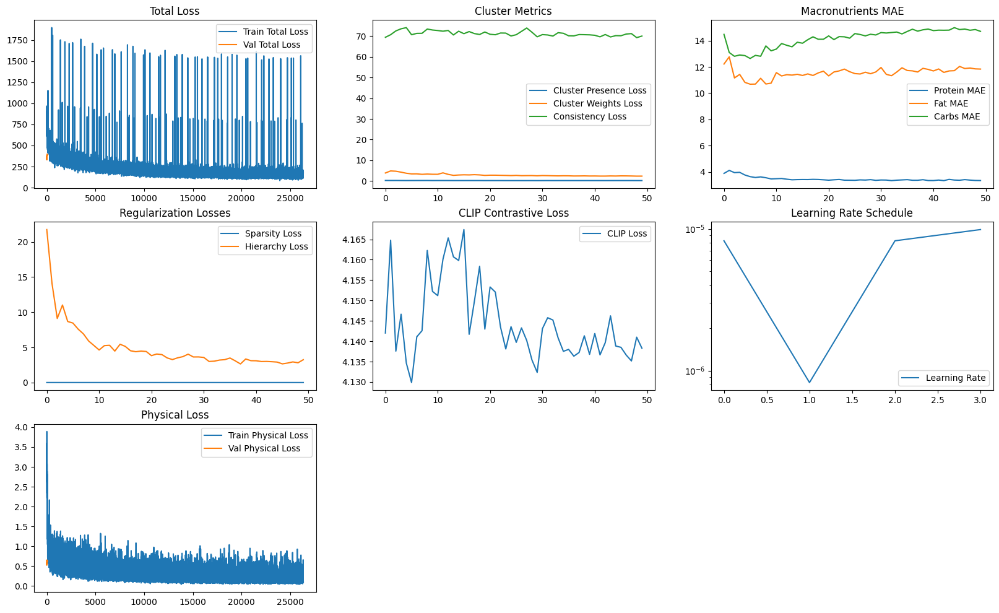

In [153]:
plt.figure(figsize=(20, 12))

# Графики для основных метрик
plt.subplot(3, 3, 1)
plt.plot(predictor.train_history['total_loss'], label='Train Total Loss')
plt.plot(predictor.val_history['total_loss'], label='Val Total Loss')
plt.title('Total Loss')
plt.legend()

# Графики для кластерных компонентов
plt.subplot(3, 3, 2)
plt.plot(predictor.val_history['presence_loss'], label='Cluster Presence Loss')
plt.plot(predictor.val_history['weights_loss'], label='Cluster Weights Loss')
plt.plot(predictor.val_history['cluster_loss'], label='Consistency Loss')
plt.title('Cluster Metrics')
plt.legend()

# Графики для БЖУ
plt.subplot(3, 3, 3)
plt.plot(predictor.val_history['mae_b'], label='Protein MAE')
plt.plot(predictor.val_history['mae_zh'], label='Fat MAE')
plt.plot(predictor.val_history['mae_u'], label='Carbs MAE')
plt.title('Macronutrients MAE')
plt.legend()

# Графики для регуляризации
plt.subplot(3, 3, 4)
plt.plot(predictor.val_history['sparsity_loss'], label='Sparsity Loss')
plt.plot(predictor.val_history['hierarchy_loss'], label='Hierarchy Loss')
plt.title('Regularization Losses')
plt.legend()

# График для CLIP loss
plt.subplot(3, 3, 5)
if any(x > 0 for x in predictor.val_history['clip']):
    plt.plot(predictor.val_history['clip'], label='CLIP Loss')
    plt.title('CLIP Contrastive Loss')
    plt.legend()

# График learning rate
plt.subplot(3, 3, 6)
lr_history = [group['lr'] for group in predictor.optimizer.param_groups]
plt.plot(lr_history, label='Learning Rate')
plt.yscale('log')
plt.title('Learning Rate Schedule')
plt.legend()


plt.subplot(3, 3, 7)
plt.plot(predictor.train_history['loss_phys'], label='Train Physical Loss')
plt.plot(predictor.val_history['loss_phys'], label='Val Physical Loss')
plt.title('Physical Loss')
plt.legend()


save_path='training_plots_clip_2.png'
if save_path:
    plt.savefig(save_path, bbox_inches='tight')
plt.show()

In [170]:
test_loader = create_cluster_dataloader(
    'ingr/test.json',
    batch_size=64,
    partition='test',
    use_text=False,

)
predictor.validate(test_loader)

Validation: 100%|██████████| 43/43 [00:19<00:00,  2.18it/s]


{'total_loss': 609.7669010605923,
 'bzu_loss': 517.3564261502997,
 'presence_loss': 0.7056435194126395,
 'weights_loss': 4.996439046637956,
 'cluster_loss': 71.77856560640556,
 'sparsity_loss': 0.012201800076074378,
 'hierarchy_loss': 14.059823280157046,
 'clip': 0.0,
 'loss_phys': 0.8577985708103624,
 'mae_b': 4.395720481872559,
 'mae_zh': 17.364238739013672,
 'mae_u': 22.85281753540039,
 'mae_cal': 146.70692443847656,
 'mape_b': 545184256.0,
 'mape_zh': 1040169088.0,
 'mape_u': 1450931456.0,
 'mape_cal': 1460733952.0}

In [ ]:
test_loader = create_cluster_dataloader(
    'ingr/test.json',
    batch_size=64,
    partition='test',
    use_text=False,

)

In [155]:
predictor.validate(test_loader)

Validation: 100%|██████████| 43/43 [00:21<00:00,  1.96it/s]

Epoch 00051: reducing learning rate of group 0 to 5.7648e-06.
Epoch 00051: reducing learning rate of group 1 to 5.7648e-07.
Epoch 00051: reducing learning rate of group 2 to 5.7648e-06.
Epoch 00051: reducing learning rate of group 3 to 6.9178e-06.


{'total_loss': 391.8329631006995,
 'bzu_loss': 307.24371337890625,
 'presence_loss': 0.19555984714696573,
 'weights_loss': 2.3712193522342417,
 'cluster_loss': 73.91467675497366,
 'sparsity_loss': 0.009908306997182757,
 'hierarchy_loss': 3.31988879137261,
 'clip': 4.164888498394988,
 'loss_phys': 0.6131107432897701,
 'mae_b': 3.3161461353302,
 'mae_zh': 12.05339241027832,
 'mae_u': 15.048133850097656,
 'mae_cal': 115.48125457763672,
 'mape_b': 235835376.0,
 'mape_zh': 310310816.0,
 'mape_u': 2149409792.0,
 'mape_cal': 369372544.0}

In [157]:
predictor.model

EnhancedClusterNutritionNet(
  (clip_model): CLIPWithCustomVision(
    (clip_model): CLIP(
      (visual): ModifiedResNet(
        (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu3): ReLU(inplace=True)
        (avgpool): AvgPool2d(kernel_size=2, stride=2, padding=0)
        (layer1): Sequential(
          (0): Bottleneck(
            (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=Fa

In [156]:


import matplotlib.pyplot as plt
import numpy as np
import torch
from torch.utils.data import DataLoader
import seaborn as sns
from PIL import Image
import os

class NutritionVisualizer:
    def __init__(self, model, device='cuda'):
        self.model = model.to(device)
        self.device = device
        self.model.eval()
        
    def denormalize_image(self, tensor):
        """Денормализует изображение для визуализации"""
        # CLIP normalization
        mean = torch.tensor([0.48145466, 0.4578275, 0.40821073])
        std = torch.tensor([0.26862954, 0.26130258, 0.27577711])
        
        # Денормализация
        for t, m, s in zip(tensor, mean, std):
            t.mul_(s).add_(m)
        
        return torch.clamp(tensor, 0, 1)
    
    def evaluate_batch(self, dataloader, num_batches=5):
        """Оценивает модель на нескольких батчах и собирает статистику"""
        all_predictions = []
        all_targets = []
        all_images = []
        all_errors = []
        all_item_ids = []
        
        with torch.no_grad():
            for batch_idx, batch in enumerate(dataloader):
                if batch_idx >= num_batches:
                    break
                
                images = batch['images'].to(self.device)
                targets = batch['targets']['bzu'].to(self.device)  # [batch_size, 3]
                
                # Получаем предсказания
                predictions = self.model(images)
                pred_bzu = predictions['bzu']  # [batch_size, 3]
                
                # Вычисляем ошибки
                errors = torch.abs(pred_bzu - targets).cpu()  # MAE для каждого нутриента
                total_errors = errors.sum(dim=1)  # Суммарная ошибка по всем нутриентам
                
                # Сохраняем данные
                all_predictions.append(pred_bzu.cpu())
                all_targets.append(targets.cpu())
                all_images.append(images.cpu())
                all_errors.append(total_errors)
                all_item_ids.extend(batch['item_ids'])
        
        # Объединяем все данные
        predictions = torch.cat(all_predictions, dim=0)
        targets = torch.cat(all_targets, dim=0)
        images = torch.cat(all_images, dim=0)
        errors = torch.cat(all_errors, dim=0)
        
        return {
            'predictions': predictions,
            'targets': targets,
            'images': images,
            'errors': errors,
            'item_ids': all_item_ids
        }
    
    def plot_random_samples(self, dataloader, num_samples=6, figsize=(15, 10)):
        """Визуализирует случайные образцы"""
        results = self.evaluate_batch(dataloader, num_batches=2)
        
        # Выбираем случайные индексы
        indices = np.random.choice(len(results['predictions']), num_samples, replace=False)
        
        fig, axes = plt.subplots(2, 3, figsize=figsize)
        fig.suptitle('Случайные предсказания', fontsize=16, fontweight='bold')
        
        for i, idx in enumerate(indices):
            row, col = i // 3, i % 3
            ax = axes[row, col]
            
            # Денормализуем и показываем изображение
            img = self.denormalize_image(results['images'][idx].clone())
            ax.imshow(img.permute(1, 2, 0))
            ax.axis('off')
            
            # Получаем данные
            pred = results['predictions'][idx]
            true = results['targets'][idx]
            error = results['errors'][idx]
            
            # Создаем заголовок с предсказаниями
            title = f"ID: {results['item_ids'][idx]}\n"
            title += f"Б: {true[0]:.1f}→{pred[0]:.1f} ({pred[0]-true[0]:+.1f})\n"
            title += f"Ж: {true[1]:.1f}→{pred[1]:.1f} ({pred[1]-true[1]:+.1f})\n"
            title += f"У: {true[2]:.1f}→{pred[2]:.1f} ({pred[2]-true[2]:+.1f})\n"
            title += f"Ошибка: {error:.1f}"
            
            ax.set_title(title, fontsize=10, ha='center')
        
        plt.tight_layout()
        plt.show()

    def plot_worst_predictions(self, dataloader, num_samples=6, figsize=(15, 10)):
        """Визуализирует худшие предсказания"""
        results = self.evaluate_batch(dataloader, num_batches=10)
        
        # Находим индексы с наибольшими ошибками
        worst_indices = torch.argsort(results['errors'], descending=True)[:num_samples]
        
        fig, axes = plt.subplots(2, 3, figsize=figsize)
        fig.suptitle('Худшие предсказания (наибольшие ошибки)', fontsize=16, fontweight='bold')
        
        for i, idx in enumerate(worst_indices):
            row, col = i // 3, i % 3
            ax = axes[row, col]
            
            # Денормализуем и показываем изображение
            img = self.denormalize_image(results['images'][idx].clone())
            ax.imshow(img.permute(1, 2, 0))
            ax.axis('off')
            
            # Получаем данные
            pred = results['predictions'][idx]
            true = results['targets'][idx]
            error = results['errors'][idx]
            
            # Создаем заголовок с предсказаниями (красным цветом для больших ошибок)
            title = f"ID: {results['item_ids'][idx]} ❌\n"
            title += f"Б: {true[0]:.1f}→{pred[0]:.1f} ({pred[0]-true[0]:+.1f})\n"
            title += f"Ж: {true[1]:.1f}→{pred[1]:.1f} ({pred[1]-true[1]:+.1f})\n"
            title += f"У: {true[2]:.1f}→{pred[2]:.1f} ({pred[2]-true[2]:+.1f})\n"
            title += f"Ошибка: {error:.1f}"
            
            ax.set_title(title, fontsize=10, ha='center', color='red', fontweight='bold')
        
        plt.tight_layout()
        plt.show()
    
    def plot_best_predictions(self, dataloader, num_samples=6, figsize=(15, 10)):
        """Визуализирует лучшие предсказания"""
        results = self.evaluate_batch(dataloader, num_batches=10)
        
        # Находим индексы с наименьшими ошибками
        best_indices = torch.argsort(results['errors'])[:num_samples]
        
        fig, axes = plt.subplots(2, 3, figsize=figsize)
        fig.suptitle('Лучшие предсказания (наименьшие ошибки)', fontsize=16, fontweight='bold')
        
        for i, idx in enumerate(best_indices):
            row, col = i // 3, i % 3
            ax = axes[row, col]
            
            # Денормализуем и показываем изображение
            img = self.denormalize_image(results['images'][idx].clone())
            ax.imshow(img.permute(1, 2, 0))
            ax.axis('off')
            
            # Получаем данные
            pred = results['predictions'][idx]
            true = results['targets'][idx]
            error = results['errors'][idx]
            
            # Создаем заголовок с предсказаниями (зеленым цветом для хороших предсказаний)
            title = f"ID: {results['item_ids'][idx]} ✅\n"
            title += f"Б: {true[0]:.1f}→{pred[0]:.1f} ({pred[0]-true[0]:+.1f})\n"
            title += f"Ж: {true[1]:.1f}→{pred[1]:.1f} ({pred[1]-true[1]:+.1f})\n"
            title += f"У: {true[2]:.1f}→{pred[2]:.1f} ({pred[2]-true[2]:+.1f})\n"
            title += f"Ошибка: {error:.1f}"
            
            ax.set_title(title, fontsize=10, ha='center', color='green', fontweight='bold')
        
        plt.tight_layout()
        plt.show()
    
    def plot_critical_errors(self, dataloader, threshold=50, num_samples=6, figsize=(15, 10)):
        """Визуализирует критические ошибки (превышающие порог)"""
        results = self.evaluate_batch(dataloader, num_batches=20)
        
        # Находим критические ошибки
        critical_mask = results['errors'] > threshold
        critical_indices = torch.where(critical_mask)[0]
        
        if len(critical_indices) == 0:
            print(f"Критических ошибок (>{threshold}) не найдено!")
            return
        
        # Выбираем случайные из критических или все если их мало
        if len(critical_indices) > num_samples:
            selected_indices = critical_indices[torch.randperm(len(critical_indices))[:num_samples]]
        else:
            selected_indices = critical_indices

        fig, axes = plt.subplots(2, 3, figsize=figsize)
        fig.suptitle(f'Критические ошибки (>{threshold})', fontsize=16, fontweight='bold')
        
        for i in range(min(num_samples, len(selected_indices))):
            row, col = i // 3, i % 3
            ax = axes[row, col]
            idx = selected_indices[i]
            
            # Денормализуем и показываем изображение
            img = self.denormalize_image(results['images'][idx].clone())
            ax.imshow(img.permute(1, 2, 0))
            ax.axis('off')
            
            # Получаем данные
            pred = results['predictions'][idx]
            true = results['targets'][idx]
            error = results['errors'][idx]
            
            # Создаем заголовок с предсказаниями (красным цветом для критических ошибок)
            title = f"ID: {results['item_ids'][idx]} 🚨\n"
            title += f"Б: {true[0]:.1f}→{pred[0]:.1f} ({pred[0]-true[0]:+.1f})\n"
            title += f"Ж: {true[1]:.1f}→{pred[1]:.1f} ({pred[1]-true[1]:+.1f})\n"
            title += f"У: {true[2]:.1f}→{pred[2]:.1f} ({pred[2]-true[2]:+.1f})\n"
            title += f"Ошибка: {error:.1f}"
            
            ax.set_title(title, fontsize=10, ha='center', color='darkred', fontweight='bold')
        
        # Скрываем пустые subplot'ы
        for i in range(len(selected_indices), num_samples):
            row, col = i // 3, i % 3
            axes[row, col].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        print(f"Найдено {len(critical_indices)} критических ошибок из {len(results['errors'])} образцов")
    
    def plot_error_distribution(self, dataloader, figsize=(15, 5)):
        """Визуализирует распределение ошибок"""
        results = self.evaluate_batch(dataloader, num_batches=20)
        
        fig, axes = plt.subplots(1, 3, figsize=figsize)
        
        # Ошибки для каждого нутриента
        nutrient_names = ['Белки', 'Жиры', 'Углеводы']
        colors = ['skyblue', 'lightcoral', 'lightgreen']
        
        for i, (name, color) in enumerate(zip(nutrient_names, colors)):
            errors = torch.abs(results['predictions'][:, i] - results['targets'][:, i])
            
            axes[i].hist(errors.numpy(), bins=30, alpha=0.7, color=color, edgecolor='black')
            axes[i].set_title(f'Распределение ошибок: {name}')
            axes[i].set_xlabel('Абсолютная ошибка (г/100г)')
            axes[i].set_ylabel('Количество')
            axes[i].grid(True, alpha=0.3)
            
            # Добавляем статистику
            mean_error = errors.mean().item()
            std_error = errors.std().item()
            axes[i].axvline(mean_error, color='red', linestyle='--', alpha=0.8, 
                           label=f'Среднее: {mean_error:.2f}')
            axes[i].legend()
        
        plt.tight_layout()
        plt.show()
    
    def create_comparison_table(self, dataloader, num_samples=10):
        """Создает таблицу сравнения предсказаний"""
        results = self.evaluate_batch(dataloader, num_batches=5)
        
        # Выбираем случайные образцы
        indices = np.random.choice(len(results['predictions']), num_samples, replace=False)
        
        # Создаем данные для таблицы
        table_data = []
        for idx in indices:
            pred = results['predictions'][idx]
            true = results['targets'][idx]
            error = results['errors'][idx]
            
            table_data.append({
                'ID': results['item_ids'][idx],
                'Белки_true': f"{true[0]:.1f}",
                'Белки_pred': f"{pred[0]:.1f}",
                'Белки_diff': f"{pred[0]-true[0]:+.1f}",
                'Жиры_true': f"{true[1]:.1f}",
                'Жиры_pred': f"{pred[1]:.1f}",
                'Жиры_diff': f"{pred[1]-true[1]:+.1f}",
                'Углеводы_true': f"{true[2]:.1f}",
                'Углеводы_pred': f"{pred[2]:.1f}",
                'Углеводы_diff': f"{pred[2]-true[2]:+.1f}",
                'Общая_ошибка': f"{error:.1f}"
            })

        import pandas as pd
        df = pd.DataFrame(table_data)
        
        # Стилизация таблицы
        def highlight_errors(val):
            try:
                num_val = float(val)
                if abs(num_val) > 10:  # Большие ошибки
                    return 'background-color: #ffcccc'
                elif abs(num_val) < 2:  # Маленькие ошибки  
                    return 'background-color: #ccffcc'
                else:
                    return 'background-color: #ffffcc'
            except:
                return ''
        
        # Применяем стиль только к колонкам с разностями
        diff_columns = [col for col in df.columns if '_diff' in col or 'ошибка' in col]
        styled_df = df.style.applymap(highlight_errors, subset=diff_columns)
        
        return styled_df

# Исправление ошибки с путями к файлам
def fix_image_paths(json_path, base_path):
    """Исправляет пути к изображениям в JSON файле"""
    with open(json_path, 'r') as f:
        data = json.load(f)
    
    for item in data:
        if 'images' in item and len(item['images']) > 0:
            # Заменяем обратные слеши на прямые
            old_path = item['images'][0].get('valid_path', '')
            fixed_path = old_path.replace('\\', '/')
            item['images'][0]['valid_path'] = fixed_path
    
    # Сохраняем исправленный файл
    fixed_json_path = json_path.replace('.json', '_fixed.json')
    with open(fixed_json_path, 'w') as f:
        json.dump(data, f)
    
    return fixed_json_path



1. Случайные образцы:


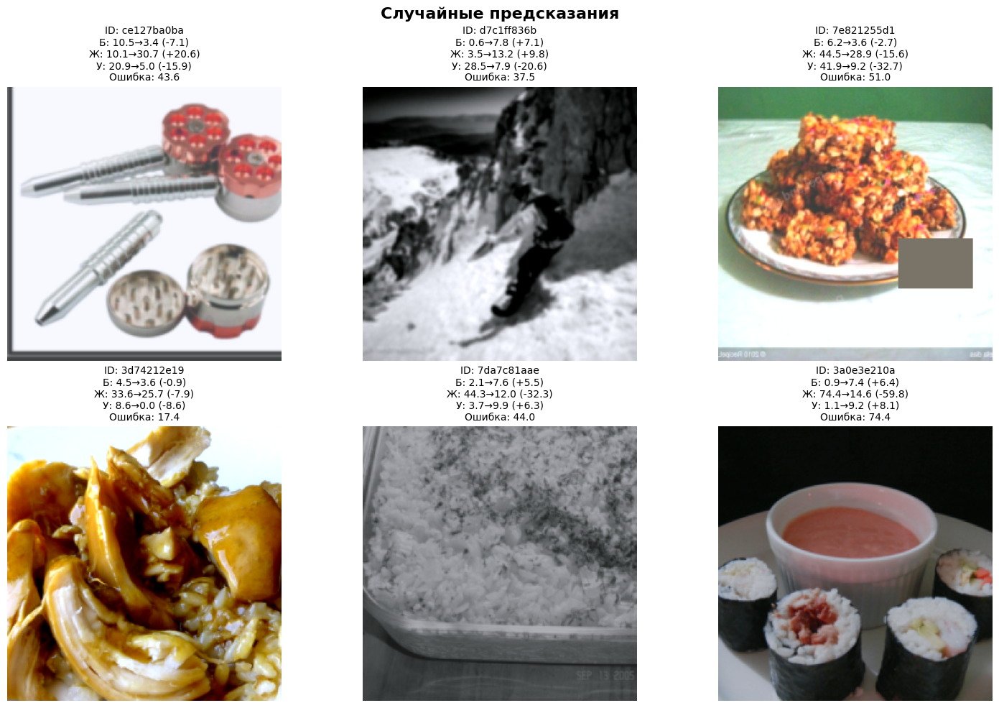

2. Худшие предсказания:


C:\Users\User\AppData\Local\Temp\ipykernel_17468\3766386285.py:141: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from current font.
  plt.tight_layout()
c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


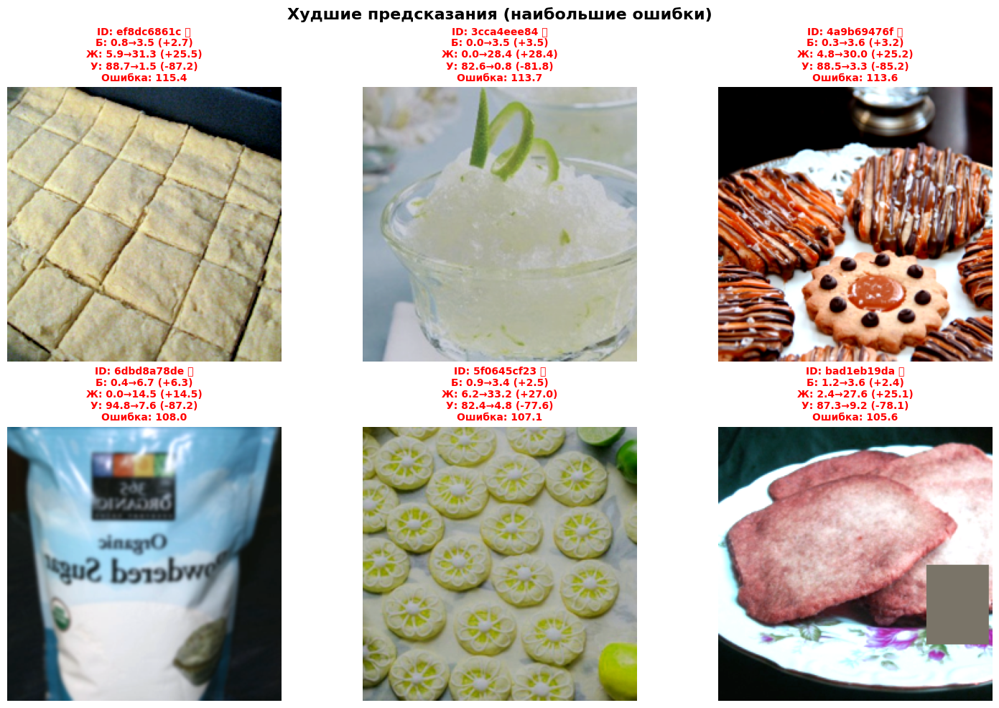

3. Лучшие предсказания:


C:\Users\User\AppData\Local\Temp\ipykernel_17468\3766386285.py:177: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  plt.tight_layout()
c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


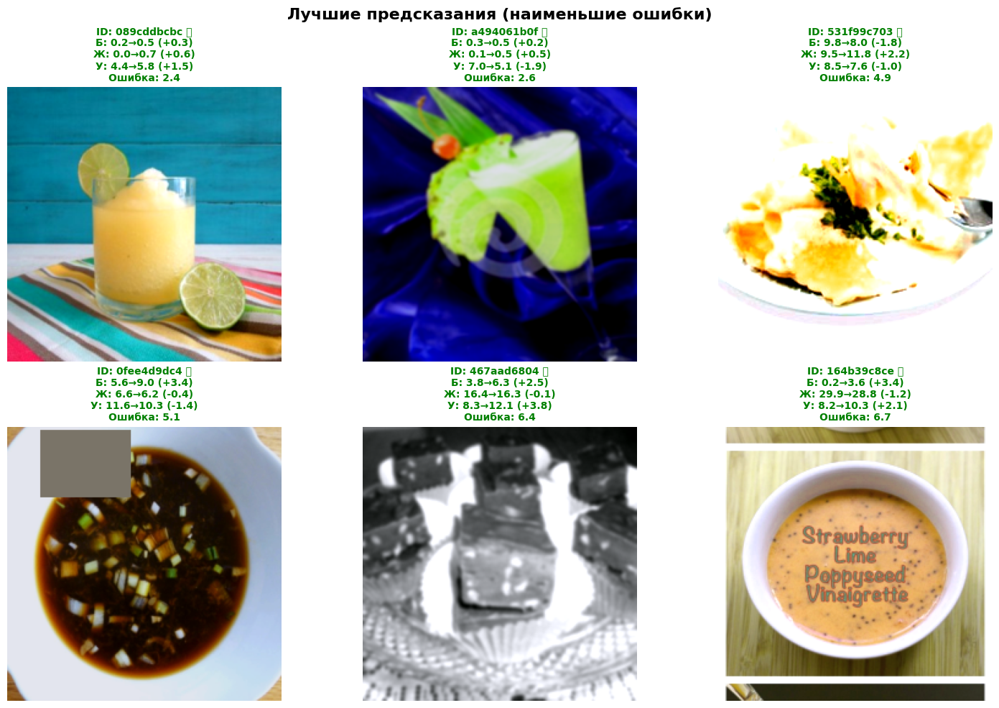

4. Критические ошибки:


C:\Users\User\AppData\Local\Temp\ipykernel_17468\3766386285.py:230: UserWarning: Glyph 128680 (\N{POLICE CARS REVOLVING LIGHT}) missing from current font.
  plt.tight_layout()
c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128680 (\N{POLICE CARS REVOLVING LIGHT}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


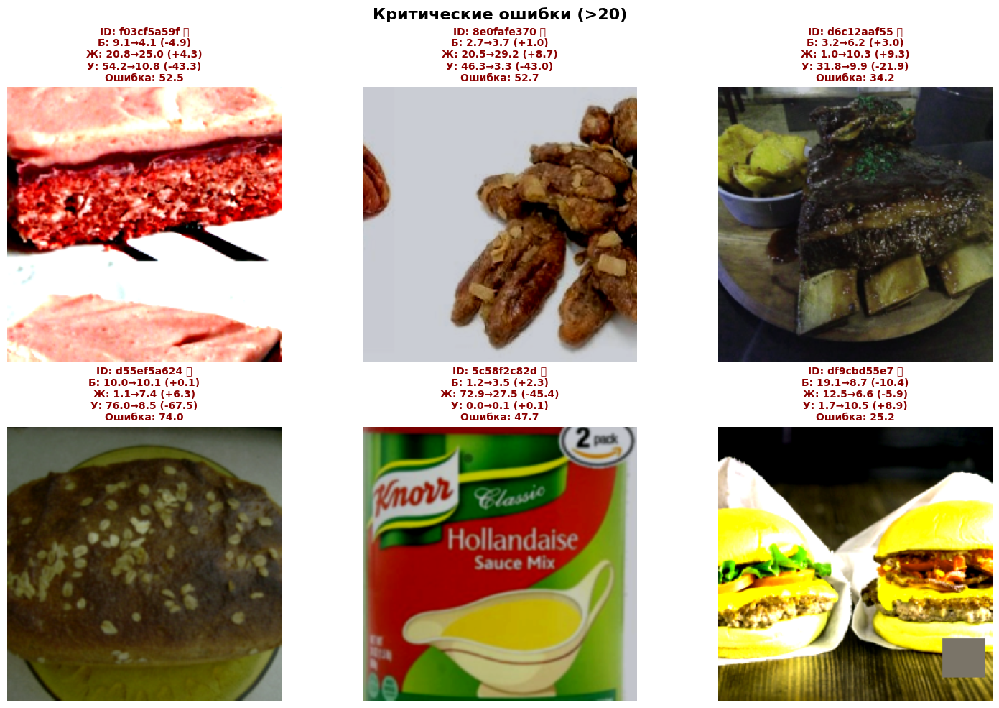

Найдено 1128 критических ошибок из 1280 образцов
5. Распределение ошибок:


c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\PIL\Image.py:981: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


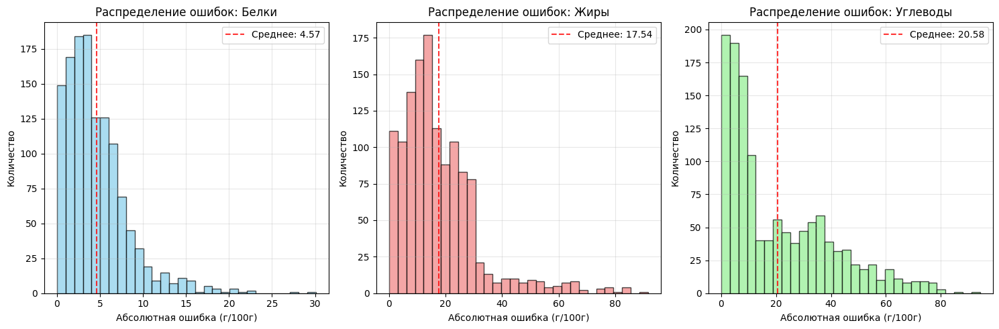

6. Таблица сравнения:


C:\Users\User\AppData\Local\Temp\ipykernel_17468\3766386285.py:310: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  styled_df = df.style.applymap(highlight_errors, subset=diff_columns)


,ID,Белки_true,Белки_pred,Белки_diff,Жиры_true,Жиры_pred,Жиры_diff,Углеводы_true,Углеводы_pred,Углеводы_diff,Общая_ошибка
0,ec70f18ebc,3.6,8.2,+4.6,25.2,4.1,-21.1,45.3,8.3,-37.0,62.7
1,715109a2e4,0.1,5.7,+5.6,0.4,13.7,+13.3,43.2,9.6,-33.6,52.5
2,ca6be231ae,3.1,4.4,+1.3,9.8,22.7,+12.9,44.7,11.4,-33.2,47.4
3,3e8b96f70d,3.6,8.7,+5.1,37.3,16.2,-21.1,38.3,11.7,-26.6,52.9
4,0d7c8c9b48,5.3,8.3,+3.0,7.5,12.4,+4.9,15.2,9.3,-5.9,13.8
5,5f353c3eed,3.3,8.5,+5.3,4.4,15.4,+11.0,14.6,12.0,-2.7,19.0
6,7866546d2a,9.3,3.6,-5.8,8.3,26.9,+18.6,43.1,10.8,-32.3,56.7
7,6ebe29ef4f,1.2,6.1,+4.9,0.4,17.2,+16.9,5.0,11.2,+6.2,28.0
8,a82be4cc7a,7.3,8.3,+1.0,1.5,13.9,+12.4,76.3,9.1,-67.2,80.6
9,f516a5dd86,0.1,8.1,+8.0,0.0,10.1,+10.1,5.1,8.1,+2.9,21.1


In [ ]:


# Создаем модель (предполагаем что она уже обучена)
model = predictor.model
# model.load_state_dict(torch.load('best_model.pth')['model_state_dict'])

# Создаем визуализатор
visualizer = NutritionVisualizer(model, device='cuda')

# Различные виды визуализации
print("1. Случайные образцы:")
visualizer.plot_random_samples(val_loader, num_samples=6)

print("2. Худшие предсказания:")
visualizer.plot_worst_predictions(val_loader, num_samples=6)

print("3. Лучшие предсказания:")  
visualizer.plot_best_predictions(val_loader, num_samples=6)

print("4. Критические ошибки:")
visualizer.plot_critical_errors(train_loader, threshold=20, num_samples=6)

print("5. Распределение ошибок:")
visualizer.plot_error_distribution(train_loader)

print("6. Таблица сравнения:")
comparison_table = visualizer.create_comparison_table(train_loader, num_samples=15)
display(comparison_table)

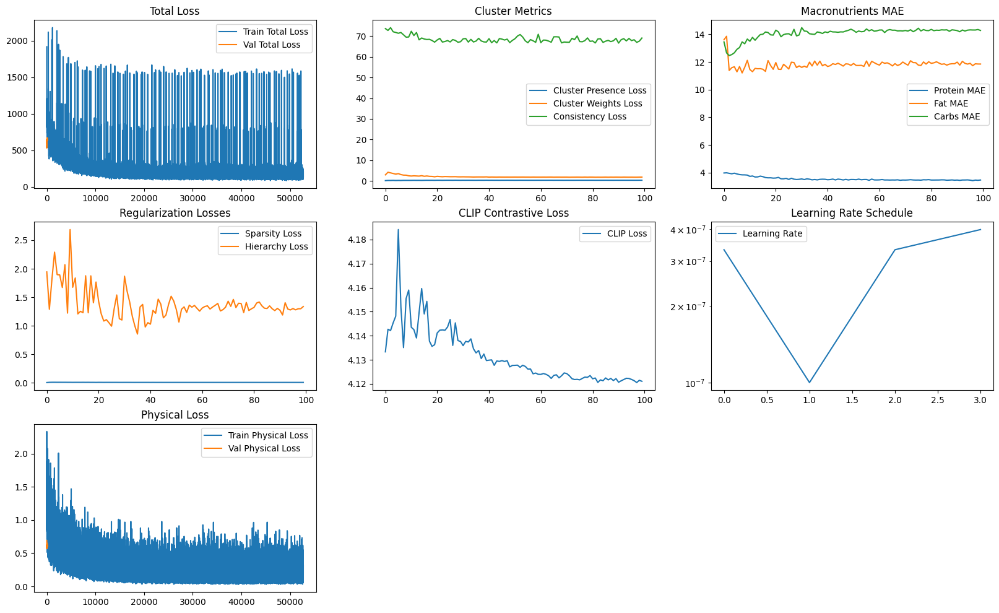

In [167]:
plt.figure(figsize=(20, 12))

# Графики для основных метрик
plt.subplot(3, 3, 1)
plt.plot(predictor2.train_history['total_loss'], label='Train Total Loss')
plt.plot(predictor2.val_history['total_loss'], label='Val Total Loss')
plt.title('Total Loss')
plt.legend()

# Графики для кластерных компонентов
plt.subplot(3, 3, 2)
plt.plot(predictor2.val_history['presence_loss'], label='Cluster Presence Loss')
plt.plot(predictor2.val_history['weights_loss'], label='Cluster Weights Loss')
plt.plot(predictor2.val_history['cluster_loss'], label='Consistency Loss')
plt.title('Cluster Metrics')
plt.legend()

# Графики для БЖУ
plt.subplot(3, 3, 3)
plt.plot(predictor2.val_history['mae_b'], label='Protein MAE')
plt.plot(predictor2.val_history['mae_zh'], label='Fat MAE')
plt.plot(predictor2.val_history['mae_u'], label='Carbs MAE')
plt.title('Macronutrients MAE')
plt.legend()

# Графики для регуляризации
plt.subplot(3, 3, 4)
plt.plot(predictor2.val_history['sparsity_loss'], label='Sparsity Loss')
plt.plot(predictor2.val_history['hierarchy_loss'], label='Hierarchy Loss')
plt.title('Regularization Losses')
plt.legend()

# График для CLIP loss
plt.subplot(3, 3, 5)
if any(x > 0 for x in predictor2.val_history['clip']):
    plt.plot(predictor2.val_history['clip'], label='CLIP Loss')
    plt.title('CLIP Contrastive Loss')
    plt.legend()

# График learning rate
plt.subplot(3, 3, 6)
lr_history = [group['lr'] for group in predictor2.optimizer.param_groups]
plt.plot(lr_history, label='Learning Rate')
plt.yscale('log')
plt.title('Learning Rate Schedule')
plt.legend()


plt.subplot(3, 3, 7)
plt.plot(predictor2.train_history['loss_phys'], label='Train Physical Loss')
plt.plot(predictor2.val_history['loss_phys'], label='Val Physical Loss')
plt.title('Physical Loss')
plt.legend()


save_path='training_plots_clip_2.png'
if save_path:
    plt.savefig(save_path, bbox_inches='tight')
plt.show()

1. Случайные образцы:


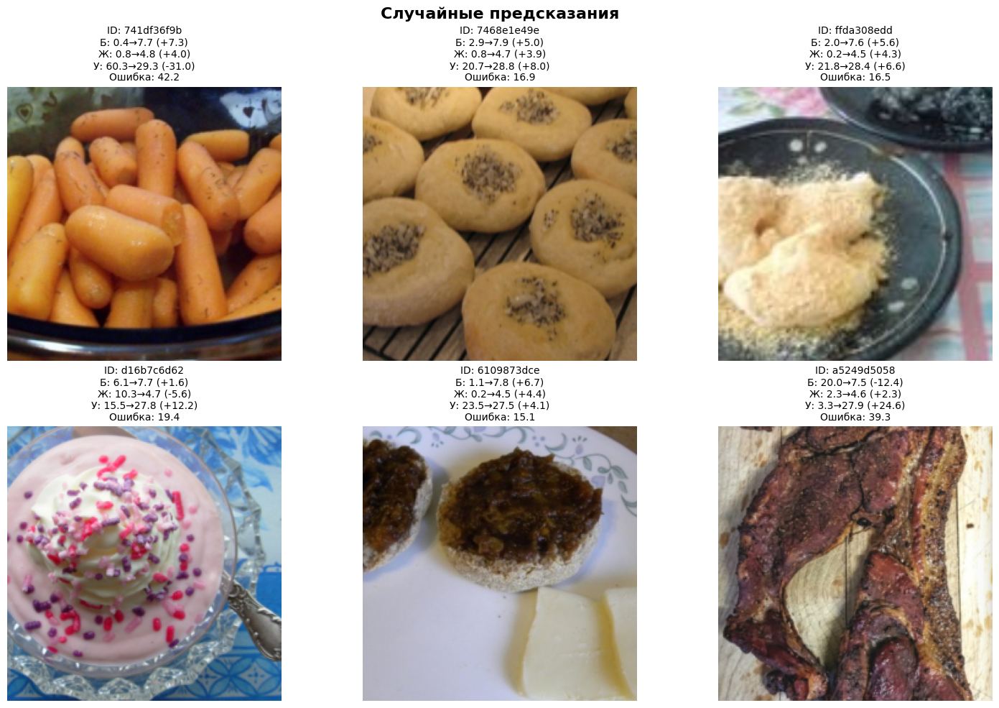

2. Худшие предсказания:


C:\Users\User\AppData\Local\Temp\ipykernel_17468\3766386285.py:141: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from current font.
  plt.tight_layout()
c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


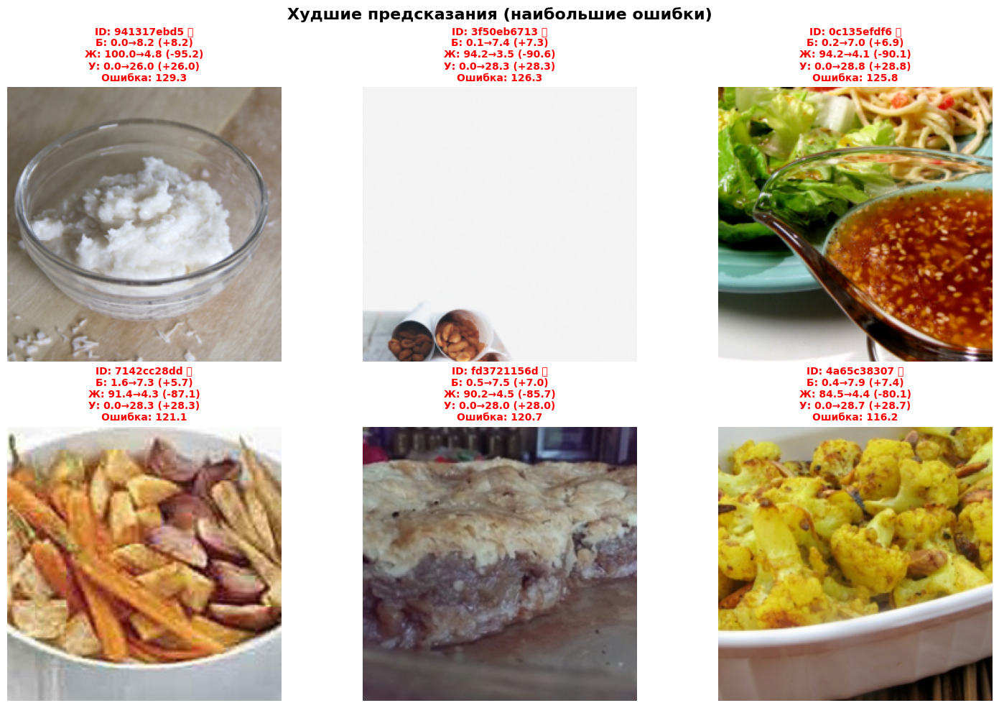

3. Лучшие предсказания:


C:\Users\User\AppData\Local\Temp\ipykernel_17468\3766386285.py:177: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  plt.tight_layout()
c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


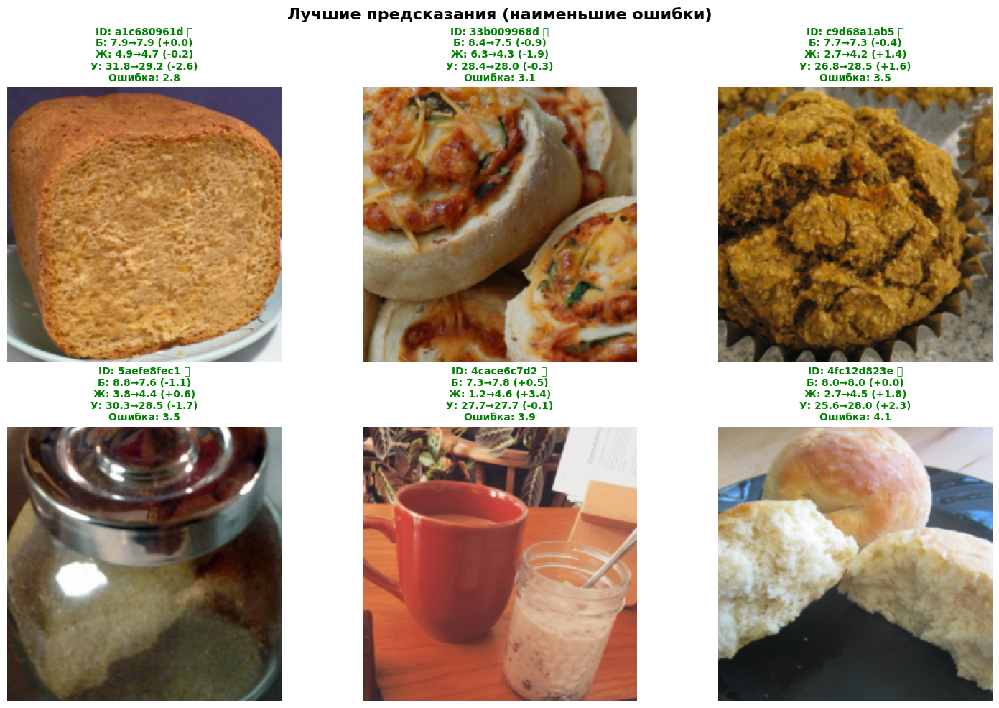

4. Критические ошибки:


C:\Users\User\AppData\Local\Temp\ipykernel_17468\3766386285.py:230: UserWarning: Glyph 128680 (\N{POLICE CARS REVOLVING LIGHT}) missing from current font.
  plt.tight_layout()
c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128680 (\N{POLICE CARS REVOLVING LIGHT}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


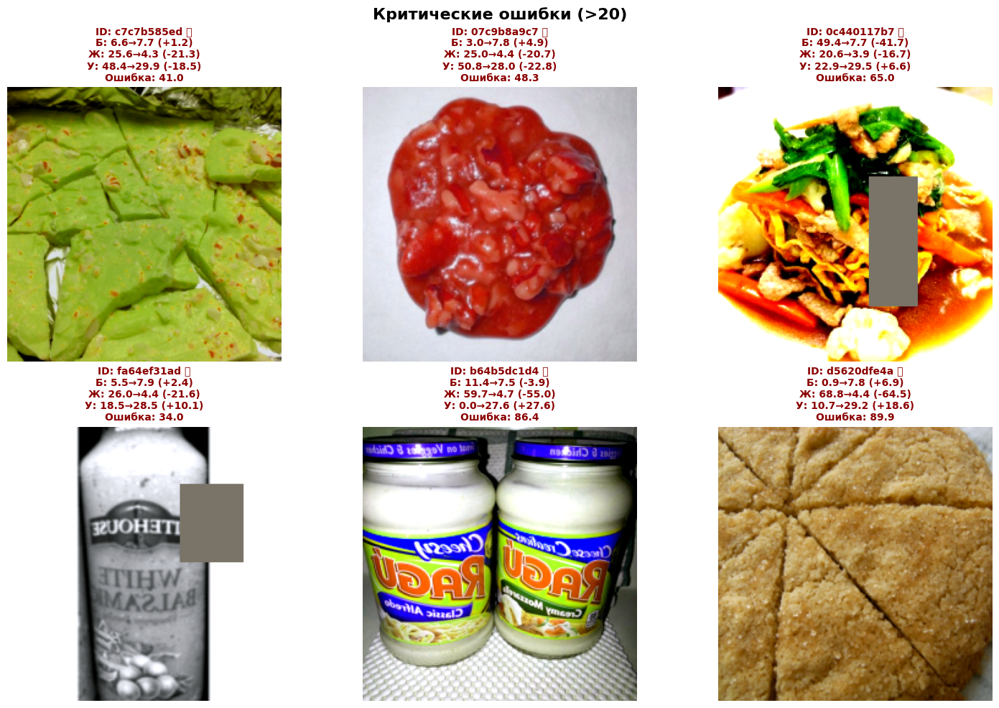

Найдено 1038 критических ошибок из 1280 образцов
5. Распределение ошибок:


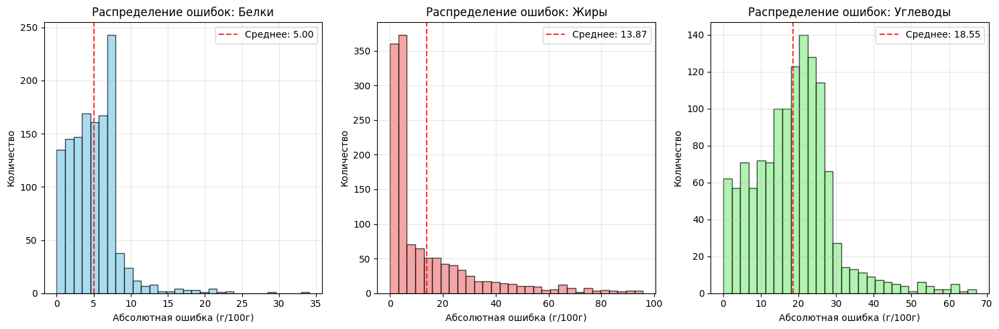

6. Таблица сравнения:


C:\Users\User\AppData\Local\Temp\ipykernel_17468\3766386285.py:310: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  styled_df = df.style.applymap(highlight_errors, subset=diff_columns)


,ID,Белки_true,Белки_pred,Белки_diff,Жиры_true,Жиры_pred,Жиры_diff,Углеводы_true,Углеводы_pred,Углеводы_diff,Общая_ошибка
0,edd482c20e,1.6,8.0,+6.3,29.8,4.8,-25.0,2.5,26.6,+24.1,55.4
1,d16b7c6d62,6.1,7.7,+1.6,10.3,4.7,-5.6,15.5,27.8,+12.2,19.4
2,8b6e5e239e,11.1,7.7,-3.4,10.8,4.4,-6.4,26.9,28.2,+1.3,11.1
3,e58ff513dc,5.0,8.1,+3.2,0.2,4.5,+4.2,10.3,27.8,+17.5,24.9
4,da159048a8,11.1,7.2,-3.9,3.3,4.1,+0.8,2.3,28.7,+26.4,31.1
5,4302dfa8dd,35.5,7.2,-28.3,25.6,4.2,-21.4,3.6,30.4,+26.8,76.4
6,d3e2ee6f21,14.9,7.2,-7.6,12.7,4.3,-8.3,7.0,28.0,+21.0,36.9
7,baf4d4c42a,4.4,8.0,+3.6,21.1,4.7,-16.4,59.9,27.3,-32.6,52.7
8,1dac377ff6,5.1,7.4,+2.3,41.5,4.7,-36.8,35.4,28.0,-7.4,46.6
9,cbed0a726f,0.3,7.7,+7.4,2.1,4.6,+2.5,33.7,26.9,-6.9,16.8


In [169]:


# Создаем модель (предполагаем что она уже обучена)
model = predictor2.model
# model.load_state_dict(torch.load('best_model.pth')['model_state_dict'])

# Создаем визуализатор
visualizer = NutritionVisualizer(model, device='cuda')

# Различные виды визуализации
print("1. Случайные образцы:")
visualizer.plot_random_samples(val_loader, num_samples=6)

print("2. Худшие предсказания:")
visualizer.plot_worst_predictions(val_loader, num_samples=6)

print("3. Лучшие предсказания:")  
visualizer.plot_best_predictions(val_loader, num_samples=6)

print("4. Критические ошибки:")
visualizer.plot_critical_errors(train_loader, threshold=20, num_samples=6)

print("5. Распределение ошибок:")
visualizer.plot_error_distribution(val_loader)

print("6. Таблица сравнения:")
comparison_table = visualizer.create_comparison_table(val_loader, num_samples=15)
display(comparison_table)